# Download the dataset and supporting codes and pre-trained models

https://drive.google.com/file/d/1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt/view?usp=drivesdk

https://drive.google.com/file/d/1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu/view?usp=drivesdk

https://drive.google.com/file/d/1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro/view?usp=drivesdk

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import auth
auth.authenticate_user()
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')
import io
import os
from googleapiclient.http import MediaIoBaseDownload
def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    downloaded.seek(0)
    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)
    with open(fn, 'wb') as f:
        f.write(downloaded.read())
id_to_fn = {
# '1D3rH-gSxIECZnoyc5k77PEucKBVzoiBc': 'edges2shoes.zip',
'1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt': 'edges2shoes.zip',
'1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu': 'CycleGAN_support.zip',
# '1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro': 'test_case.zip',
'1l7gHikhCz64hYHL4n_Ps7nufQcddcRyR': 'test_case.zip'

}
# download all files into the vm
for fid, fn in id_to_fn.items():
    print("Downloading %s from %s" % (fn, fid))
    download_file(fn, fid)

In [ ]:
! unzip -q edges2shoes.zip
! unzip -q CycleGAN_support.zip
! unzip -q test_case.zip

# CycleGAN training (TODO)

In [ ]:
!pip install torch torchvision torchaudio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 5.8 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [ ]:
import torch
import pdb

D_A = torch.load('./test_case/D_A.pt')
D_B = torch.load('./test_case/D_B.pt',)
G_BA = torch.load('./test_case/G_BA.pt',)
G_AB = torch.load('./test_case/G_AB.pt',)
valid = torch.load('./test_case/valid.pt',)
fake = torch.load('./test_case/fake.pt',)
fake_A = torch.load('./test_case/fake_A.pt',)
fake_B = torch.load('./test_case/fake_B.pt',)
real_A = torch.load('./test_case/real_A.pt',)
real_B = torch.load('./test_case/real_B.pt',)
criterion_GAN = torch.load('./test_case/criterion_GAN.pt',)
criterion_cycle = torch.load('./test_case/criterion_cycle.pt',)



def loss_discriminator(fakefG, D, real2D, valid, fake, criterion_GAN):
    '''
    loss_discriminator function is applied to compute loss for discriminator D_A and D_B,
    For example, we want to compute loss for D_A. The loss is consisted of two parts:
    D(real_A) and D(G(real_B)). We want to penalize the distance between D(real_A) part and 1 and
    distance between D(G(real_B)) part and 0.
    We will want to first compute discriminator loss given real_A and valid, which is all 1.
    Then we want to forward real_A through G_AB network to get fake image batch
    and compute discriminator loss given fake batch and fake, which is all 0.
    Finall, add up these two loss as the total discriminator loss.
    '''

    #####################



    fake_images_detached = fakefG.detach()
    predictions_fake = D(fake_images_detached)
    predictions_real = D(real2D)
    loss_val_fake2 = criterion_GAN(predictions_fake, fake)
    loss_val_real1 = criterion_GAN(predictions_real, valid)


    loss_D = (loss_val_fake2 + loss_val_real1)

    #####################


    return loss_D



def loss_generator(G, real2G, D, valid, criterion_GAN):
    '''
    loss_generator function is applied to compute loss for both generator G_AB and G_BA:
    For example, we want to compute the loss for G_AB.
    real2G will be the real image in domain A, then we map real2G into domain B to get fake B,
    then we compute the loss between D_B(fake_B) and valid, which is all 1.
    The fake_B image will also be one of the outputs, since we want to use it in the loss_cycle_consis.
    '''

    #####################

    fake_o_G = G(real2G)


    discriminatorsOuput_on_fake = D(fake_o_G)


    loss_G = criterion_GAN(discriminatorsOuput_on_fake, valid)

    #####################

    return loss_G, fake_o_G



def loss_cycle_consis(G, fakefG, real, criterion_cycle):
    '''
    loss_cycle_consis function is applied to both cycle consistency loss:
    between recovered A and original A,
    between recovered B and original B.
    For example, we want to compute the cycle consistency loss between recovered A and original A.
    fake2G will be the generated image in domain B, then we map fake2G back into domain A to get recovered A,
    then we compute the loss between recovered A and original A
    '''

    ###################

    loss_cycle = criterion_cycle(G(fakefG),real)

    ###################

    return loss_cycle


# test case

test_loss_GAN_AB = torch.load('./test_case/loss_GAN_AB.pt')
test_loss_cycle_A = torch.load('./test_case/loss_cycle_A.pt')
test_loss_D_A = torch.load('./test_case/loss_D_A.pt')
loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)


print('test case loss_D_A:', test_loss_D_A.item())
print('computed loss_D_A:', loss_D_A.item())

print('test case test_loss_GAN_AB:', test_loss_GAN_AB.item())
print('computed test_loss_GAN_AB:', loss_GAN_AB.item())

print('test case loss_cycle_A:', test_loss_cycle_A.item())
print('computed loss_cycle_A:', loss_cycle_A.item())

test case loss_D_A: 3.1760239601135254
computed loss_D_A: 3.1761722564697266
test case test_loss_GAN_AB: 3.164881467819214
computed test_loss_GAN_AB: 3.1638381481170654
test case loss_cycle_A: 0.6627261638641357
computed loss_cycle_A: 0.6628221273422241


cuda:0
the length of training data: 49825


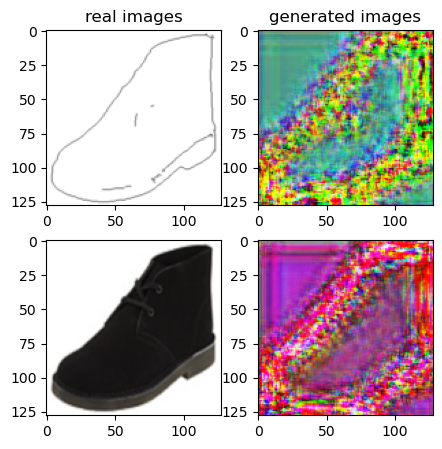

Train Epoch: 1 0% 	Total Loss: 10.523669 	Loss_G_AB: 1.610166	Loss_G_BA: 2.050557	Loss_cycle: 5.348492	Loss_D_A: 1.371897	Loss_D_B: 1.972919
0 9 T:  0.91141676902771
Train Epoch: 1 0% 	Total Loss: 5.657029 	Loss_G_AB: 1.309371	Loss_G_BA: 0.984444	Loss_cycle: 2.419364	Loss_D_A: 0.946929	Loss_D_B: 1.143829
0 19 T:  0.6450700759887695
Train Epoch: 1 0% 	Total Loss: 4.080393 	Loss_G_AB: 0.836250	Loss_G_BA: 0.972346	Loss_cycle: 2.022592	Loss_D_A: 0.651959	Loss_D_B: 0.501544
0 29 T:  0.6483645439147949
Train Epoch: 1 0% 	Total Loss: 4.163640 	Loss_G_AB: 0.700459	Loss_G_BA: 0.933177	Loss_cycle: 2.347007	Loss_D_A: 0.512221	Loss_D_B: 0.487594
0 39 T:  0.648155927658081
Train Epoch: 1 0% 	Total Loss: 3.438325 	Loss_G_AB: 0.740389	Loss_G_BA: 0.810268	Loss_cycle: 1.730431	Loss_D_A: 0.400475	Loss_D_B: 0.532091
0 49 T:  0.6546535491943359
Train Epoch: 1 0% 	Total Loss: 3.132291 	Loss_G_AB: 0.607161	Loss_G_BA: 0.727305	Loss_cycle: 1.715734	Loss_D_A: 0.386328	Loss_D_B: 0.362996
0 59 T:  0.653261899948

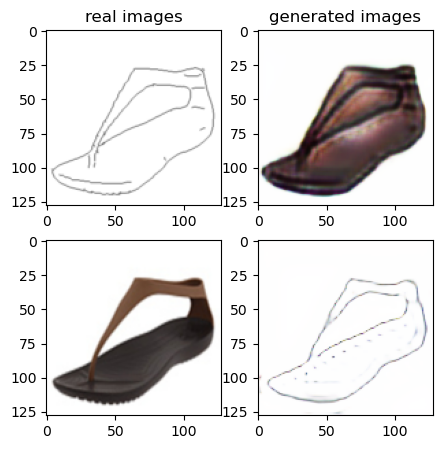

Train Epoch: 1 2% 	Total Loss: 1.956072 	Loss_G_AB: 0.401276	Loss_G_BA: 0.896966	Loss_cycle: 0.984313	Loss_D_A: 0.082657	Loss_D_B: 0.239981
0 1009 T:  0.9536943435668945
Train Epoch: 1 2% 	Total Loss: 1.618206 	Loss_G_AB: 0.400337	Loss_G_BA: 0.762564	Loss_cycle: 0.746263	Loss_D_A: 0.087306	Loss_D_B: 0.203187
0 1019 T:  0.6354939937591553
Train Epoch: 1 2% 	Total Loss: 2.022517 	Loss_G_AB: 0.428181	Loss_G_BA: 0.811465	Loss_cycle: 1.042863	Loss_D_A: 0.088508	Loss_D_B: 0.271323
0 1029 T:  0.6412343978881836
Train Epoch: 1 2% 	Total Loss: 1.904783 	Loss_G_AB: 0.389836	Loss_G_BA: 0.826158	Loss_cycle: 0.989954	Loss_D_A: 0.064672	Loss_D_B: 0.242160
0 1039 T:  0.6443648338317871
Train Epoch: 1 2% 	Total Loss: 1.746589 	Loss_G_AB: 0.440789	Loss_G_BA: 0.743524	Loss_cycle: 0.742647	Loss_D_A: 0.191694	Loss_D_B: 0.220092
0 1049 T:  0.6581425666809082
Train Epoch: 1 2% 	Total Loss: 1.580380 	Loss_G_AB: 0.449321	Loss_G_BA: 0.786345	Loss_cycle: 0.668644	Loss_D_A: 0.068411	Loss_D_B: 0.225492
0 1059 T: 

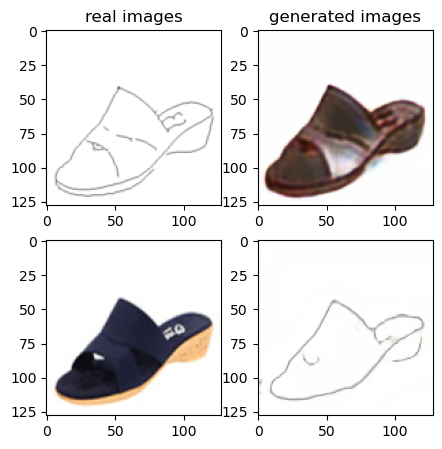

Train Epoch: 1 4% 	Total Loss: 1.758979 	Loss_G_AB: 0.332510	Loss_G_BA: 0.686774	Loss_cycle: 0.857835	Loss_D_A: 0.129836	Loss_D_B: 0.261667
0 2009 T:  0.9752483367919922
Train Epoch: 1 4% 	Total Loss: 2.082930 	Loss_G_AB: 0.329891	Loss_G_BA: 0.820423	Loss_cycle: 1.184573	Loss_D_A: 0.090469	Loss_D_B: 0.232732
0 2019 T:  0.6567895412445068
Train Epoch: 1 4% 	Total Loss: 2.088458 	Loss_G_AB: 0.386847	Loss_G_BA: 0.789698	Loss_cycle: 1.104485	Loss_D_A: 0.138382	Loss_D_B: 0.257318
0 2029 T:  0.6642050743103027
Train Epoch: 1 4% 	Total Loss: 1.456207 	Loss_G_AB: 0.319446	Loss_G_BA: 0.614028	Loss_cycle: 0.625059	Loss_D_A: 0.105736	Loss_D_B: 0.258676
0 2039 T:  0.6663868427276611
Train Epoch: 1 4% 	Total Loss: 1.635382 	Loss_G_AB: 0.341195	Loss_G_BA: 0.824972	Loss_cycle: 0.676507	Loss_D_A: 0.092705	Loss_D_B: 0.283085
0 2049 T:  0.6527924537658691
Train Epoch: 1 4% 	Total Loss: 1.574454 	Loss_G_AB: 0.457661	Loss_G_BA: 0.841394	Loss_cycle: 0.648516	Loss_D_A: 0.112012	Loss_D_B: 0.164398
0 2059 T: 

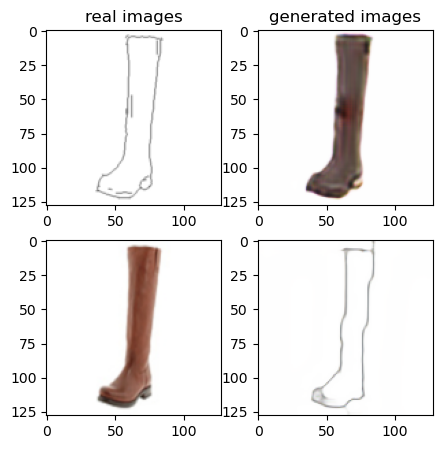

Train Epoch: 1 6% 	Total Loss: 1.469013 	Loss_G_AB: 0.319406	Loss_G_BA: 0.611108	Loss_cycle: 0.571958	Loss_D_A: 0.174976	Loss_D_B: 0.256823
0 3009 T:  1.1207828521728516
Train Epoch: 1 6% 	Total Loss: 1.112223 	Loss_G_AB: 0.340658	Loss_G_BA: 0.451720	Loss_cycle: 0.274440	Loss_D_A: 0.212383	Loss_D_B: 0.229212
0 3019 T:  0.6862199306488037
Train Epoch: 1 6% 	Total Loss: 1.321694 	Loss_G_AB: 0.384739	Loss_G_BA: 0.414443	Loss_cycle: 0.304955	Loss_D_A: 0.284269	Loss_D_B: 0.332879
0 3029 T:  0.6913588047027588
Train Epoch: 1 6% 	Total Loss: 1.211392 	Loss_G_AB: 0.312817	Loss_G_BA: 0.420803	Loss_cycle: 0.348614	Loss_D_A: 0.204780	Loss_D_B: 0.291188
0 3039 T:  0.6885623931884766
Train Epoch: 1 6% 	Total Loss: 1.301085 	Loss_G_AB: 0.274974	Loss_G_BA: 0.396009	Loss_cycle: 0.478972	Loss_D_A: 0.206888	Loss_D_B: 0.279733
0 3049 T:  0.672100305557251
Train Epoch: 1 6% 	Total Loss: 1.253077 	Loss_G_AB: 0.312953	Loss_G_BA: 0.449149	Loss_cycle: 0.369919	Loss_D_A: 0.239741	Loss_D_B: 0.262366
0 3059 T:  

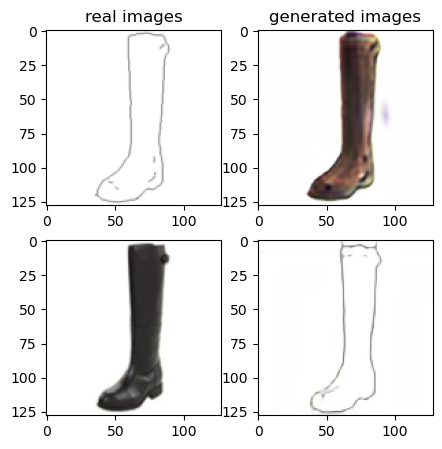

Train Epoch: 1 8% 	Total Loss: 1.343668 	Loss_G_AB: 0.353205	Loss_G_BA: 0.623025	Loss_cycle: 0.414028	Loss_D_A: 0.199136	Loss_D_B: 0.242389
0 4009 T:  1.0147888660430908
Train Epoch: 1 8% 	Total Loss: 2.052078 	Loss_G_AB: 0.408760	Loss_G_BA: 0.728808	Loss_cycle: 0.997634	Loss_D_A: 0.125220	Loss_D_B: 0.360440
0 4019 T:  0.6614627838134766
Train Epoch: 1 8% 	Total Loss: 1.528234 	Loss_G_AB: 0.321070	Loss_G_BA: 0.614248	Loss_cycle: 0.649063	Loss_D_A: 0.165310	Loss_D_B: 0.246203
0 4029 T:  0.677283763885498
Train Epoch: 1 8% 	Total Loss: 1.549007 	Loss_G_AB: 0.326544	Loss_G_BA: 0.649891	Loss_cycle: 0.631326	Loss_D_A: 0.172832	Loss_D_B: 0.256633
0 4039 T:  0.6832499504089355
Train Epoch: 1 8% 	Total Loss: 1.610497 	Loss_G_AB: 0.379911	Loss_G_BA: 0.679790	Loss_cycle: 0.660725	Loss_D_A: 0.088094	Loss_D_B: 0.331827
0 4049 T:  0.6818304061889648
Train Epoch: 1 8% 	Total Loss: 2.108764 	Loss_G_AB: 0.375296	Loss_G_BA: 0.822354	Loss_cycle: 1.107499	Loss_D_A: 0.184435	Loss_D_B: 0.218005
0 4059 T:  

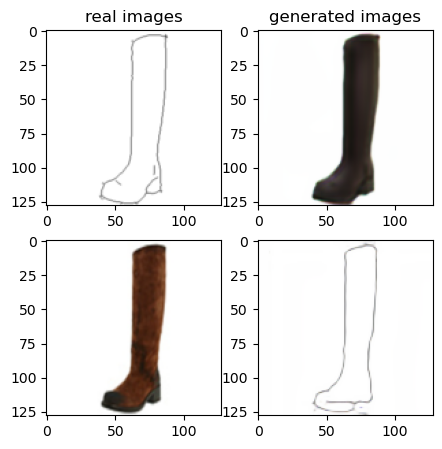

Train Epoch: 1 10% 	Total Loss: 1.106511 	Loss_G_AB: 0.290558	Loss_G_BA: 0.364420	Loss_cycle: 0.271176	Loss_D_A: 0.225929	Loss_D_B: 0.281916
0 5009 T:  1.003821611404419
Train Epoch: 1 10% 	Total Loss: 1.311888 	Loss_G_AB: 0.261189	Loss_G_BA: 0.487396	Loss_cycle: 0.463144	Loss_D_A: 0.204880	Loss_D_B: 0.269572
0 5019 T:  0.6673183441162109
Train Epoch: 1 10% 	Total Loss: 1.194272 	Loss_G_AB: 0.279916	Loss_G_BA: 0.408058	Loss_cycle: 0.388391	Loss_D_A: 0.205751	Loss_D_B: 0.256144
0 5029 T:  0.666520357131958
Train Epoch: 1 10% 	Total Loss: 1.280043 	Loss_G_AB: 0.300324	Loss_G_BA: 0.438783	Loss_cycle: 0.496425	Loss_D_A: 0.169322	Loss_D_B: 0.244743
0 5039 T:  0.6803815364837646
Train Epoch: 1 10% 	Total Loss: 1.551423 	Loss_G_AB: 0.282473	Loss_G_BA: 0.602726	Loss_cycle: 0.643699	Loss_D_A: 0.210557	Loss_D_B: 0.254566
0 5049 T:  0.6836826801300049
Train Epoch: 1 10% 	Total Loss: 1.298452 	Loss_G_AB: 0.269078	Loss_G_BA: 0.474669	Loss_cycle: 0.516042	Loss_D_A: 0.157400	Loss_D_B: 0.253137
0 5059

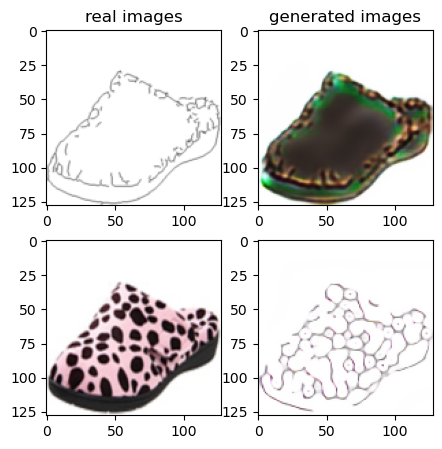

Train Epoch: 1 12% 	Total Loss: 1.868229 	Loss_G_AB: 0.355603	Loss_G_BA: 1.060398	Loss_cycle: 0.889521	Loss_D_A: 0.045861	Loss_D_B: 0.224847
0 6009 T:  1.0568854808807373
Train Epoch: 1 12% 	Total Loss: 1.693627 	Loss_G_AB: 0.260611	Loss_G_BA: 0.722278	Loss_cycle: 0.835958	Loss_D_A: 0.077657	Loss_D_B: 0.288568
0 6019 T:  0.6591525077819824
Train Epoch: 1 12% 	Total Loss: 1.644192 	Loss_G_AB: 0.287138	Loss_G_BA: 0.979553	Loss_cycle: 0.691195	Loss_D_A: 0.070535	Loss_D_B: 0.249116
0 6029 T:  0.6790444850921631
Train Epoch: 1 12% 	Total Loss: 1.624793 	Loss_G_AB: 0.329545	Loss_G_BA: 0.582567	Loss_cycle: 0.755707	Loss_D_A: 0.143642	Loss_D_B: 0.269387
0 6039 T:  0.6842701435089111
Train Epoch: 1 12% 	Total Loss: 1.588256 	Loss_G_AB: 0.288446	Loss_G_BA: 0.779514	Loss_cycle: 0.709156	Loss_D_A: 0.072993	Loss_D_B: 0.272127
0 6049 T:  0.6933231353759766
Train Epoch: 1 12% 	Total Loss: 1.420698 	Loss_G_AB: 0.312171	Loss_G_BA: 0.730609	Loss_cycle: 0.480753	Loss_D_A: 0.189318	Loss_D_B: 0.229237
0 60

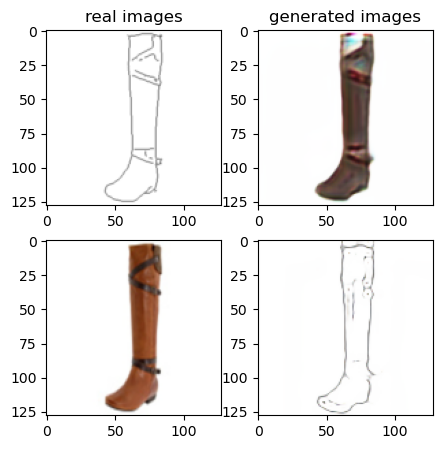

Train Epoch: 1 14% 	Total Loss: 1.421518 	Loss_G_AB: 0.315564	Loss_G_BA: 0.646568	Loss_cycle: 0.472288	Loss_D_A: 0.202971	Loss_D_B: 0.265193
0 7009 T:  1.0120930671691895
Train Epoch: 1 14% 	Total Loss: 1.451890 	Loss_G_AB: 0.267802	Loss_G_BA: 0.741198	Loss_cycle: 0.571230	Loss_D_A: 0.105412	Loss_D_B: 0.270747
0 7019 T:  0.6625933647155762
Train Epoch: 1 14% 	Total Loss: 1.678721 	Loss_G_AB: 0.305910	Loss_G_BA: 0.808451	Loss_cycle: 0.764723	Loss_D_A: 0.066435	Loss_D_B: 0.290383
0 7029 T:  0.6808090209960938
Train Epoch: 1 14% 	Total Loss: 1.462468 	Loss_G_AB: 0.300613	Loss_G_BA: 0.778849	Loss_cycle: 0.584916	Loss_D_A: 0.072902	Loss_D_B: 0.264919
0 7039 T:  0.6715209484100342
Train Epoch: 1 14% 	Total Loss: 1.411707 	Loss_G_AB: 0.296039	Loss_G_BA: 0.698998	Loss_cycle: 0.564753	Loss_D_A: 0.089850	Loss_D_B: 0.259585
0 7049 T:  0.6777064800262451
Train Epoch: 1 14% 	Total Loss: 1.707246 	Loss_G_AB: 0.351500	Loss_G_BA: 0.706346	Loss_cycle: 0.744259	Loss_D_A: 0.124273	Loss_D_B: 0.309792
0 70

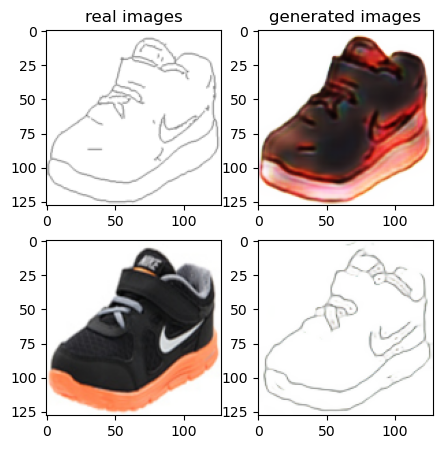

Train Epoch: 1 16% 	Total Loss: 1.429564 	Loss_G_AB: 0.284996	Loss_G_BA: 0.724146	Loss_cycle: 0.556984	Loss_D_A: 0.098727	Loss_D_B: 0.269283
0 8009 T:  1.024275302886963
Train Epoch: 1 16% 	Total Loss: 2.009838 	Loss_G_AB: 0.292804	Loss_G_BA: 0.801718	Loss_cycle: 1.076292	Loss_D_A: 0.126205	Loss_D_B: 0.260080
0 8019 T:  0.6646428108215332
Train Epoch: 1 16% 	Total Loss: 1.559153 	Loss_G_AB: 0.260514	Loss_G_BA: 0.699370	Loss_cycle: 0.708901	Loss_D_A: 0.083359	Loss_D_B: 0.286952
0 8029 T:  0.6683948040008545
Train Epoch: 1 16% 	Total Loss: 1.680764 	Loss_G_AB: 0.278478	Loss_G_BA: 0.758432	Loss_cycle: 0.823603	Loss_D_A: 0.082347	Loss_D_B: 0.256359
0 8039 T:  0.6685957908630371
Train Epoch: 1 16% 	Total Loss: 1.704348 	Loss_G_AB: 0.273314	Loss_G_BA: 0.720875	Loss_cycle: 0.873048	Loss_D_A: 0.083035	Loss_D_B: 0.251170
0 8049 T:  0.6735522747039795
Train Epoch: 1 16% 	Total Loss: 1.749152 	Loss_G_AB: 0.297859	Loss_G_BA: 0.742742	Loss_cycle: 0.843755	Loss_D_A: 0.147715	Loss_D_B: 0.237382
0 805

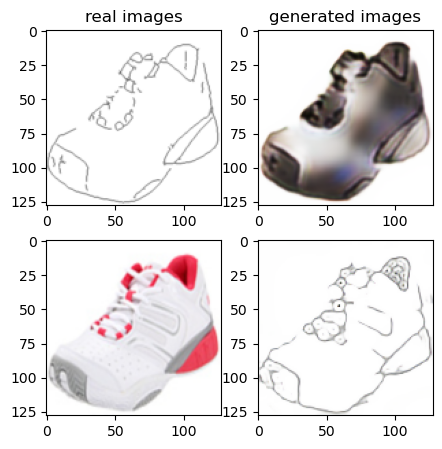

Train Epoch: 1 18% 	Total Loss: 1.739779 	Loss_G_AB: 0.296253	Loss_G_BA: 0.883393	Loss_cycle: 0.743696	Loss_D_A: 0.125993	Loss_D_B: 0.280267
0 9009 T:  1.0608580112457275
Train Epoch: 1 18% 	Total Loss: 2.040430 	Loss_G_AB: 0.411154	Loss_G_BA: 0.827927	Loss_cycle: 1.110840	Loss_D_A: 0.076951	Loss_D_B: 0.233098
0 9019 T:  0.6724162101745605
Train Epoch: 1 18% 	Total Loss: 1.794928 	Loss_G_AB: 0.354711	Loss_G_BA: 0.718965	Loss_cycle: 0.874391	Loss_D_A: 0.118764	Loss_D_B: 0.264935
0 9029 T:  0.713289737701416
Train Epoch: 1 18% 	Total Loss: 1.619608 	Loss_G_AB: 0.327673	Loss_G_BA: 0.633893	Loss_cycle: 0.672942	Loss_D_A: 0.205974	Loss_D_B: 0.259910
0 9039 T:  0.7092282772064209
Train Epoch: 1 18% 	Total Loss: 1.510130 	Loss_G_AB: 0.278165	Loss_G_BA: 0.671418	Loss_cycle: 0.683177	Loss_D_A: 0.100743	Loss_D_B: 0.251417
0 9049 T:  0.6936981678009033
Train Epoch: 1 18% 	Total Loss: 1.692708 	Loss_G_AB: 0.321631	Loss_G_BA: 0.850375	Loss_cycle: 0.807747	Loss_D_A: 0.059150	Loss_D_B: 0.239808
0 905

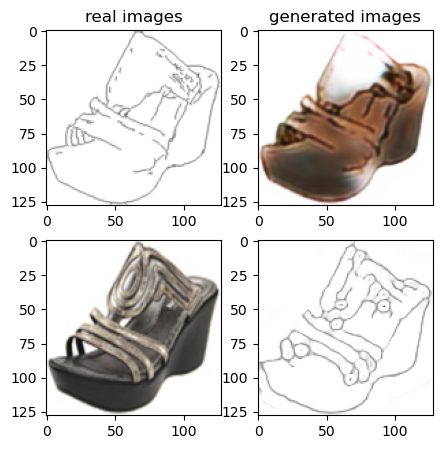

Train Epoch: 1 20% 	Total Loss: 1.600797 	Loss_G_AB: 0.283809	Loss_G_BA: 0.853631	Loss_cycle: 0.707346	Loss_D_A: 0.078570	Loss_D_B: 0.246161
0 10009 T:  1.0542027950286865
Train Epoch: 1 20% 	Total Loss: 1.568426 	Loss_G_AB: 0.279333	Loss_G_BA: 0.773219	Loss_cycle: 0.664003	Loss_D_A: 0.112188	Loss_D_B: 0.265959
0 10019 T:  0.7033360004425049
Train Epoch: 1 20% 	Total Loss: 1.493990 	Loss_G_AB: 0.331330	Loss_G_BA: 0.808133	Loss_cycle: 0.637506	Loss_D_A: 0.080869	Loss_D_B: 0.205883
0 10029 T:  0.7169156074523926
Train Epoch: 1 20% 	Total Loss: 1.533178 	Loss_G_AB: 0.356985	Loss_G_BA: 0.709653	Loss_cycle: 0.544157	Loss_D_A: 0.162599	Loss_D_B: 0.293103
0 10039 T:  0.7075626850128174
Train Epoch: 1 20% 	Total Loss: 1.465799 	Loss_G_AB: 0.310810	Loss_G_BA: 0.763539	Loss_cycle: 0.605975	Loss_D_A: 0.100619	Loss_D_B: 0.222031
0 10049 T:  0.7014272212982178
Train Epoch: 1 20% 	Total Loss: 1.433513 	Loss_G_AB: 0.272019	Loss_G_BA: 0.754541	Loss_cycle: 0.595576	Loss_D_A: 0.067500	Loss_D_B: 0.257158

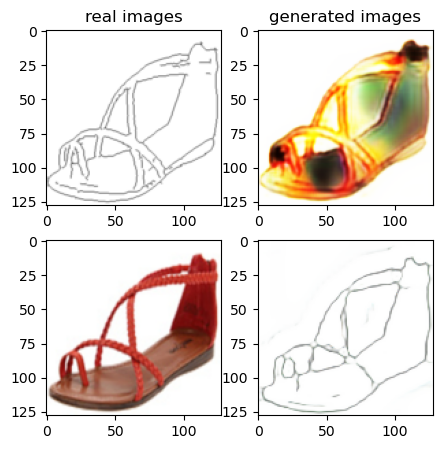

Train Epoch: 1 22% 	Total Loss: 1.652706 	Loss_G_AB: 0.293329	Loss_G_BA: 0.862037	Loss_cycle: 0.780393	Loss_D_A: 0.035404	Loss_D_B: 0.259226
0 11009 T:  3.751760482788086
Train Epoch: 1 22% 	Total Loss: 1.526858 	Loss_G_AB: 0.274475	Loss_G_BA: 0.920847	Loss_cycle: 0.630822	Loss_D_A: 0.046348	Loss_D_B: 0.252027
0 11019 T:  2.896561861038208
Train Epoch: 1 22% 	Total Loss: 1.450976 	Loss_G_AB: 0.289811	Loss_G_BA: 0.975380	Loss_cycle: 0.557354	Loss_D_A: 0.022067	Loss_D_B: 0.238959
0 11029 T:  1.8125848770141602
Train Epoch: 1 22% 	Total Loss: 1.456024 	Loss_G_AB: 0.291592	Loss_G_BA: 0.953503	Loss_cycle: 0.557369	Loss_D_A: 0.025393	Loss_D_B: 0.250715
0 11039 T:  2.9142584800720215
Train Epoch: 1 22% 	Total Loss: 1.381317 	Loss_G_AB: 0.285568	Loss_G_BA: 0.783354	Loss_cycle: 0.512581	Loss_D_A: 0.090545	Loss_D_B: 0.243730
0 11049 T:  2.9069247245788574
Train Epoch: 1 22% 	Total Loss: 1.443270 	Loss_G_AB: 0.292837	Loss_G_BA: 0.758655	Loss_cycle: 0.569688	Loss_D_A: 0.109054	Loss_D_B: 0.238782
0

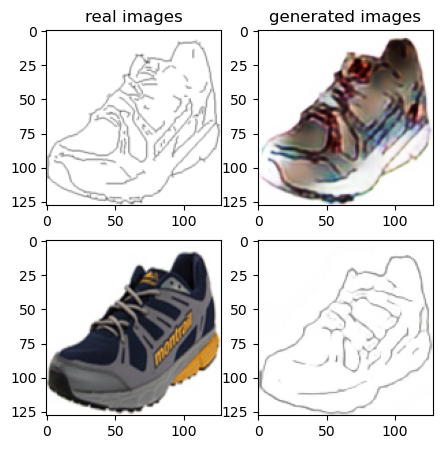

Train Epoch: 1 24% 	Total Loss: 1.693710 	Loss_G_AB: 0.310790	Loss_G_BA: 0.989299	Loss_cycle: 0.770045	Loss_D_A: 0.031168	Loss_D_B: 0.242453
0 12009 T:  4.071468353271484
Train Epoch: 1 24% 	Total Loss: 1.882144 	Loss_G_AB: 0.349726	Loss_G_BA: 1.008755	Loss_cycle: 0.949048	Loss_D_A: 0.024478	Loss_D_B: 0.229377
0 12019 T:  3.250627040863037
Train Epoch: 1 24% 	Total Loss: 1.468712 	Loss_G_AB: 0.378722	Loss_G_BA: 0.811641	Loss_cycle: 0.581793	Loss_D_A: 0.036490	Loss_D_B: 0.255248
0 12029 T:  2.6586055755615234
Train Epoch: 1 24% 	Total Loss: 1.638087 	Loss_G_AB: 0.440109	Loss_G_BA: 1.007361	Loss_cycle: 0.657142	Loss_D_A: 0.030071	Loss_D_B: 0.227138
0 12039 T:  2.716176986694336
Train Epoch: 1 24% 	Total Loss: 1.655945 	Loss_G_AB: 0.472706	Loss_G_BA: 0.724542	Loss_cycle: 0.537687	Loss_D_A: 0.136099	Loss_D_B: 0.383535
0 12049 T:  2.798938035964966
Train Epoch: 1 24% 	Total Loss: 1.575630 	Loss_G_AB: 0.373481	Loss_G_BA: 0.574514	Loss_cycle: 0.649545	Loss_D_A: 0.138564	Loss_D_B: 0.313524
0 1

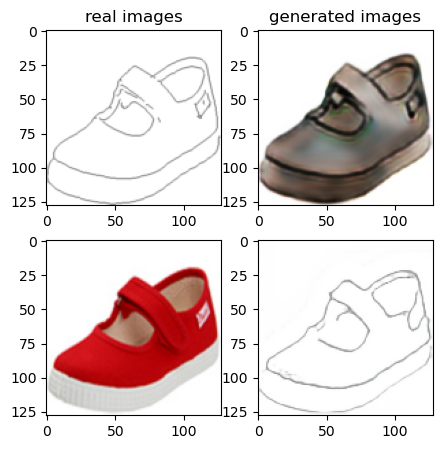

Train Epoch: 1 26% 	Total Loss: 1.469536 	Loss_G_AB: 0.341517	Loss_G_BA: 0.783689	Loss_cycle: 0.612807	Loss_D_A: 0.083824	Loss_D_B: 0.210302
0 13009 T:  4.105874061584473
Train Epoch: 1 26% 	Total Loss: 1.787310 	Loss_G_AB: 0.374448	Loss_G_BA: 0.918137	Loss_cycle: 0.874501	Loss_D_A: 0.055871	Loss_D_B: 0.210646
0 13019 T:  2.606327533721924
Train Epoch: 1 26% 	Total Loss: 1.827585 	Loss_G_AB: 0.374041	Loss_G_BA: 0.742446	Loss_cycle: 0.932759	Loss_D_A: 0.125244	Loss_D_B: 0.211338
0 13029 T:  3.061018705368042
Train Epoch: 1 26% 	Total Loss: 1.815577 	Loss_G_AB: 0.361393	Loss_G_BA: 0.577451	Loss_cycle: 0.904827	Loss_D_A: 0.176572	Loss_D_B: 0.264756
0 13039 T:  2.7414515018463135
Train Epoch: 1 26% 	Total Loss: 1.419986 	Loss_G_AB: 0.294522	Loss_G_BA: 0.563686	Loss_cycle: 0.611428	Loss_D_A: 0.115195	Loss_D_B: 0.264259
0 13049 T:  3.2092437744140625
Train Epoch: 1 26% 	Total Loss: 1.568914 	Loss_G_AB: 0.317176	Loss_G_BA: 0.773677	Loss_cycle: 0.617311	Loss_D_A: 0.140508	Loss_D_B: 0.265668
0 

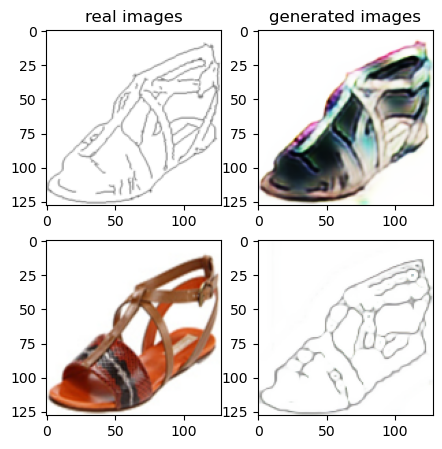

Train Epoch: 1 28% 	Total Loss: 1.488387 	Loss_G_AB: 0.304645	Loss_G_BA: 0.962351	Loss_cycle: 0.570306	Loss_D_A: 0.017656	Loss_D_B: 0.266928
0 14009 T:  4.026618242263794
Train Epoch: 1 28% 	Total Loss: 1.315606 	Loss_G_AB: 0.282206	Loss_G_BA: 0.758347	Loss_cycle: 0.485844	Loss_D_A: 0.076633	Loss_D_B: 0.232852
0 14019 T:  3.0640599727630615
Train Epoch: 1 28% 	Total Loss: 1.565986 	Loss_G_AB: 0.307181	Loss_G_BA: 0.964730	Loss_cycle: 0.606652	Loss_D_A: 0.062337	Loss_D_B: 0.261042
0 14029 T:  3.068903923034668
Train Epoch: 1 28% 	Total Loss: 1.456894 	Loss_G_AB: 0.277775	Loss_G_BA: 0.882771	Loss_cycle: 0.586871	Loss_D_A: 0.037766	Loss_D_B: 0.251985
0 14039 T:  3.176506519317627
Train Epoch: 1 28% 	Total Loss: 1.528978 	Loss_G_AB: 0.260293	Loss_G_BA: 0.877259	Loss_cycle: 0.634661	Loss_D_A: 0.055160	Loss_D_B: 0.270381
0 14049 T:  3.331418514251709
Train Epoch: 1 28% 	Total Loss: 1.602320 	Loss_G_AB: 0.288987	Loss_G_BA: 0.942781	Loss_cycle: 0.702036	Loss_D_A: 0.043712	Loss_D_B: 0.240688
0 1

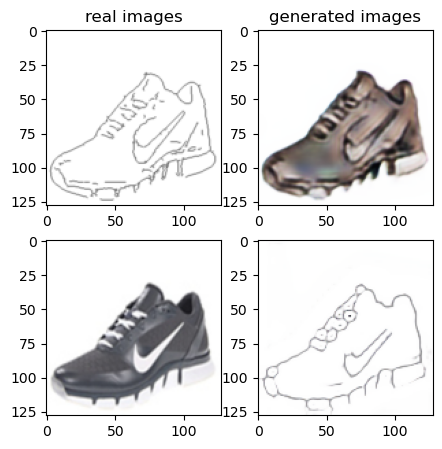

Train Epoch: 1 30% 	Total Loss: 1.565970 	Loss_G_AB: 0.342598	Loss_G_BA: 0.877689	Loss_cycle: 0.647666	Loss_D_A: 0.079406	Loss_D_B: 0.228755
0 15009 T:  4.247316837310791
Train Epoch: 1 30% 	Total Loss: 1.542124 	Loss_G_AB: 0.293042	Loss_G_BA: 0.757320	Loss_cycle: 0.634185	Loss_D_A: 0.083624	Loss_D_B: 0.299134
0 15019 T:  1.8188376426696777
Train Epoch: 1 30% 	Total Loss: 1.422907 	Loss_G_AB: 0.273783	Loss_G_BA: 0.665289	Loss_cycle: 0.517161	Loss_D_A: 0.175606	Loss_D_B: 0.260604
0 15029 T:  1.4196274280548096
Train Epoch: 1 30% 	Total Loss: 1.247780 	Loss_G_AB: 0.288304	Loss_G_BA: 0.509766	Loss_cycle: 0.390751	Loss_D_A: 0.197849	Loss_D_B: 0.260145
0 15039 T:  1.4115760326385498
Train Epoch: 1 30% 	Total Loss: 1.419290 	Loss_G_AB: 0.297482	Loss_G_BA: 0.638310	Loss_cycle: 0.569282	Loss_D_A: 0.133388	Loss_D_B: 0.248724
0 15049 T:  1.3323521614074707
Train Epoch: 1 30% 	Total Loss: 1.389919 	Loss_G_AB: 0.356517	Loss_G_BA: 0.875406	Loss_cycle: 0.504365	Loss_D_A: 0.046065	Loss_D_B: 0.223527


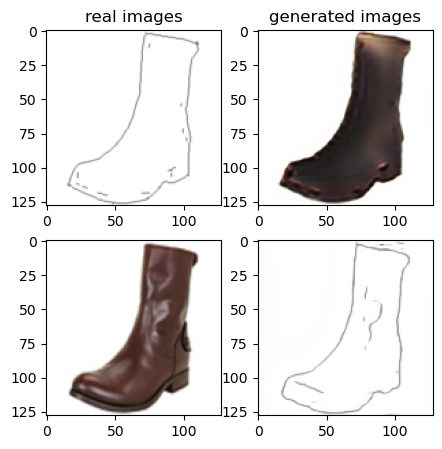

Train Epoch: 1 32% 	Total Loss: 1.312777 	Loss_G_AB: 0.269334	Loss_G_BA: 0.823639	Loss_cycle: 0.438434	Loss_D_A: 0.086044	Loss_D_B: 0.241812
0 16009 T:  3.481419801712036
Train Epoch: 1 32% 	Total Loss: 1.207884 	Loss_G_AB: 0.286025	Loss_G_BA: 0.672481	Loss_cycle: 0.380555	Loss_D_A: 0.102357	Loss_D_B: 0.245719
0 16019 T:  1.6353423595428467
Train Epoch: 1 32% 	Total Loss: 1.217674 	Loss_G_AB: 0.277087	Loss_G_BA: 0.651981	Loss_cycle: 0.354289	Loss_D_A: 0.128047	Loss_D_B: 0.270804
0 16029 T:  1.2080156803131104
Train Epoch: 1 32% 	Total Loss: 1.355313 	Loss_G_AB: 0.286347	Loss_G_BA: 0.598881	Loss_cycle: 0.470444	Loss_D_A: 0.166072	Loss_D_B: 0.276183
0 16039 T:  1.383894681930542
Train Epoch: 1 32% 	Total Loss: 1.724724 	Loss_G_AB: 0.502197	Loss_G_BA: 0.756778	Loss_cycle: 0.435374	Loss_D_A: 0.155039	Loss_D_B: 0.504823
0 16049 T:  1.442842721939087
Train Epoch: 1 32% 	Total Loss: 1.355017 	Loss_G_AB: 0.350798	Loss_G_BA: 0.897264	Loss_cycle: 0.364928	Loss_D_A: 0.064318	Loss_D_B: 0.301740
0 

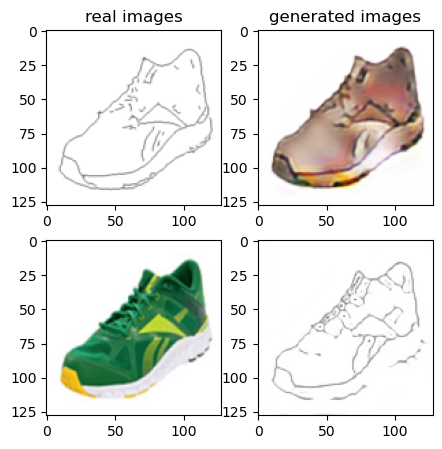

Train Epoch: 1 34% 	Total Loss: 1.669943 	Loss_G_AB: 0.297479	Loss_G_BA: 0.858203	Loss_cycle: 0.782232	Loss_D_A: 0.049150	Loss_D_B: 0.260720
0 17009 T:  3.4506781101226807
Train Epoch: 1 34% 	Total Loss: 1.459958 	Loss_G_AB: 0.277181	Loss_G_BA: 0.803706	Loss_cycle: 0.542069	Loss_D_A: 0.125153	Loss_D_B: 0.252293
0 17019 T:  2.466409921646118
Train Epoch: 1 34% 	Total Loss: 1.427775 	Loss_G_AB: 0.313739	Loss_G_BA: 0.852128	Loss_cycle: 0.514683	Loss_D_A: 0.070691	Loss_D_B: 0.259467
0 17029 T:  3.044823169708252
Train Epoch: 1 34% 	Total Loss: 1.547465 	Loss_G_AB: 0.297125	Loss_G_BA: 0.948506	Loss_cycle: 0.625299	Loss_D_A: 0.033436	Loss_D_B: 0.265914
0 17039 T:  2.6295769214630127
Train Epoch: 1 34% 	Total Loss: 1.671593 	Loss_G_AB: 0.343024	Loss_G_BA: 1.036309	Loss_cycle: 0.722757	Loss_D_A: 0.019660	Loss_D_B: 0.239510
0 17049 T:  2.9586269855499268
Train Epoch: 1 34% 	Total Loss: 1.592826 	Loss_G_AB: 0.304576	Loss_G_BA: 0.985475	Loss_cycle: 0.700523	Loss_D_A: 0.010268	Loss_D_B: 0.237009
0

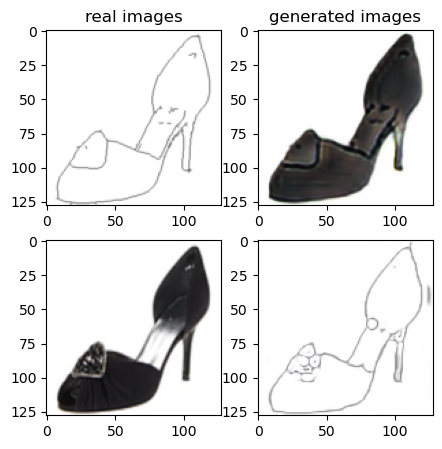

Train Epoch: 1 36% 	Total Loss: 1.244225 	Loss_G_AB: 0.300849	Loss_G_BA: 0.690462	Loss_cycle: 0.390534	Loss_D_A: 0.114186	Loss_D_B: 0.243851
0 18009 T:  3.7547640800476074
Train Epoch: 1 36% 	Total Loss: 1.230268 	Loss_G_AB: 0.271901	Loss_G_BA: 0.706134	Loss_cycle: 0.436323	Loss_D_A: 0.061155	Loss_D_B: 0.243773
0 18019 T:  3.222846508026123
Train Epoch: 1 36% 	Total Loss: 1.323060 	Loss_G_AB: 0.278878	Loss_G_BA: 0.797255	Loss_cycle: 0.472502	Loss_D_A: 0.076904	Loss_D_B: 0.235587
0 18029 T:  2.9731733798980713
Train Epoch: 1 36% 	Total Loss: 1.115502 	Loss_G_AB: 0.267583	Loss_G_BA: 0.584907	Loss_cycle: 0.312056	Loss_D_A: 0.132291	Loss_D_B: 0.244910
0 18039 T:  2.6816091537475586
Train Epoch: 1 36% 	Total Loss: 1.370609 	Loss_G_AB: 0.272044	Loss_G_BA: 0.921403	Loss_cycle: 0.467951	Loss_D_A: 0.052677	Loss_D_B: 0.253258
0 18049 T:  2.6987674236297607
Train Epoch: 1 36% 	Total Loss: 1.178549 	Loss_G_AB: 0.262613	Loss_G_BA: 0.756964	Loss_cycle: 0.360433	Loss_D_A: 0.058190	Loss_D_B: 0.250138


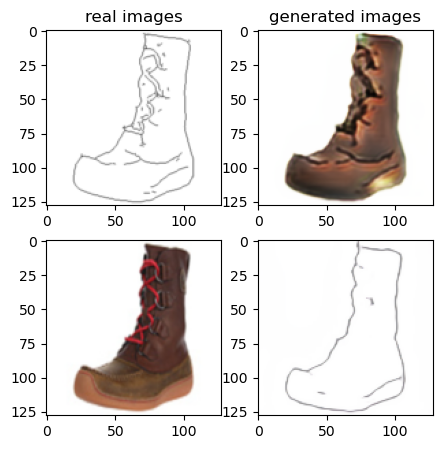

Train Epoch: 1 38% 	Total Loss: 1.345257 	Loss_G_AB: 0.313641	Loss_G_BA: 1.000997	Loss_cycle: 0.429768	Loss_D_A: 0.008223	Loss_D_B: 0.249947
0 19009 T:  4.349266052246094
Train Epoch: 1 38% 	Total Loss: 1.448458 	Loss_G_AB: 0.294209	Loss_G_BA: 0.977770	Loss_cycle: 0.546340	Loss_D_A: 0.006663	Loss_D_B: 0.259466
0 19019 T:  2.965618848800659
Train Epoch: 1 38% 	Total Loss: 1.417254 	Loss_G_AB: 0.292383	Loss_G_BA: 0.931768	Loss_cycle: 0.527358	Loss_D_A: 0.019097	Loss_D_B: 0.258724
0 19029 T:  2.9607932567596436
Train Epoch: 1 38% 	Total Loss: 1.392293 	Loss_G_AB: 0.309823	Loss_G_BA: 0.872329	Loss_cycle: 0.480060	Loss_D_A: 0.032303	Loss_D_B: 0.288853
0 19039 T:  3.0514683723449707
Train Epoch: 1 38% 	Total Loss: 1.352489 	Loss_G_AB: 0.268804	Loss_G_BA: 0.925458	Loss_cycle: 0.451956	Loss_D_A: 0.053714	Loss_D_B: 0.249688
0 19049 T:  2.30802845954895
Train Epoch: 1 38% 	Total Loss: 1.575126 	Loss_G_AB: 0.284495	Loss_G_BA: 1.000159	Loss_cycle: 0.638084	Loss_D_A: 0.036084	Loss_D_B: 0.258631
0 1

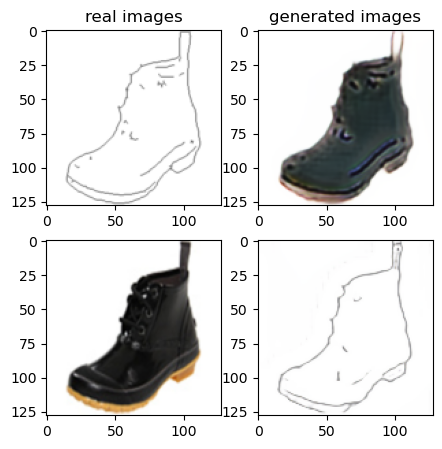

Train Epoch: 1 40% 	Total Loss: 1.220967 	Loss_G_AB: 0.277285	Loss_G_BA: 0.645297	Loss_cycle: 0.397086	Loss_D_A: 0.101113	Loss_D_B: 0.261478
0 20009 T:  3.9167497158050537
Train Epoch: 1 40% 	Total Loss: 1.232684 	Loss_G_AB: 0.287433	Loss_G_BA: 0.909241	Loss_cycle: 0.315016	Loss_D_A: 0.055151	Loss_D_B: 0.264180
0 20019 T:  2.8723859786987305
Train Epoch: 1 40% 	Total Loss: 1.295777 	Loss_G_AB: 0.332892	Loss_G_BA: 0.648242	Loss_cycle: 0.396789	Loss_D_A: 0.109316	Loss_D_B: 0.299105
0 20029 T:  3.120957851409912
Train Epoch: 1 40% 	Total Loss: 1.404792 	Loss_G_AB: 0.358666	Loss_G_BA: 0.877717	Loss_cycle: 0.484972	Loss_D_A: 0.047380	Loss_D_B: 0.254249
0 20039 T:  2.901804208755493
Train Epoch: 1 40% 	Total Loss: 1.311999 	Loss_G_AB: 0.336889	Loss_G_BA: 0.711492	Loss_cycle: 0.452942	Loss_D_A: 0.088189	Loss_D_B: 0.246678
0 20049 T:  2.9109692573547363
Train Epoch: 1 40% 	Total Loss: 1.344711 	Loss_G_AB: 0.350709	Loss_G_BA: 0.756397	Loss_cycle: 0.463410	Loss_D_A: 0.061010	Loss_D_B: 0.266738
0

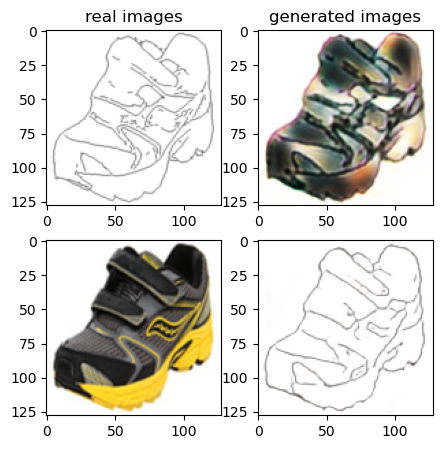

Train Epoch: 1 42% 	Total Loss: 1.706707 	Loss_G_AB: 0.285620	Loss_G_BA: 0.827486	Loss_cycle: 0.868627	Loss_D_A: 0.024763	Loss_D_B: 0.256764
0 21009 T:  4.050613880157471
Train Epoch: 1 42% 	Total Loss: 1.652640 	Loss_G_AB: 0.292501	Loss_G_BA: 1.108098	Loss_cycle: 0.693882	Loss_D_A: 0.015181	Loss_D_B: 0.243277
0 21019 T:  2.8822855949401855
Train Epoch: 1 42% 	Total Loss: 1.535678 	Loss_G_AB: 0.274365	Loss_G_BA: 1.007860	Loss_cycle: 0.618440	Loss_D_A: 0.012319	Loss_D_B: 0.263806
0 21029 T:  3.0236573219299316
Train Epoch: 1 42% 	Total Loss: 1.733839 	Loss_G_AB: 0.291499	Loss_G_BA: 1.019906	Loss_cycle: 0.823658	Loss_D_A: 0.007526	Loss_D_B: 0.246953
0 21039 T:  2.448570728302002
Train Epoch: 1 42% 	Total Loss: 1.373892 	Loss_G_AB: 0.275825	Loss_G_BA: 0.922909	Loss_cycle: 0.490222	Loss_D_A: 0.017516	Loss_D_B: 0.266787
0 21049 T:  2.718435049057007
Train Epoch: 1 42% 	Total Loss: 1.379801 	Loss_G_AB: 0.307655	Loss_G_BA: 0.823536	Loss_cycle: 0.523989	Loss_D_A: 0.034813	Loss_D_B: 0.255402
0 

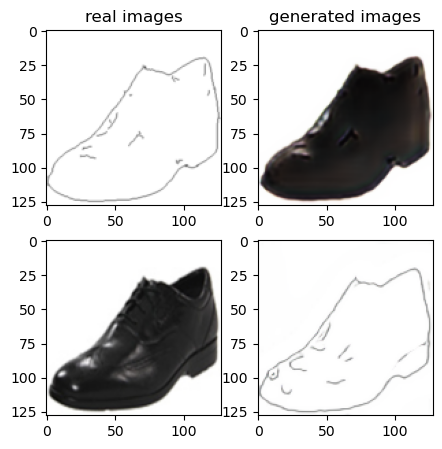

Train Epoch: 1 44% 	Total Loss: 1.301306 	Loss_G_AB: 0.334603	Loss_G_BA: 0.693862	Loss_cycle: 0.439150	Loss_D_A: 0.085800	Loss_D_B: 0.262123
0 22009 T:  3.6851000785827637
Train Epoch: 1 44% 	Total Loss: 1.531886 	Loss_G_AB: 0.322801	Loss_G_BA: 0.956671	Loss_cycle: 0.584659	Loss_D_A: 0.066355	Loss_D_B: 0.241138
0 22019 T:  2.4986624717712402
Train Epoch: 1 44% 	Total Loss: 1.265092 	Loss_G_AB: 0.261136	Loss_G_BA: 0.768412	Loss_cycle: 0.383283	Loss_D_A: 0.075896	Loss_D_B: 0.291139
0 22029 T:  2.4052088260650635
Train Epoch: 1 44% 	Total Loss: 1.400710 	Loss_G_AB: 0.361268	Loss_G_BA: 0.524177	Loss_cycle: 0.529259	Loss_D_A: 0.199178	Loss_D_B: 0.229552
0 22039 T:  3.1934080123901367
Train Epoch: 1 44% 	Total Loss: 1.341578 	Loss_G_AB: 0.282600	Loss_G_BA: 0.627694	Loss_cycle: 0.467783	Loss_D_A: 0.124662	Loss_D_B: 0.293985
0 22049 T:  3.012880325317383
Train Epoch: 1 44% 	Total Loss: 1.389486 	Loss_G_AB: 0.262378	Loss_G_BA: 0.774418	Loss_cycle: 0.450218	Loss_D_A: 0.166125	Loss_D_B: 0.254746


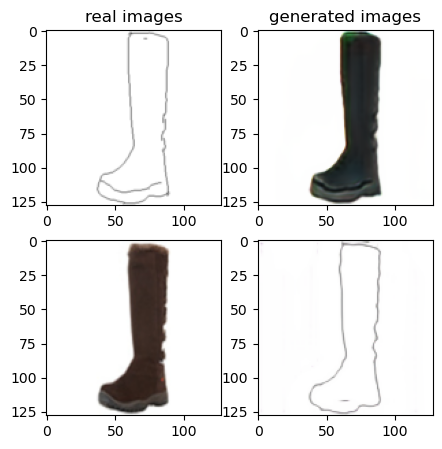

Train Epoch: 1 46% 	Total Loss: 1.190845 	Loss_G_AB: 0.271626	Loss_G_BA: 0.952733	Loss_cycle: 0.296860	Loss_D_A: 0.020739	Loss_D_B: 0.261066
0 23009 T:  3.4492383003234863
Train Epoch: 1 46% 	Total Loss: 1.440379 	Loss_G_AB: 0.258474	Loss_G_BA: 0.995907	Loss_cycle: 0.550021	Loss_D_A: 0.010826	Loss_D_B: 0.252341
0 23019 T:  2.5174753665924072
Train Epoch: 1 46% 	Total Loss: 1.250746 	Loss_G_AB: 0.275459	Loss_G_BA: 0.997491	Loss_cycle: 0.361264	Loss_D_A: 0.008469	Loss_D_B: 0.244537
0 23029 T:  2.8661649227142334
Train Epoch: 1 46% 	Total Loss: 1.321950 	Loss_G_AB: 0.253008	Loss_G_BA: 0.916010	Loss_cycle: 0.435784	Loss_D_A: 0.044374	Loss_D_B: 0.257284
0 23039 T:  2.631054162979126
Train Epoch: 1 46% 	Total Loss: 1.345246 	Loss_G_AB: 0.274189	Loss_G_BA: 1.021378	Loss_cycle: 0.413827	Loss_D_A: 0.018907	Loss_D_B: 0.264728
0 23049 T:  2.9516303539276123
Train Epoch: 1 46% 	Total Loss: 1.374583 	Loss_G_AB: 0.253146	Loss_G_BA: 0.973888	Loss_cycle: 0.482638	Loss_D_A: 0.012609	Loss_D_B: 0.265819


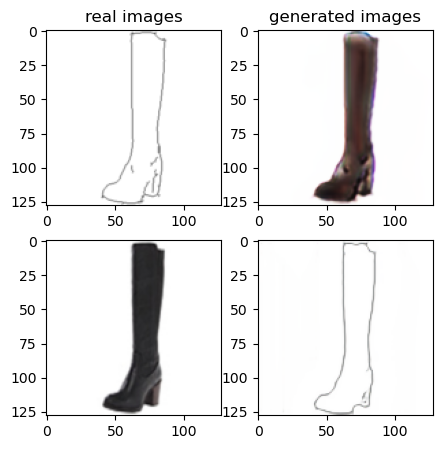

Train Epoch: 1 48% 	Total Loss: 1.017156 	Loss_G_AB: 0.257356	Loss_G_BA: 0.479644	Loss_cycle: 0.262401	Loss_D_A: 0.136289	Loss_D_B: 0.249966
0 24009 T:  0.9522387981414795
Train Epoch: 1 48% 	Total Loss: 1.190978 	Loss_G_AB: 0.273314	Loss_G_BA: 0.588761	Loss_cycle: 0.355232	Loss_D_A: 0.149121	Loss_D_B: 0.255588
0 24019 T:  0.6409876346588135
Train Epoch: 1 48% 	Total Loss: 1.094217 	Loss_G_AB: 0.281935	Loss_G_BA: 0.535943	Loss_cycle: 0.287813	Loss_D_A: 0.159090	Loss_D_B: 0.238375
0 24029 T:  0.6606178283691406
Train Epoch: 1 48% 	Total Loss: 1.078712 	Loss_G_AB: 0.268461	Loss_G_BA: 0.467695	Loss_cycle: 0.270765	Loss_D_A: 0.189375	Loss_D_B: 0.250494
0 24039 T:  0.6415698528289795
Train Epoch: 1 48% 	Total Loss: 1.130935 	Loss_G_AB: 0.278874	Loss_G_BA: 0.581784	Loss_cycle: 0.259382	Loss_D_A: 0.182360	Loss_D_B: 0.258865
0 24049 T:  0.637589693069458
Train Epoch: 1 48% 	Total Loss: 1.274360 	Loss_G_AB: 0.304760	Loss_G_BA: 0.546208	Loss_cycle: 0.438146	Loss_D_A: 0.176149	Loss_D_B: 0.234580


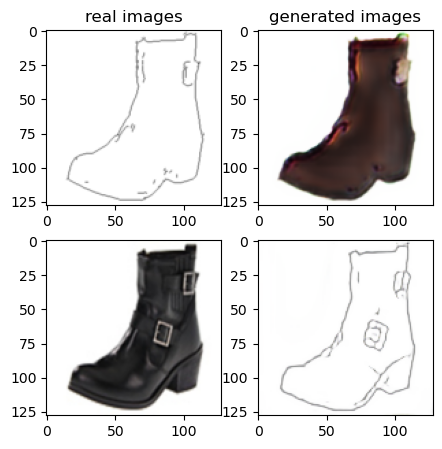

Train Epoch: 1 50% 	Total Loss: 1.168384 	Loss_G_AB: 0.270666	Loss_G_BA: 0.549571	Loss_cycle: 0.304305	Loss_D_A: 0.204772	Loss_D_B: 0.249189
0 25009 T:  1.0066888332366943
Train Epoch: 1 50% 	Total Loss: 1.191456 	Loss_G_AB: 0.269792	Loss_G_BA: 0.713260	Loss_cycle: 0.361509	Loss_D_A: 0.092936	Loss_D_B: 0.245486
0 25019 T:  0.6684057712554932
Train Epoch: 1 50% 	Total Loss: 1.095271 	Loss_G_AB: 0.267560	Loss_G_BA: 0.576989	Loss_cycle: 0.307888	Loss_D_A: 0.113710	Loss_D_B: 0.251399
0 25029 T:  0.657764196395874
Train Epoch: 1 50% 	Total Loss: 1.241909 	Loss_G_AB: 0.260271	Loss_G_BA: 0.748221	Loss_cycle: 0.340493	Loss_D_A: 0.138268	Loss_D_B: 0.258902
0 25039 T:  0.6605486869812012
Train Epoch: 1 50% 	Total Loss: 1.256594 	Loss_G_AB: 0.266247	Loss_G_BA: 0.880638	Loss_cycle: 0.403762	Loss_D_A: 0.026981	Loss_D_B: 0.252408
0 25049 T:  0.6706812381744385
Train Epoch: 1 50% 	Total Loss: 1.716599 	Loss_G_AB: 0.313284	Loss_G_BA: 0.946557	Loss_cycle: 0.766811	Loss_D_A: 0.072105	Loss_D_B: 0.247762


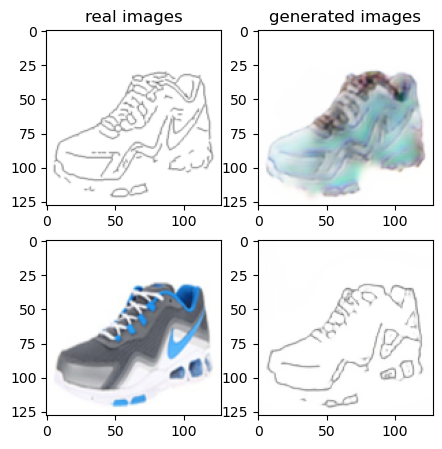

Train Epoch: 1 52% 	Total Loss: 1.506948 	Loss_G_AB: 0.258814	Loss_G_BA: 0.732462	Loss_cycle: 0.590521	Loss_D_A: 0.131089	Loss_D_B: 0.289700
0 26009 T:  1.031832218170166
Train Epoch: 1 52% 	Total Loss: 1.348030 	Loss_G_AB: 0.284453	Loss_G_BA: 0.614116	Loss_cycle: 0.472704	Loss_D_A: 0.167906	Loss_D_B: 0.258135
0 26019 T:  0.6636152267456055
Train Epoch: 1 52% 	Total Loss: 1.324245 	Loss_G_AB: 0.283253	Loss_G_BA: 0.696204	Loss_cycle: 0.421687	Loss_D_A: 0.157836	Loss_D_B: 0.254993
0 26029 T:  0.6642858982086182
Train Epoch: 1 52% 	Total Loss: 1.222412 	Loss_G_AB: 0.282650	Loss_G_BA: 0.629768	Loss_cycle: 0.437310	Loss_D_A: 0.070770	Loss_D_B: 0.258123
0 26039 T:  0.6668534278869629
Train Epoch: 1 52% 	Total Loss: 1.257029 	Loss_G_AB: 0.261172	Loss_G_BA: 0.637726	Loss_cycle: 0.423870	Loss_D_A: 0.129897	Loss_D_B: 0.253813
0 26049 T:  0.6658177375793457
Train Epoch: 1 52% 	Total Loss: 1.194818 	Loss_G_AB: 0.282838	Loss_G_BA: 0.544448	Loss_cycle: 0.410943	Loss_D_A: 0.128132	Loss_D_B: 0.242100


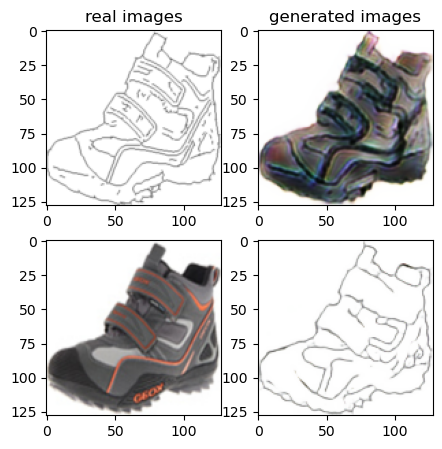

Train Epoch: 1 54% 	Total Loss: 1.256913 	Loss_G_AB: 0.268883	Loss_G_BA: 0.719342	Loss_cycle: 0.389750	Loss_D_A: 0.121080	Loss_D_B: 0.251971
0 27009 T:  1.0538549423217773
Train Epoch: 1 54% 	Total Loss: 1.156418 	Loss_G_AB: 0.277647	Loss_G_BA: 0.645125	Loss_cycle: 0.295739	Loss_D_A: 0.133027	Loss_D_B: 0.266266
0 27019 T:  0.6690218448638916
Train Epoch: 1 54% 	Total Loss: 1.177730 	Loss_G_AB: 0.292688	Loss_G_BA: 0.778199	Loss_cycle: 0.314584	Loss_D_A: 0.059494	Loss_D_B: 0.268209
0 27029 T:  0.7322921752929688
Train Epoch: 1 54% 	Total Loss: 1.459617 	Loss_G_AB: 0.325874	Loss_G_BA: 0.722454	Loss_cycle: 0.596748	Loss_D_A: 0.085546	Loss_D_B: 0.253159
0 27039 T:  0.6728909015655518
Train Epoch: 1 54% 	Total Loss: 1.443652 	Loss_G_AB: 0.282876	Loss_G_BA: 0.823967	Loss_cycle: 0.478910	Loss_D_A: 0.144027	Loss_D_B: 0.267294
0 27049 T:  0.6711201667785645
Train Epoch: 1 54% 	Total Loss: 1.087452 	Loss_G_AB: 0.277558	Loss_G_BA: 0.651722	Loss_cycle: 0.244815	Loss_D_A: 0.135006	Loss_D_B: 0.242991

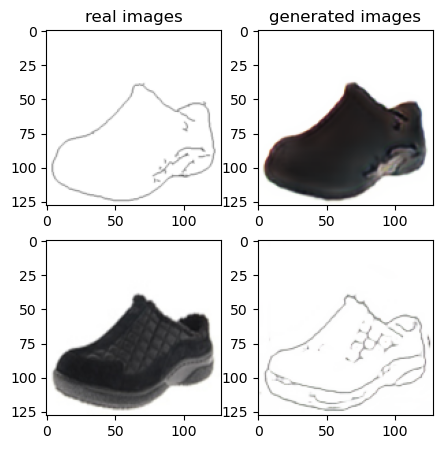

Train Epoch: 1 56% 	Total Loss: 1.297618 	Loss_G_AB: 0.265215	Loss_G_BA: 1.013648	Loss_cycle: 0.400904	Loss_D_A: 0.006403	Loss_D_B: 0.250881
0 28009 T:  1.1603937149047852
Train Epoch: 1 56% 	Total Loss: 1.173012 	Loss_G_AB: 0.267795	Loss_G_BA: 0.976426	Loss_cycle: 0.284538	Loss_D_A: 0.013857	Loss_D_B: 0.252507
0 28019 T:  0.6683809757232666
Train Epoch: 1 56% 	Total Loss: 1.352556 	Loss_G_AB: 0.323990	Loss_G_BA: 1.032177	Loss_cycle: 0.407098	Loss_D_A: 0.009197	Loss_D_B: 0.258177
0 28029 T:  0.6755468845367432
Train Epoch: 1 56% 	Total Loss: 1.215829 	Loss_G_AB: 0.276561	Loss_G_BA: 0.846152	Loss_cycle: 0.365555	Loss_D_A: 0.040912	Loss_D_B: 0.248005
0 28039 T:  0.6750030517578125
Train Epoch: 1 56% 	Total Loss: 1.279719 	Loss_G_AB: 0.290902	Loss_G_BA: 0.748186	Loss_cycle: 0.349963	Loss_D_A: 0.148516	Loss_D_B: 0.261696
0 28049 T:  0.6727180480957031
Train Epoch: 1 56% 	Total Loss: 1.193628 	Loss_G_AB: 0.232470	Loss_G_BA: 0.569196	Loss_cycle: 0.385407	Loss_D_A: 0.134982	Loss_D_B: 0.272406

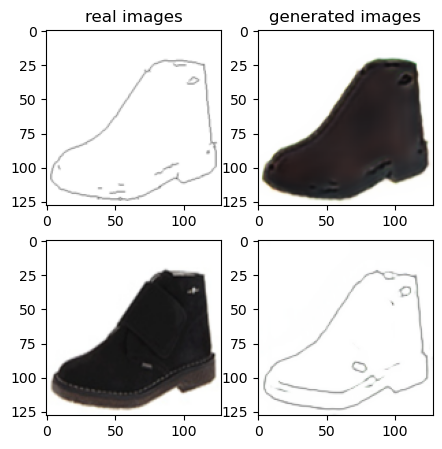

Train Epoch: 1 58% 	Total Loss: 1.428578 	Loss_G_AB: 0.284199	Loss_G_BA: 0.984113	Loss_cycle: 0.551584	Loss_D_A: 0.004276	Loss_D_B: 0.238563
0 29009 T:  1.023987054824829
Train Epoch: 1 58% 	Total Loss: 1.139858 	Loss_G_AB: 0.254215	Loss_G_BA: 1.001872	Loss_cycle: 0.261515	Loss_D_A: 0.006526	Loss_D_B: 0.243774
0 29019 T:  0.6666808128356934
Train Epoch: 1 58% 	Total Loss: 1.220807 	Loss_G_AB: 0.273812	Loss_G_BA: 1.010516	Loss_cycle: 0.321638	Loss_D_A: 0.004428	Loss_D_B: 0.252577
0 29029 T:  0.6811878681182861
Train Epoch: 1 58% 	Total Loss: 1.288151 	Loss_G_AB: 0.305199	Loss_G_BA: 0.983092	Loss_cycle: 0.396503	Loss_D_A: 0.003264	Loss_D_B: 0.244238
0 29039 T:  0.6688201427459717
Train Epoch: 1 58% 	Total Loss: 1.334855 	Loss_G_AB: 0.266462	Loss_G_BA: 1.006232	Loss_cycle: 0.418528	Loss_D_A: 0.003827	Loss_D_B: 0.276153
0 29049 T:  0.6741642951965332
Train Epoch: 1 58% 	Total Loss: 1.401224 	Loss_G_AB: 0.280550	Loss_G_BA: 0.977922	Loss_cycle: 0.520998	Loss_D_A: 0.004029	Loss_D_B: 0.246962


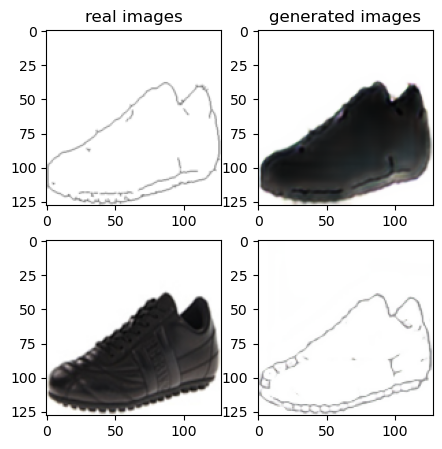

Train Epoch: 1 60% 	Total Loss: 1.367261 	Loss_G_AB: 0.281986	Loss_G_BA: 0.539993	Loss_cycle: 0.477715	Loss_D_A: 0.219378	Loss_D_B: 0.259177
0 30009 T:  0.996680498123169
Train Epoch: 1 60% 	Total Loss: 1.132610 	Loss_G_AB: 0.266669	Loss_G_BA: 0.428566	Loss_cycle: 0.277985	Loss_D_A: 0.240412	Loss_D_B: 0.266595
0 30019 T:  0.666550874710083
Train Epoch: 1 60% 	Total Loss: 1.291936 	Loss_G_AB: 0.292748	Loss_G_BA: 0.614107	Loss_cycle: 0.484021	Loss_D_A: 0.110536	Loss_D_B: 0.243952
0 30029 T:  0.6839828491210938
Train Epoch: 1 60% 	Total Loss: 1.320893 	Loss_G_AB: 0.275308	Loss_G_BA: 0.681157	Loss_cycle: 0.415956	Loss_D_A: 0.156505	Loss_D_B: 0.270200
0 30039 T:  0.6701672077178955
Train Epoch: 1 60% 	Total Loss: 1.136791 	Loss_G_AB: 0.284963	Loss_G_BA: 0.478747	Loss_cycle: 0.365138	Loss_D_A: 0.137050	Loss_D_B: 0.252748
0 30049 T:  0.6720221042633057
Train Epoch: 1 60% 	Total Loss: 1.566959 	Loss_G_AB: 0.305034	Loss_G_BA: 0.643897	Loss_cycle: 0.671480	Loss_D_A: 0.141853	Loss_D_B: 0.279159
0

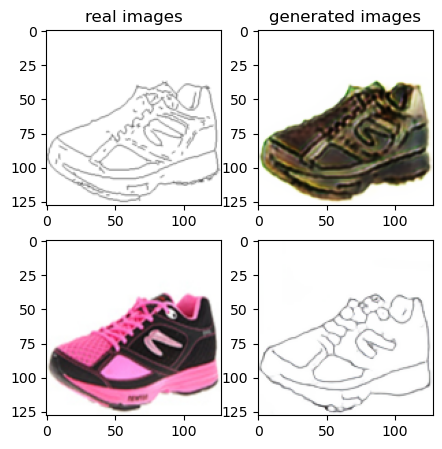

Train Epoch: 1 62% 	Total Loss: 1.818275 	Loss_G_AB: 0.360632	Loss_G_BA: 0.804350	Loss_cycle: 0.976920	Loss_D_A: 0.048128	Loss_D_B: 0.210736
0 31009 T:  1.0230295658111572
Train Epoch: 1 62% 	Total Loss: 1.427706 	Loss_G_AB: 0.326344	Loss_G_BA: 0.792786	Loss_cycle: 0.496170	Loss_D_A: 0.126270	Loss_D_B: 0.245701
0 31019 T:  0.6822738647460938
Train Epoch: 1 62% 	Total Loss: 1.144081 	Loss_G_AB: 0.276621	Loss_G_BA: 0.622780	Loss_cycle: 0.282292	Loss_D_A: 0.159169	Loss_D_B: 0.252920
0 31029 T:  0.6814708709716797
Train Epoch: 1 62% 	Total Loss: 1.171978 	Loss_G_AB: 0.256423	Loss_G_BA: 0.698720	Loss_cycle: 0.306338	Loss_D_A: 0.130181	Loss_D_B: 0.257888
0 31039 T:  0.685441255569458
Train Epoch: 1 62% 	Total Loss: 1.112462 	Loss_G_AB: 0.260573	Loss_G_BA: 0.654855	Loss_cycle: 0.310639	Loss_D_A: 0.088942	Loss_D_B: 0.255166
0 31049 T:  0.6786949634552002
Train Epoch: 1 62% 	Total Loss: 1.233314 	Loss_G_AB: 0.283598	Loss_G_BA: 0.704388	Loss_cycle: 0.363205	Loss_D_A: 0.118103	Loss_D_B: 0.258012


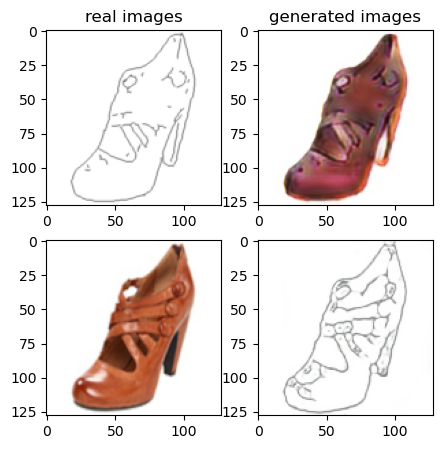

Train Epoch: 1 64% 	Total Loss: 1.336442 	Loss_G_AB: 0.246560	Loss_G_BA: 0.979679	Loss_cycle: 0.431269	Loss_D_A: 0.011193	Loss_D_B: 0.280860
0 32009 T:  1.0096409320831299
Train Epoch: 1 64% 	Total Loss: 1.198872 	Loss_G_AB: 0.282313	Loss_G_BA: 0.940444	Loss_cycle: 0.318284	Loss_D_A: 0.013427	Loss_D_B: 0.255783
0 32019 T:  0.666254997253418
Train Epoch: 1 64% 	Total Loss: 1.309166 	Loss_G_AB: 0.286292	Loss_G_BA: 1.003006	Loss_cycle: 0.415331	Loss_D_A: 0.006791	Loss_D_B: 0.242395
0 32029 T:  0.6757323741912842
Train Epoch: 1 64% 	Total Loss: 1.375670 	Loss_G_AB: 0.282296	Loss_G_BA: 1.021731	Loss_cycle: 0.465669	Loss_D_A: 0.009824	Loss_D_B: 0.248164
0 32039 T:  0.6733136177062988
Train Epoch: 1 64% 	Total Loss: 1.337599 	Loss_G_AB: 0.273440	Loss_G_BA: 0.854805	Loss_cycle: 0.425026	Loss_D_A: 0.068213	Loss_D_B: 0.280238
0 32049 T:  0.6879725456237793
Train Epoch: 1 64% 	Total Loss: 1.251281 	Loss_G_AB: 0.271073	Loss_G_BA: 0.998854	Loss_cycle: 0.364417	Loss_D_A: 0.009785	Loss_D_B: 0.242116


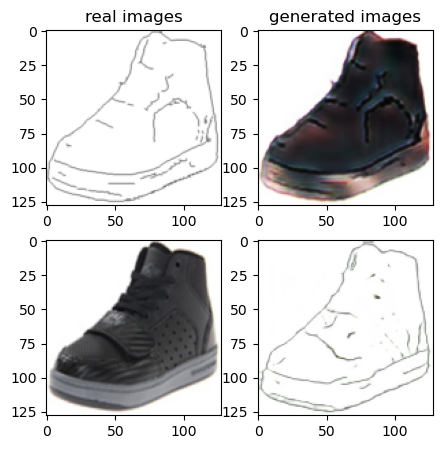

Train Epoch: 1 66% 	Total Loss: 1.528864 	Loss_G_AB: 0.289845	Loss_G_BA: 0.997152	Loss_cycle: 0.621417	Loss_D_A: 0.006036	Loss_D_B: 0.257912
0 33009 T:  0.948906421661377
Train Epoch: 1 66% 	Total Loss: 1.503694 	Loss_G_AB: 0.273306	Loss_G_BA: 0.981950	Loss_cycle: 0.589666	Loss_D_A: 0.007550	Loss_D_B: 0.278850
0 33019 T:  0.6532015800476074
Train Epoch: 1 66% 	Total Loss: 1.231971 	Loss_G_AB: 0.288355	Loss_G_BA: 0.836538	Loss_cycle: 0.365902	Loss_D_A: 0.052880	Loss_D_B: 0.250742
0 33029 T:  0.6609759330749512
Train Epoch: 1 66% 	Total Loss: 1.410954 	Loss_G_AB: 0.278085	Loss_G_BA: 0.881578	Loss_cycle: 0.533155	Loss_D_A: 0.045099	Loss_D_B: 0.252868
0 33039 T:  0.6483373641967773
Train Epoch: 1 66% 	Total Loss: 1.376627 	Loss_G_AB: 0.299527	Loss_G_BA: 0.908445	Loss_cycle: 0.512794	Loss_D_A: 0.026276	Loss_D_B: 0.233570
0 33049 T:  0.6525044441223145
Train Epoch: 1 66% 	Total Loss: 1.378692 	Loss_G_AB: 0.302905	Loss_G_BA: 0.994517	Loss_cycle: 0.465907	Loss_D_A: 0.031269	Loss_D_B: 0.232804


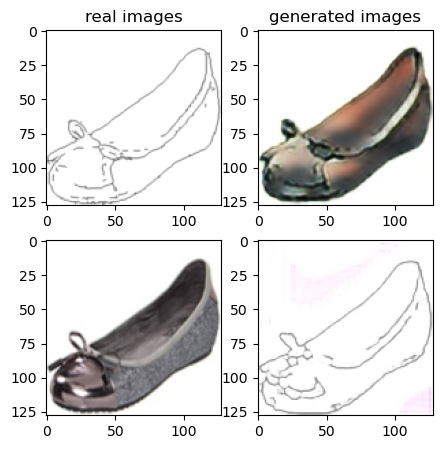

Train Epoch: 1 68% 	Total Loss: 1.441793 	Loss_G_AB: 0.290734	Loss_G_BA: 0.905124	Loss_cycle: 0.530376	Loss_D_A: 0.050650	Loss_D_B: 0.262837
0 34009 T:  0.9762370586395264
Train Epoch: 1 68% 	Total Loss: 1.555255 	Loss_G_AB: 0.292003	Loss_G_BA: 0.913121	Loss_cycle: 0.711792	Loss_D_A: 0.018668	Loss_D_B: 0.222233
0 34019 T:  0.6562697887420654
Train Epoch: 1 68% 	Total Loss: 1.445412 	Loss_G_AB: 0.319593	Loss_G_BA: 0.756201	Loss_cycle: 0.592973	Loss_D_A: 0.073692	Loss_D_B: 0.240851
0 34029 T:  0.6500487327575684
Train Epoch: 1 68% 	Total Loss: 1.524352 	Loss_G_AB: 0.289079	Loss_G_BA: 1.092894	Loss_cycle: 0.585196	Loss_D_A: 0.015130	Loss_D_B: 0.233039
0 34039 T:  0.6471712589263916
Train Epoch: 1 68% 	Total Loss: 1.311848 	Loss_G_AB: 0.277627	Loss_G_BA: 0.872455	Loss_cycle: 0.458171	Loss_D_A: 0.016088	Loss_D_B: 0.262548
0 34049 T:  0.6549427509307861
Train Epoch: 1 68% 	Total Loss: 1.436037 	Loss_G_AB: 0.279164	Loss_G_BA: 0.942107	Loss_cycle: 0.544907	Loss_D_A: 0.029844	Loss_D_B: 0.250651

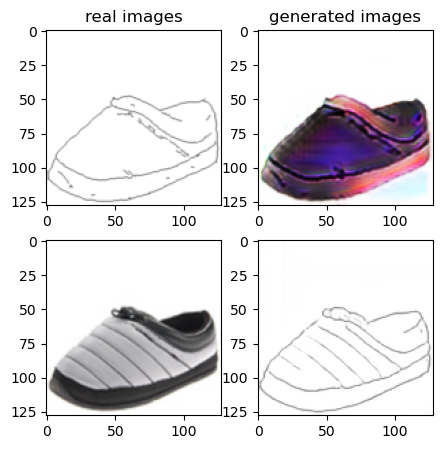

Train Epoch: 1 70% 	Total Loss: 1.419529 	Loss_G_AB: 0.292690	Loss_G_BA: 0.899423	Loss_cycle: 0.487110	Loss_D_A: 0.084327	Loss_D_B: 0.252036
0 35009 T:  0.952951192855835
Train Epoch: 1 70% 	Total Loss: 1.405619 	Loss_G_AB: 0.290896	Loss_G_BA: 1.002207	Loss_cycle: 0.486470	Loss_D_A: 0.021403	Loss_D_B: 0.251194
0 35019 T:  0.6514647006988525
Train Epoch: 1 70% 	Total Loss: 1.448531 	Loss_G_AB: 0.315668	Loss_G_BA: 0.786003	Loss_cycle: 0.574165	Loss_D_A: 0.078920	Loss_D_B: 0.244611
0 35029 T:  0.6503720283508301
Train Epoch: 1 70% 	Total Loss: 1.363962 	Loss_G_AB: 0.254713	Loss_G_BA: 0.955002	Loss_cycle: 0.461349	Loss_D_A: 0.034513	Loss_D_B: 0.263243
0 35039 T:  0.6567049026489258
Train Epoch: 1 70% 	Total Loss: 1.340155 	Loss_G_AB: 0.278220	Loss_G_BA: 0.666953	Loss_cycle: 0.463239	Loss_D_A: 0.145950	Loss_D_B: 0.258380
0 35049 T:  0.6567153930664062
Train Epoch: 1 70% 	Total Loss: 1.464414 	Loss_G_AB: 0.287901	Loss_G_BA: 0.730921	Loss_cycle: 0.584735	Loss_D_A: 0.111725	Loss_D_B: 0.258543


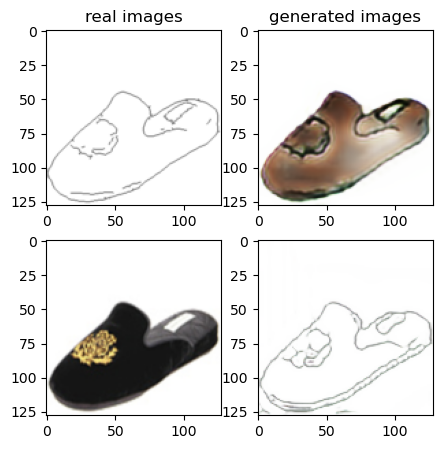

Train Epoch: 1 72% 	Total Loss: 1.410574 	Loss_G_AB: 0.251143	Loss_G_BA: 0.945986	Loss_cycle: 0.492689	Loss_D_A: 0.029025	Loss_D_B: 0.290296
0 36009 T:  3.522806167602539
Train Epoch: 1 72% 	Total Loss: 1.423427 	Loss_G_AB: 0.290885	Loss_G_BA: 1.003985	Loss_cycle: 0.495174	Loss_D_A: 0.014492	Loss_D_B: 0.266325
0 36019 T:  2.921494245529175
Train Epoch: 1 72% 	Total Loss: 1.575054 	Loss_G_AB: 0.252918	Loss_G_BA: 1.027569	Loss_cycle: 0.662156	Loss_D_A: 0.012115	Loss_D_B: 0.260539
0 36029 T:  1.9780805110931396
Train Epoch: 1 72% 	Total Loss: 1.687243 	Loss_G_AB: 0.278614	Loss_G_BA: 1.011938	Loss_cycle: 0.767771	Loss_D_A: 0.006308	Loss_D_B: 0.267887
0 36039 T:  2.62253737449646
Train Epoch: 1 72% 	Total Loss: 1.434509 	Loss_G_AB: 0.277545	Loss_G_BA: 0.973674	Loss_cycle: 0.521046	Loss_D_A: 0.029438	Loss_D_B: 0.258416
0 36049 T:  2.978816270828247
Train Epoch: 1 72% 	Total Loss: 1.560599 	Loss_G_AB: 0.273984	Loss_G_BA: 1.027632	Loss_cycle: 0.641327	Loss_D_A: 0.013195	Loss_D_B: 0.255269
0 36

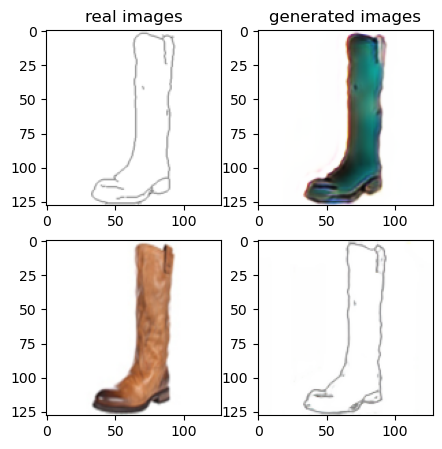

Train Epoch: 1 74% 	Total Loss: 1.200080 	Loss_G_AB: 0.276918	Loss_G_BA: 1.013521	Loss_cycle: 0.301831	Loss_D_A: 0.005647	Loss_D_B: 0.247383
0 37009 T:  3.6711506843566895
Train Epoch: 1 74% 	Total Loss: 1.275596 	Loss_G_AB: 0.255157	Loss_G_BA: 1.016327	Loss_cycle: 0.370572	Loss_D_A: 0.006432	Loss_D_B: 0.262850
0 37019 T:  2.571422576904297
Train Epoch: 1 74% 	Total Loss: 1.348361 	Loss_G_AB: 0.283198	Loss_G_BA: 1.010453	Loss_cycle: 0.449295	Loss_D_A: 0.004998	Loss_D_B: 0.247243
0 37029 T:  2.8122060298919678
Train Epoch: 1 74% 	Total Loss: 1.215159 	Loss_G_AB: 0.308442	Loss_G_BA: 0.957949	Loss_cycle: 0.329155	Loss_D_A: 0.005635	Loss_D_B: 0.247173
0 37039 T:  2.7713522911071777
Train Epoch: 1 74% 	Total Loss: 1.457015 	Loss_G_AB: 0.280137	Loss_G_BA: 1.000236	Loss_cycle: 0.541411	Loss_D_A: 0.005788	Loss_D_B: 0.269630
0 37049 T:  2.162487268447876
Train Epoch: 1 74% 	Total Loss: 1.310112 	Loss_G_AB: 0.286741	Loss_G_BA: 0.954025	Loss_cycle: 0.421723	Loss_D_A: 0.016487	Loss_D_B: 0.251518
0

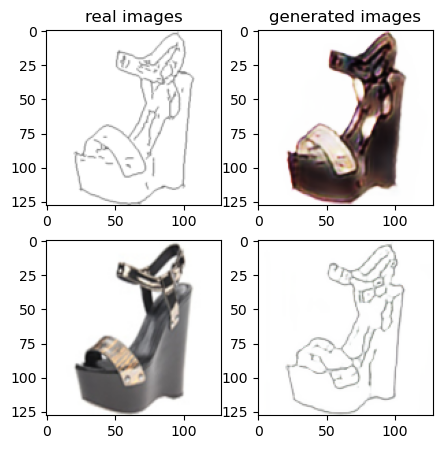

Train Epoch: 1 76% 	Total Loss: 1.376965 	Loss_G_AB: 0.285651	Loss_G_BA: 0.995548	Loss_cycle: 0.478088	Loss_D_A: 0.002576	Loss_D_B: 0.255702
0 38009 T:  3.4805145263671875
Train Epoch: 1 76% 	Total Loss: 1.331147 	Loss_G_AB: 0.277795	Loss_G_BA: 0.982883	Loss_cycle: 0.436024	Loss_D_A: 0.003599	Loss_D_B: 0.261185
0 38019 T:  2.6147680282592773
Train Epoch: 1 76% 	Total Loss: 1.343290 	Loss_G_AB: 0.262346	Loss_G_BA: 0.993431	Loss_cycle: 0.446871	Loss_D_A: 0.005312	Loss_D_B: 0.263218
0 38029 T:  2.6021926403045654
Train Epoch: 1 76% 	Total Loss: 1.443375 	Loss_G_AB: 0.283947	Loss_G_BA: 1.040746	Loss_cycle: 0.505910	Loss_D_A: 0.004973	Loss_D_B: 0.270147
0 38039 T:  2.2404630184173584
Train Epoch: 1 76% 	Total Loss: 1.396322 	Loss_G_AB: 0.314880	Loss_G_BA: 1.019759	Loss_cycle: 0.466157	Loss_D_A: 0.003386	Loss_D_B: 0.259459
0 38049 T:  2.9064576625823975
Train Epoch: 1 76% 	Total Loss: 1.286676 	Loss_G_AB: 0.316880	Loss_G_BA: 0.993418	Loss_cycle: 0.392929	Loss_D_A: 0.002080	Loss_D_B: 0.236517

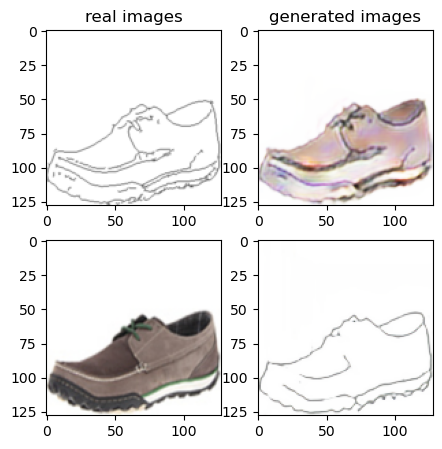

Train Epoch: 1 78% 	Total Loss: 1.514301 	Loss_G_AB: 0.304527	Loss_G_BA: 1.014611	Loss_cycle: 0.568971	Loss_D_A: 0.052102	Loss_D_B: 0.233658
0 39009 T:  4.033343553543091
Train Epoch: 1 78% 	Total Loss: 1.445334 	Loss_G_AB: 0.275293	Loss_G_BA: 1.014791	Loss_cycle: 0.547868	Loss_D_A: 0.009421	Loss_D_B: 0.243003
0 39019 T:  2.7399871349334717
Train Epoch: 1 78% 	Total Loss: 1.400881 	Loss_G_AB: 0.279887	Loss_G_BA: 0.872741	Loss_cycle: 0.509236	Loss_D_A: 0.016473	Loss_D_B: 0.298859
0 39029 T:  2.6891586780548096
Train Epoch: 1 78% 	Total Loss: 1.356617 	Loss_G_AB: 0.313699	Loss_G_BA: 0.856331	Loss_cycle: 0.444131	Loss_D_A: 0.081619	Loss_D_B: 0.245852
0 39039 T:  2.3823819160461426
Train Epoch: 1 78% 	Total Loss: 1.449607 	Loss_G_AB: 0.291456	Loss_G_BA: 0.460022	Loss_cycle: 0.551803	Loss_D_A: 0.297695	Loss_D_B: 0.224369
0 39049 T:  2.5600643157958984
Train Epoch: 1 78% 	Total Loss: 1.264200 	Loss_G_AB: 0.283790	Loss_G_BA: 0.324397	Loss_cycle: 0.477994	Loss_D_A: 0.231254	Loss_D_B: 0.250858


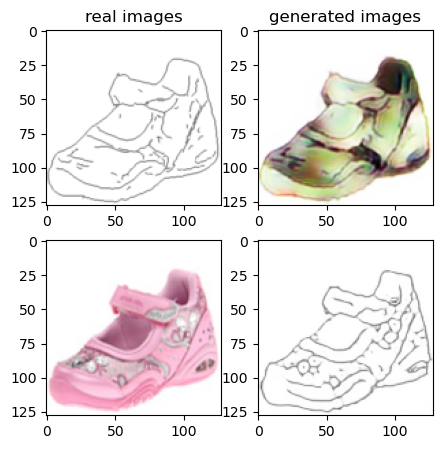

Train Epoch: 1 80% 	Total Loss: 1.390373 	Loss_G_AB: 0.275627	Loss_G_BA: 0.980567	Loss_cycle: 0.504252	Loss_D_A: 0.008804	Loss_D_B: 0.249220
0 40009 T:  3.9652950763702393
Train Epoch: 1 80% 	Total Loss: 1.490838 	Loss_G_AB: 0.276886	Loss_G_BA: 0.987263	Loss_cycle: 0.599097	Loss_D_A: 0.005359	Loss_D_B: 0.254307
0 40019 T:  2.8514533042907715
Train Epoch: 1 80% 	Total Loss: 1.431928 	Loss_G_AB: 0.266479	Loss_G_BA: 1.012558	Loss_cycle: 0.529461	Loss_D_A: 0.006951	Loss_D_B: 0.255997
0 40029 T:  2.506732702255249
Train Epoch: 1 80% 	Total Loss: 1.428537 	Loss_G_AB: 0.262918	Loss_G_BA: 1.020760	Loss_cycle: 0.522093	Loss_D_A: 0.003507	Loss_D_B: 0.261098
0 40039 T:  2.162763833999634
Train Epoch: 1 80% 	Total Loss: 1.374968 	Loss_G_AB: 0.284487	Loss_G_BA: 1.003778	Loss_cycle: 0.495010	Loss_D_A: 0.002979	Loss_D_B: 0.232847
0 40049 T:  2.8972747325897217
Train Epoch: 1 80% 	Total Loss: 1.362702 	Loss_G_AB: 0.306840	Loss_G_BA: 0.993462	Loss_cycle: 0.488617	Loss_D_A: 0.002371	Loss_D_B: 0.221563
0

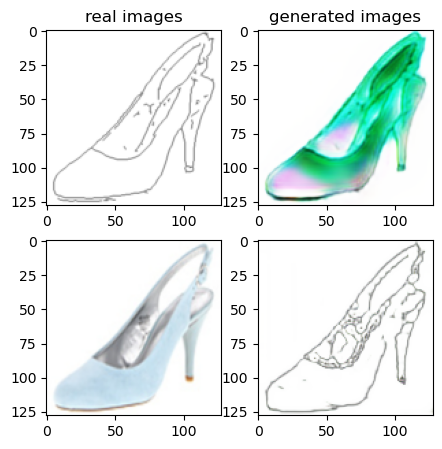

Train Epoch: 1 82% 	Total Loss: 1.267568 	Loss_G_AB: 0.276338	Loss_G_BA: 0.503162	Loss_cycle: 0.426052	Loss_D_A: 0.178671	Loss_D_B: 0.273095
0 41009 T:  0.9833173751831055
Train Epoch: 1 82% 	Total Loss: 1.296144 	Loss_G_AB: 0.303398	Loss_G_BA: 0.545906	Loss_cycle: 0.497833	Loss_D_A: 0.135670	Loss_D_B: 0.237989
0 41019 T:  0.6380136013031006
Train Epoch: 1 82% 	Total Loss: 1.335838 	Loss_G_AB: 0.259998	Loss_G_BA: 0.564425	Loss_cycle: 0.411784	Loss_D_A: 0.249268	Loss_D_B: 0.262574
0 41029 T:  0.6387434005737305
Train Epoch: 1 82% 	Total Loss: 1.338209 	Loss_G_AB: 0.276982	Loss_G_BA: 0.565518	Loss_cycle: 0.487386	Loss_D_A: 0.181118	Loss_D_B: 0.248455
0 41039 T:  0.6358301639556885
Train Epoch: 1 82% 	Total Loss: 1.503640 	Loss_G_AB: 0.290081	Loss_G_BA: 0.559895	Loss_cycle: 0.682938	Loss_D_A: 0.146924	Loss_D_B: 0.248789
0 41049 T:  0.635014533996582
Train Epoch: 1 82% 	Total Loss: 1.257394 	Loss_G_AB: 0.290815	Loss_G_BA: 0.595038	Loss_cycle: 0.379013	Loss_D_A: 0.196109	Loss_D_B: 0.239346


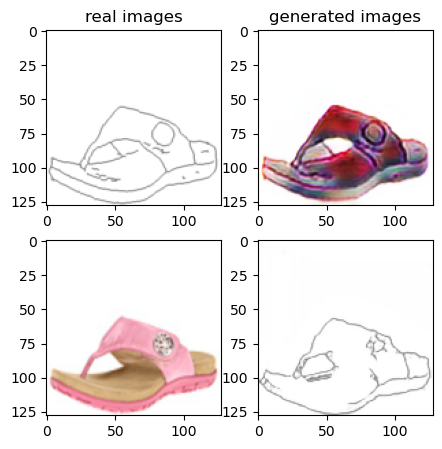

Train Epoch: 1 84% 	Total Loss: 1.409597 	Loss_G_AB: 0.263469	Loss_G_BA: 0.834152	Loss_cycle: 0.522974	Loss_D_A: 0.084154	Loss_D_B: 0.253658
0 42009 T:  0.958674430847168
Train Epoch: 1 84% 	Total Loss: 1.331986 	Loss_G_AB: 0.327178	Loss_G_BA: 0.726302	Loss_cycle: 0.557672	Loss_D_A: 0.053781	Loss_D_B: 0.193792
0 42019 T:  0.6317703723907471
Train Epoch: 1 84% 	Total Loss: 1.525173 	Loss_G_AB: 0.359883	Loss_G_BA: 0.731021	Loss_cycle: 0.607686	Loss_D_A: 0.082920	Loss_D_B: 0.289116
0 42029 T:  0.634150505065918
Train Epoch: 1 84% 	Total Loss: 1.466296 	Loss_G_AB: 0.264846	Loss_G_BA: 0.741202	Loss_cycle: 0.501903	Loss_D_A: 0.156208	Loss_D_B: 0.305161
0 42039 T:  0.6360206604003906
Train Epoch: 1 84% 	Total Loss: 1.365726 	Loss_G_AB: 0.316694	Loss_G_BA: 0.651376	Loss_cycle: 0.420239	Loss_D_A: 0.156659	Loss_D_B: 0.304793
0 42049 T:  0.6316008567810059
Train Epoch: 1 84% 	Total Loss: 1.368977 	Loss_G_AB: 0.282125	Loss_G_BA: 0.609471	Loss_cycle: 0.535966	Loss_D_A: 0.155589	Loss_D_B: 0.231624
0

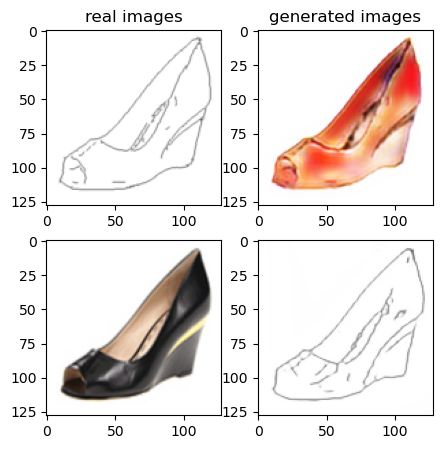

Train Epoch: 1 86% 	Total Loss: 1.424040 	Loss_G_AB: 0.292111	Loss_G_BA: 0.983198	Loss_cycle: 0.516611	Loss_D_A: 0.020885	Loss_D_B: 0.248890
0 43009 T:  0.906559944152832
Train Epoch: 1 86% 	Total Loss: 1.392785 	Loss_G_AB: 0.275881	Loss_G_BA: 0.952848	Loss_cycle: 0.494744	Loss_D_A: 0.009040	Loss_D_B: 0.274636
0 43019 T:  0.6267917156219482
Train Epoch: 1 86% 	Total Loss: 1.343037 	Loss_G_AB: 0.270528	Loss_G_BA: 0.983725	Loss_cycle: 0.447707	Loss_D_A: 0.016701	Loss_D_B: 0.251502
0 43029 T:  0.610424280166626
Train Epoch: 1 86% 	Total Loss: 1.407255 	Loss_G_AB: 0.246244	Loss_G_BA: 0.964822	Loss_cycle: 0.520808	Loss_D_A: 0.007336	Loss_D_B: 0.273578
0 43039 T:  0.6360056400299072
Train Epoch: 1 86% 	Total Loss: 1.405292 	Loss_G_AB: 0.275904	Loss_G_BA: 1.045431	Loss_cycle: 0.491977	Loss_D_A: 0.007568	Loss_D_B: 0.245080
0 43049 T:  0.6319980621337891
Train Epoch: 1 86% 	Total Loss: 1.364145 	Loss_G_AB: 0.279364	Loss_G_BA: 0.998614	Loss_cycle: 0.458721	Loss_D_A: 0.003271	Loss_D_B: 0.263164
0

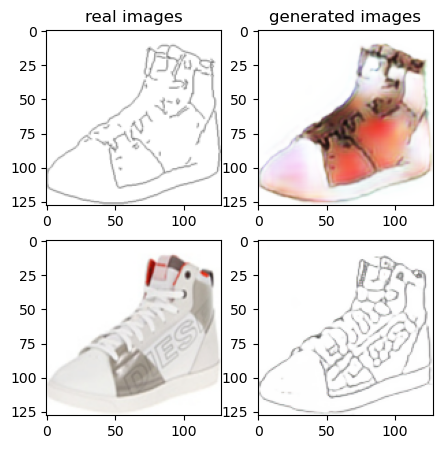

Train Epoch: 1 88% 	Total Loss: 1.338181 	Loss_G_AB: 0.260373	Loss_G_BA: 0.929993	Loss_cycle: 0.475705	Loss_D_A: 0.019975	Loss_D_B: 0.247318
0 44009 T:  1.062162160873413
Train Epoch: 1 88% 	Total Loss: 1.460053 	Loss_G_AB: 0.301022	Loss_G_BA: 0.998903	Loss_cycle: 0.562591	Loss_D_A: 0.003507	Loss_D_B: 0.243993
0 44019 T:  0.6203944683074951
Train Epoch: 1 88% 	Total Loss: 1.320808 	Loss_G_AB: 0.297231	Loss_G_BA: 1.005848	Loss_cycle: 0.387035	Loss_D_A: 0.002865	Loss_D_B: 0.279368
0 44029 T:  0.6158497333526611
Train Epoch: 1 88% 	Total Loss: 1.208940 	Loss_G_AB: 0.321631	Loss_G_BA: 1.001242	Loss_cycle: 0.324771	Loss_D_A: 0.003430	Loss_D_B: 0.219303
0 44039 T:  0.6255803108215332
Train Epoch: 1 88% 	Total Loss: 1.429589 	Loss_G_AB: 0.336834	Loss_G_BA: 1.016174	Loss_cycle: 0.494063	Loss_D_A: 0.003280	Loss_D_B: 0.255743
0 44049 T:  0.6240136623382568
Train Epoch: 1 88% 	Total Loss: 1.318505 	Loss_G_AB: 0.243211	Loss_G_BA: 0.988168	Loss_cycle: 0.426462	Loss_D_A: 0.005241	Loss_D_B: 0.271112


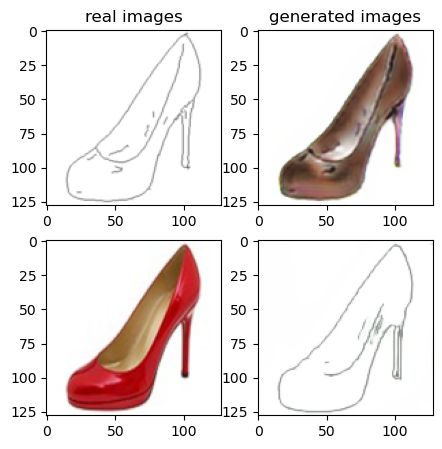

Train Epoch: 1 90% 	Total Loss: 1.327701 	Loss_G_AB: 0.272679	Loss_G_BA: 1.021412	Loss_cycle: 0.419211	Loss_D_A: 0.009636	Loss_D_B: 0.251808
0 45009 T:  0.9400980472564697
Train Epoch: 1 90% 	Total Loss: 1.326785 	Loss_G_AB: 0.281582	Loss_G_BA: 0.997178	Loss_cycle: 0.440048	Loss_D_A: 0.006056	Loss_D_B: 0.241301
0 45019 T:  0.6245331764221191
Train Epoch: 1 90% 	Total Loss: 1.464821 	Loss_G_AB: 0.272520	Loss_G_BA: 1.007268	Loss_cycle: 0.555302	Loss_D_A: 0.004306	Loss_D_B: 0.265319
0 45029 T:  0.6233737468719482
Train Epoch: 1 90% 	Total Loss: 1.298346 	Loss_G_AB: 0.273665	Loss_G_BA: 0.974419	Loss_cycle: 0.436891	Loss_D_A: 0.002949	Loss_D_B: 0.234464
0 45039 T:  0.6362433433532715
Train Epoch: 1 90% 	Total Loss: 1.351531 	Loss_G_AB: 0.317529	Loss_G_BA: 0.949030	Loss_cycle: 0.458652	Loss_D_A: 0.006610	Loss_D_B: 0.252990
0 45049 T:  0.6363217830657959
Train Epoch: 1 90% 	Total Loss: 1.493123 	Loss_G_AB: 0.260600	Loss_G_BA: 0.994897	Loss_cycle: 0.575274	Loss_D_A: 0.027479	Loss_D_B: 0.262621

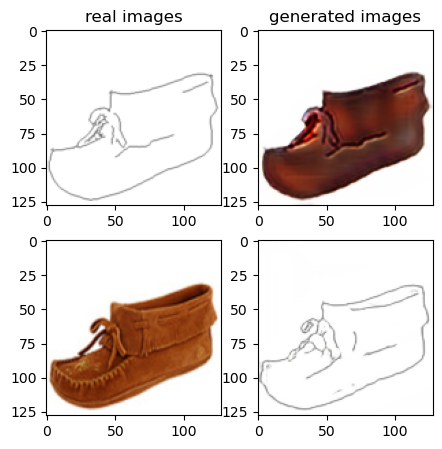

Train Epoch: 1 92% 	Total Loss: 1.254994 	Loss_G_AB: 0.301669	Loss_G_BA: 0.764480	Loss_cycle: 0.392607	Loss_D_A: 0.085841	Loss_D_B: 0.243471
0 46009 T:  0.9372415542602539
Train Epoch: 1 92% 	Total Loss: 1.384361 	Loss_G_AB: 0.290610	Loss_G_BA: 0.894305	Loss_cycle: 0.507571	Loss_D_A: 0.045870	Loss_D_B: 0.238463
0 46019 T:  0.6288151741027832
Train Epoch: 1 92% 	Total Loss: 1.306755 	Loss_G_AB: 0.299627	Loss_G_BA: 0.967057	Loss_cycle: 0.421085	Loss_D_A: 0.010027	Loss_D_B: 0.242301
0 46029 T:  0.6287510395050049
Train Epoch: 1 92% 	Total Loss: 1.415157 	Loss_G_AB: 0.302299	Loss_G_BA: 1.063491	Loss_cycle: 0.454494	Loss_D_A: 0.015216	Loss_D_B: 0.262552
0 46039 T:  0.6436798572540283
Train Epoch: 1 92% 	Total Loss: 1.252922 	Loss_G_AB: 0.325842	Loss_G_BA: 0.961738	Loss_cycle: 0.358063	Loss_D_A: 0.006120	Loss_D_B: 0.244948
0 46049 T:  0.635906457901001
Train Epoch: 1 92% 	Total Loss: 1.342043 	Loss_G_AB: 0.252437	Loss_G_BA: 0.971516	Loss_cycle: 0.415745	Loss_D_A: 0.031968	Loss_D_B: 0.282354


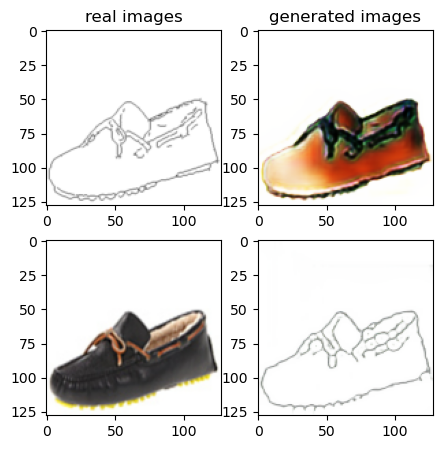

Train Epoch: 1 94% 	Total Loss: 1.428470 	Loss_G_AB: 0.284195	Loss_G_BA: 1.023920	Loss_cycle: 0.473551	Loss_D_A: 0.008051	Loss_D_B: 0.292812
0 47009 T:  0.9262118339538574
Train Epoch: 1 94% 	Total Loss: 1.322343 	Loss_G_AB: 0.339854	Loss_G_BA: 0.978617	Loss_cycle: 0.413413	Loss_D_A: 0.005233	Loss_D_B: 0.244461
0 47019 T:  0.6319549083709717
Train Epoch: 1 94% 	Total Loss: 1.270795 	Loss_G_AB: 0.299346	Loss_G_BA: 0.942645	Loss_cycle: 0.388181	Loss_D_A: 0.017880	Loss_D_B: 0.243739
0 47029 T:  0.6264917850494385
Train Epoch: 1 94% 	Total Loss: 1.293505 	Loss_G_AB: 0.294278	Loss_G_BA: 0.951059	Loss_cycle: 0.411669	Loss_D_A: 0.026662	Loss_D_B: 0.232506
0 47039 T:  0.6300442218780518
Train Epoch: 1 94% 	Total Loss: 1.178754 	Loss_G_AB: 0.303153	Loss_G_BA: 0.936965	Loss_cycle: 0.271844	Loss_D_A: 0.014653	Loss_D_B: 0.272198
0 47049 T:  0.6486401557922363
Train Epoch: 1 94% 	Total Loss: 1.343967 	Loss_G_AB: 0.309168	Loss_G_BA: 1.062186	Loss_cycle: 0.400353	Loss_D_A: 0.007552	Loss_D_B: 0.250385

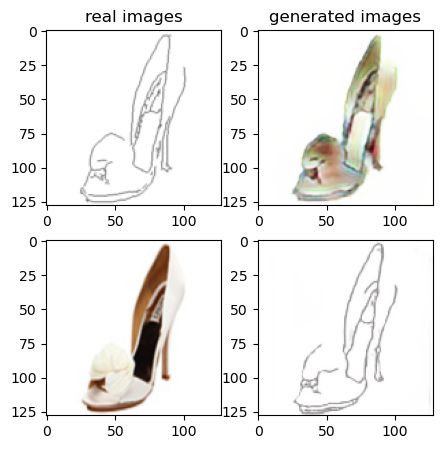

Train Epoch: 1 96% 	Total Loss: 1.440716 	Loss_G_AB: 0.262823	Loss_G_BA: 0.925624	Loss_cycle: 0.532785	Loss_D_A: 0.049782	Loss_D_B: 0.263925
0 48009 T:  0.9260497093200684
Train Epoch: 1 96% 	Total Loss: 1.408398 	Loss_G_AB: 0.302313	Loss_G_BA: 1.039089	Loss_cycle: 0.482343	Loss_D_A: 0.019564	Loss_D_B: 0.235791
0 48019 T:  0.6192572116851807
Train Epoch: 1 96% 	Total Loss: 1.378742 	Loss_G_AB: 0.271570	Loss_G_BA: 1.001839	Loss_cycle: 0.487081	Loss_D_A: 0.006670	Loss_D_B: 0.248286
0 48029 T:  0.6232781410217285
Train Epoch: 1 96% 	Total Loss: 1.315028 	Loss_G_AB: 0.305681	Loss_G_BA: 0.976301	Loss_cycle: 0.424500	Loss_D_A: 0.011237	Loss_D_B: 0.238300
0 48039 T:  0.6219160556793213
Train Epoch: 1 96% 	Total Loss: 1.361507 	Loss_G_AB: 0.330587	Loss_G_BA: 0.988890	Loss_cycle: 0.458397	Loss_D_A: 0.009143	Loss_D_B: 0.234229
0 48049 T:  0.6263473033905029
Train Epoch: 1 96% 	Total Loss: 1.367126 	Loss_G_AB: 0.292398	Loss_G_BA: 0.970279	Loss_cycle: 0.464549	Loss_D_A: 0.029863	Loss_D_B: 0.241375

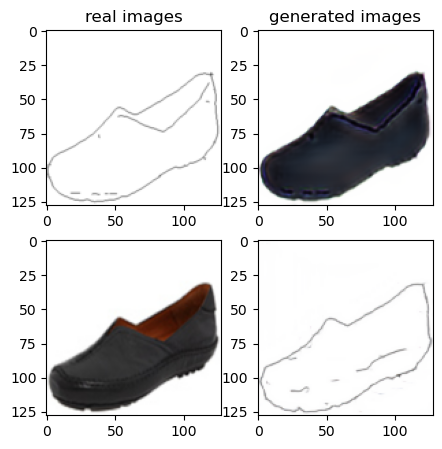

Train Epoch: 1 98% 	Total Loss: 1.272176 	Loss_G_AB: 0.286691	Loss_G_BA: 0.516971	Loss_cycle: 0.369488	Loss_D_A: 0.244990	Loss_D_B: 0.255867
0 49009 T:  0.9053514003753662
Train Epoch: 1 98% 	Total Loss: 1.094786 	Loss_G_AB: 0.288138	Loss_G_BA: 0.637275	Loss_cycle: 0.280771	Loss_D_A: 0.109592	Loss_D_B: 0.241717
0 49019 T:  0.6432092189788818
Train Epoch: 1 98% 	Total Loss: 1.171119 	Loss_G_AB: 0.278810	Loss_G_BA: 0.640514	Loss_cycle: 0.322773	Loss_D_A: 0.123894	Loss_D_B: 0.264790
0 49029 T:  0.633897066116333
Train Epoch: 1 98% 	Total Loss: 1.282495 	Loss_G_AB: 0.311415	Loss_G_BA: 0.889205	Loss_cycle: 0.355836	Loss_D_A: 0.066240	Loss_D_B: 0.260109
0 49039 T:  0.633887529373169
Train Epoch: 1 98% 	Total Loss: 1.326817 	Loss_G_AB: 0.312977	Loss_G_BA: 0.815632	Loss_cycle: 0.425705	Loss_D_A: 0.057685	Loss_D_B: 0.279122
0 49049 T:  0.6588165760040283
Train Epoch: 1 98% 	Total Loss: 1.662138 	Loss_G_AB: 0.297165	Loss_G_BA: 0.948241	Loss_cycle: 0.756634	Loss_D_A: 0.017726	Loss_D_B: 0.265075
0

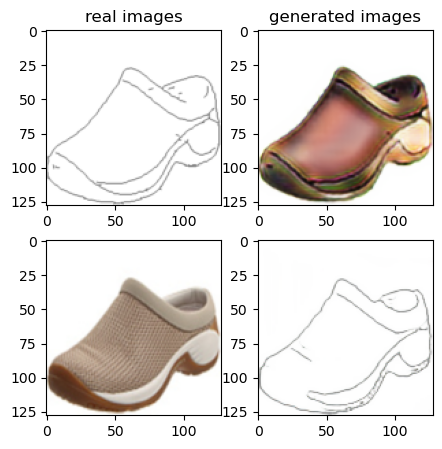

Train Epoch: 2 0% 	Total Loss: 1.397163 	Loss_G_AB: 0.295279	Loss_G_BA: 0.793892	Loss_cycle: 0.474949	Loss_D_A: 0.118489	Loss_D_B: 0.259140
1 50009 T:  0.91571044921875
Train Epoch: 2 0% 	Total Loss: 1.248235 	Loss_G_AB: 0.249154	Loss_G_BA: 0.718901	Loss_cycle: 0.419076	Loss_D_A: 0.060092	Loss_D_B: 0.285040
1 50019 T:  0.6179008483886719
Train Epoch: 2 0% 	Total Loss: 1.305811 	Loss_G_AB: 0.276216	Loss_G_BA: 0.941818	Loss_cycle: 0.417061	Loss_D_A: 0.036381	Loss_D_B: 0.243352
1 50029 T:  0.6363232135772705
Train Epoch: 2 0% 	Total Loss: 1.330512 	Loss_G_AB: 0.304120	Loss_G_BA: 1.012592	Loss_cycle: 0.420129	Loss_D_A: 0.010972	Loss_D_B: 0.241055
1 50039 T:  0.6559281349182129
Train Epoch: 2 0% 	Total Loss: 1.275871 	Loss_G_AB: 0.262876	Loss_G_BA: 0.975568	Loss_cycle: 0.356898	Loss_D_A: 0.056240	Loss_D_B: 0.243512
1 50049 T:  0.6557126045227051
Train Epoch: 2 0% 	Total Loss: 1.476252 	Loss_G_AB: 0.258545	Loss_G_BA: 0.935940	Loss_cycle: 0.600689	Loss_D_A: 0.014748	Loss_D_B: 0.263573
1 50059

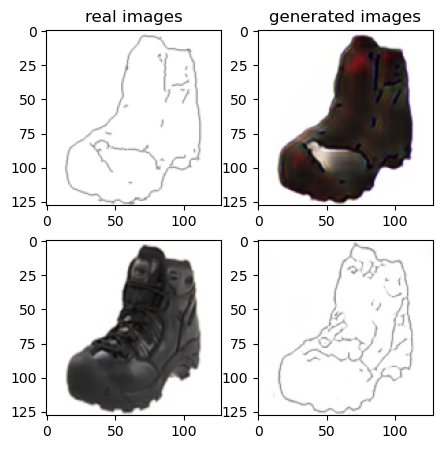

Train Epoch: 2 2% 	Total Loss: 1.198058 	Loss_G_AB: 0.269520	Loss_G_BA: 0.583607	Loss_cycle: 0.383618	Loss_D_A: 0.134565	Loss_D_B: 0.253311
1 51009 T:  0.9002261161804199
Train Epoch: 2 2% 	Total Loss: 1.391796 	Loss_G_AB: 0.280228	Loss_G_BA: 0.692687	Loss_cycle: 0.478383	Loss_D_A: 0.168328	Loss_D_B: 0.258627
1 51019 T:  0.6360874176025391
Train Epoch: 2 2% 	Total Loss: 1.270621 	Loss_G_AB: 0.286701	Loss_G_BA: 0.545566	Loss_cycle: 0.474163	Loss_D_A: 0.132970	Loss_D_B: 0.247355
1 51029 T:  0.6364665031433105
Train Epoch: 2 2% 	Total Loss: 1.359331 	Loss_G_AB: 0.303631	Loss_G_BA: 0.526997	Loss_cycle: 0.500500	Loss_D_A: 0.162263	Loss_D_B: 0.281253
1 51039 T:  0.6394228935241699
Train Epoch: 2 2% 	Total Loss: 1.236663 	Loss_G_AB: 0.260013	Loss_G_BA: 0.582338	Loss_cycle: 0.376759	Loss_D_A: 0.153711	Loss_D_B: 0.285017
1 51049 T:  0.627619743347168
Train Epoch: 2 2% 	Total Loss: 1.288723 	Loss_G_AB: 0.282036	Loss_G_BA: 0.602627	Loss_cycle: 0.422191	Loss_D_A: 0.162873	Loss_D_B: 0.261328
1 5105

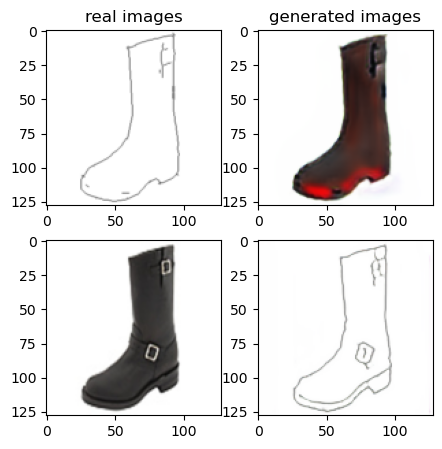

Train Epoch: 2 4% 	Total Loss: 1.192820 	Loss_G_AB: 0.285162	Loss_G_BA: 0.969705	Loss_cycle: 0.320945	Loss_D_A: 0.002783	Loss_D_B: 0.241659
1 52009 T:  1.0079641342163086
Train Epoch: 2 4% 	Total Loss: 1.317882 	Loss_G_AB: 0.260116	Loss_G_BA: 1.006370	Loss_cycle: 0.420024	Loss_D_A: 0.008794	Loss_D_B: 0.255821
1 52019 T:  0.6266584396362305
Train Epoch: 2 4% 	Total Loss: 1.261582 	Loss_G_AB: 0.354700	Loss_G_BA: 0.961042	Loss_cycle: 0.374118	Loss_D_A: 0.008424	Loss_D_B: 0.221169
1 52029 T:  0.6392436027526855
Train Epoch: 2 4% 	Total Loss: 1.577290 	Loss_G_AB: 0.306080	Loss_G_BA: 0.997746	Loss_cycle: 0.584793	Loss_D_A: 0.012591	Loss_D_B: 0.327993
1 52039 T:  0.6397840976715088
Train Epoch: 2 4% 	Total Loss: 1.260000 	Loss_G_AB: 0.278613	Loss_G_BA: 0.995631	Loss_cycle: 0.372250	Loss_D_A: 0.004385	Loss_D_B: 0.246244
1 52049 T:  0.6422436237335205
Train Epoch: 2 4% 	Total Loss: 1.313278 	Loss_G_AB: 0.270517	Loss_G_BA: 0.990661	Loss_cycle: 0.433880	Loss_D_A: 0.003058	Loss_D_B: 0.245751
1 520

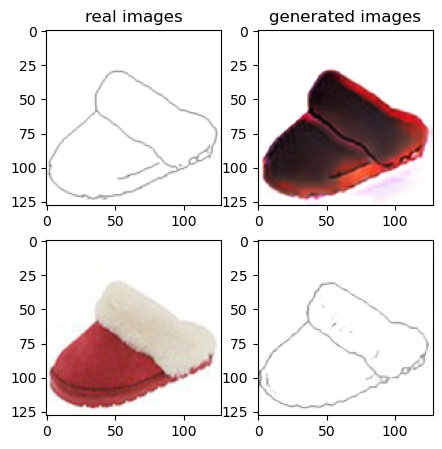

Train Epoch: 2 6% 	Total Loss: 1.353287 	Loss_G_AB: 0.297832	Loss_G_BA: 0.960692	Loss_cycle: 0.469001	Loss_D_A: 0.024987	Loss_D_B: 0.230037
1 53009 T:  0.8938000202178955
Train Epoch: 2 6% 	Total Loss: 1.248918 	Loss_G_AB: 0.281964	Loss_G_BA: 0.997261	Loss_cycle: 0.358792	Loss_D_A: 0.007470	Loss_D_B: 0.243044
1 53019 T:  0.6261179447174072
Train Epoch: 2 6% 	Total Loss: 1.304875 	Loss_G_AB: 0.316826	Loss_G_BA: 0.954417	Loss_cycle: 0.433890	Loss_D_A: 0.008037	Loss_D_B: 0.227327
1 53029 T:  0.637915849685669
Train Epoch: 2 6% 	Total Loss: 1.248412 	Loss_G_AB: 0.259945	Loss_G_BA: 1.023856	Loss_cycle: 0.336429	Loss_D_A: 0.006877	Loss_D_B: 0.263206
1 53039 T:  0.643413782119751
Train Epoch: 2 6% 	Total Loss: 1.291069 	Loss_G_AB: 0.265381	Loss_G_BA: 0.961740	Loss_cycle: 0.401673	Loss_D_A: 0.006172	Loss_D_B: 0.269663
1 53049 T:  0.6482784748077393
Train Epoch: 2 6% 	Total Loss: 1.355739 	Loss_G_AB: 0.266626	Loss_G_BA: 0.959603	Loss_cycle: 0.480528	Loss_D_A: 0.009953	Loss_D_B: 0.252144
1 53059

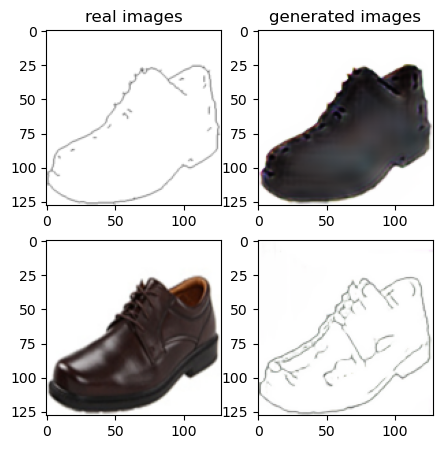

Train Epoch: 2 8% 	Total Loss: 1.196983 	Loss_G_AB: 0.279604	Loss_G_BA: 1.028297	Loss_cycle: 0.266597	Loss_D_A: 0.004368	Loss_D_B: 0.272068
1 54009 T:  0.896148681640625
Train Epoch: 2 8% 	Total Loss: 1.348751 	Loss_G_AB: 0.344222	Loss_G_BA: 0.996152	Loss_cycle: 0.435012	Loss_D_A: 0.003742	Loss_D_B: 0.239810
1 54019 T:  0.6515400409698486
Train Epoch: 2 8% 	Total Loss: 1.316644 	Loss_G_AB: 0.253265	Loss_G_BA: 1.011433	Loss_cycle: 0.413755	Loss_D_A: 0.003540	Loss_D_B: 0.267001
1 54029 T:  0.6332511901855469
Train Epoch: 2 8% 	Total Loss: 1.285006 	Loss_G_AB: 0.249670	Loss_G_BA: 0.982836	Loss_cycle: 0.389021	Loss_D_A: 0.014986	Loss_D_B: 0.264746
1 54039 T:  0.6344995498657227
Train Epoch: 2 8% 	Total Loss: 1.317395 	Loss_G_AB: 0.261188	Loss_G_BA: 0.976784	Loss_cycle: 0.437590	Loss_D_A: 0.009901	Loss_D_B: 0.250918
1 54049 T:  0.6446459293365479
Train Epoch: 2 8% 	Total Loss: 1.205402 	Loss_G_AB: 0.273258	Loss_G_BA: 0.950683	Loss_cycle: 0.339859	Loss_D_A: 0.008718	Loss_D_B: 0.244854
1 5405

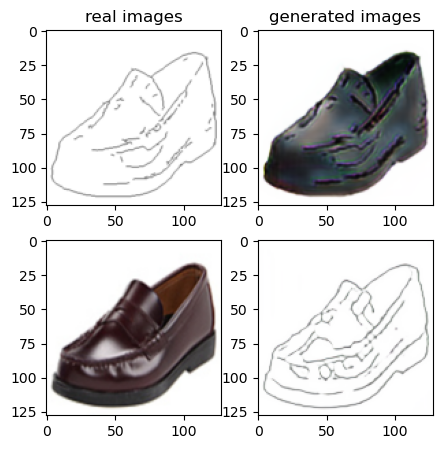

Train Epoch: 2 10% 	Total Loss: 1.113357 	Loss_G_AB: 0.282065	Loss_G_BA: 0.995212	Loss_cycle: 0.238711	Loss_D_A: 0.001693	Loss_D_B: 0.234314
1 55009 T:  0.9082612991333008
Train Epoch: 2 10% 	Total Loss: 1.210089 	Loss_G_AB: 0.282079	Loss_G_BA: 1.002423	Loss_cycle: 0.312763	Loss_D_A: 0.002443	Loss_D_B: 0.252632
1 55019 T:  0.6217796802520752
Train Epoch: 2 10% 	Total Loss: 1.125583 	Loss_G_AB: 0.261792	Loss_G_BA: 0.995002	Loss_cycle: 0.250449	Loss_D_A: 0.001777	Loss_D_B: 0.244961
1 55029 T:  0.6326565742492676
Train Epoch: 2 10% 	Total Loss: 1.248057 	Loss_G_AB: 0.274004	Loss_G_BA: 0.998994	Loss_cycle: 0.347566	Loss_D_A: 0.003466	Loss_D_B: 0.260527
1 55039 T:  0.624122142791748
Train Epoch: 2 10% 	Total Loss: 1.129650 	Loss_G_AB: 0.252632	Loss_G_BA: 0.993312	Loss_cycle: 0.247423	Loss_D_A: 0.002754	Loss_D_B: 0.256501
1 55049 T:  0.6346206665039062
Train Epoch: 2 11% 	Total Loss: 1.174683 	Loss_G_AB: 0.257168	Loss_G_BA: 1.005807	Loss_cycle: 0.281770	Loss_D_A: 0.002880	Loss_D_B: 0.258545


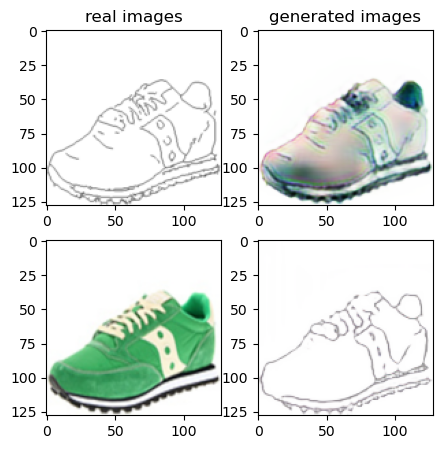

Train Epoch: 2 12% 	Total Loss: 1.530553 	Loss_G_AB: 0.286284	Loss_G_BA: 0.976205	Loss_cycle: 0.636888	Loss_D_A: 0.004470	Loss_D_B: 0.257949
1 56009 T:  0.90958571434021
Train Epoch: 2 12% 	Total Loss: 1.258162 	Loss_G_AB: 0.239129	Loss_G_BA: 0.880294	Loss_cycle: 0.369282	Loss_D_A: 0.042384	Loss_D_B: 0.286784
1 56019 T:  0.6180064678192139
Train Epoch: 2 12% 	Total Loss: 1.343073 	Loss_G_AB: 0.302563	Loss_G_BA: 0.994152	Loss_cycle: 0.428477	Loss_D_A: 0.021591	Loss_D_B: 0.244648
1 56029 T:  0.6304097175598145
Train Epoch: 2 12% 	Total Loss: 1.151538 	Loss_G_AB: 0.266894	Loss_G_BA: 1.004471	Loss_cycle: 0.272824	Loss_D_A: 0.009461	Loss_D_B: 0.233571
1 56039 T:  0.6390690803527832
Train Epoch: 2 12% 	Total Loss: 1.234562 	Loss_G_AB: 0.281222	Loss_G_BA: 1.015260	Loss_cycle: 0.308588	Loss_D_A: 0.012570	Loss_D_B: 0.265162
1 56049 T:  0.6283986568450928
Train Epoch: 2 13% 	Total Loss: 1.304017 	Loss_G_AB: 0.265197	Loss_G_BA: 1.001941	Loss_cycle: 0.389658	Loss_D_A: 0.010492	Loss_D_B: 0.270298
1

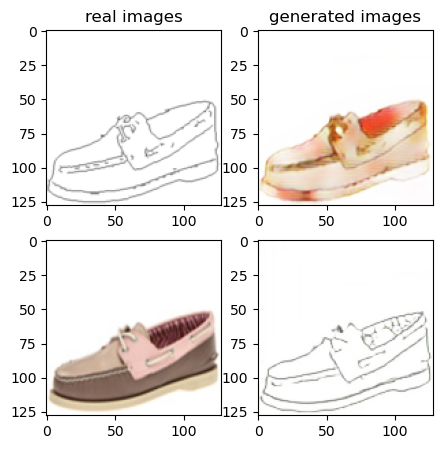

Train Epoch: 2 14% 	Total Loss: 1.265808 	Loss_G_AB: 0.265584	Loss_G_BA: 1.009089	Loss_cycle: 0.379247	Loss_D_A: 0.004006	Loss_D_B: 0.245219
1 57009 T:  0.908750057220459
Train Epoch: 2 14% 	Total Loss: 1.284853 	Loss_G_AB: 0.339792	Loss_G_BA: 1.001558	Loss_cycle: 0.382630	Loss_D_A: 0.002860	Loss_D_B: 0.228688
1 57019 T:  0.6305830478668213
Train Epoch: 2 14% 	Total Loss: 1.273438 	Loss_G_AB: 0.255083	Loss_G_BA: 0.995303	Loss_cycle: 0.333865	Loss_D_A: 0.002871	Loss_D_B: 0.311508
1 57029 T:  0.6317780017852783
Train Epoch: 2 14% 	Total Loss: 1.095210 	Loss_G_AB: 0.259582	Loss_G_BA: 0.978791	Loss_cycle: 0.215912	Loss_D_A: 0.006984	Loss_D_B: 0.253127
1 57039 T:  0.6285824775695801
Train Epoch: 2 14% 	Total Loss: 1.411315 	Loss_G_AB: 0.277345	Loss_G_BA: 1.010847	Loss_cycle: 0.501383	Loss_D_A: 0.003998	Loss_D_B: 0.261838
1 57049 T:  0.6303465366363525
Train Epoch: 2 15% 	Total Loss: 1.218123 	Loss_G_AB: 0.283709	Loss_G_BA: 0.983781	Loss_cycle: 0.338143	Loss_D_A: 0.007610	Loss_D_B: 0.238625


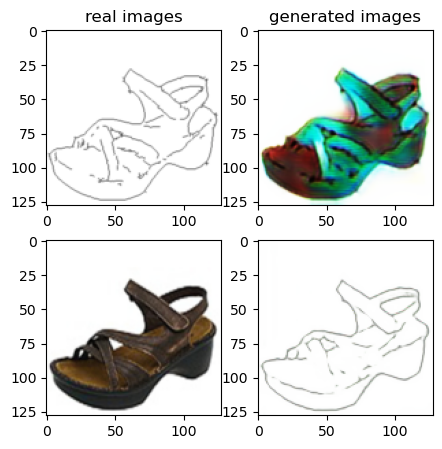

Train Epoch: 2 16% 	Total Loss: 1.198068 	Loss_G_AB: 0.256326	Loss_G_BA: 1.003057	Loss_cycle: 0.291640	Loss_D_A: 0.001085	Loss_D_B: 0.275652
1 58009 T:  0.9354617595672607
Train Epoch: 2 16% 	Total Loss: 1.414614 	Loss_G_AB: 0.318429	Loss_G_BA: 0.999219	Loss_cycle: 0.525382	Loss_D_A: 0.001039	Loss_D_B: 0.229369
1 58019 T:  0.6427102088928223
Train Epoch: 2 16% 	Total Loss: 1.272051 	Loss_G_AB: 0.286875	Loss_G_BA: 1.005263	Loss_cycle: 0.371719	Loss_D_A: 0.001509	Loss_D_B: 0.252754
1 58029 T:  0.6299295425415039
Train Epoch: 2 16% 	Total Loss: 1.209532 	Loss_G_AB: 0.266303	Loss_G_BA: 0.993601	Loss_cycle: 0.328710	Loss_D_A: 0.001401	Loss_D_B: 0.249469
1 58039 T:  0.6331167221069336
Train Epoch: 2 17% 	Total Loss: 1.271157 	Loss_G_AB: 0.277996	Loss_G_BA: 1.000728	Loss_cycle: 0.397565	Loss_D_A: 0.002399	Loss_D_B: 0.231830
1 58049 T:  0.642500638961792
Train Epoch: 2 17% 	Total Loss: 1.145175 	Loss_G_AB: 0.282655	Loss_G_BA: 0.992241	Loss_cycle: 0.260785	Loss_D_A: 0.001464	Loss_D_B: 0.245478


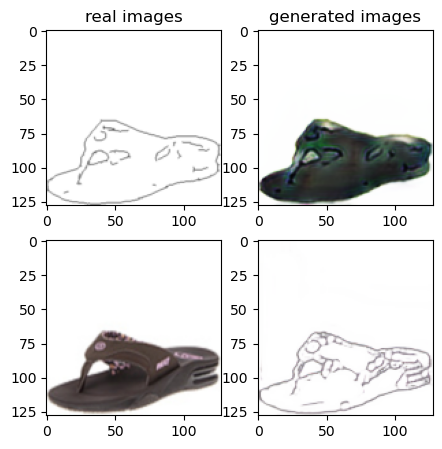

Train Epoch: 2 18% 	Total Loss: 1.289288 	Loss_G_AB: 0.259543	Loss_G_BA: 0.988205	Loss_cycle: 0.375587	Loss_D_A: 0.003529	Loss_D_B: 0.286298
1 59009 T:  0.9027862548828125
Train Epoch: 2 18% 	Total Loss: 1.276759 	Loss_G_AB: 0.313712	Loss_G_BA: 1.004630	Loss_cycle: 0.396197	Loss_D_A: 0.004275	Loss_D_B: 0.217116
1 59019 T:  0.6370751857757568
Train Epoch: 2 18% 	Total Loss: 1.206176 	Loss_G_AB: 0.285409	Loss_G_BA: 0.971875	Loss_cycle: 0.321127	Loss_D_A: 0.003047	Loss_D_B: 0.253360
1 59029 T:  0.6236112117767334
Train Epoch: 2 18% 	Total Loss: 1.331477 	Loss_G_AB: 0.330338	Loss_G_BA: 1.013568	Loss_cycle: 0.405139	Loss_D_A: 0.004160	Loss_D_B: 0.250226
1 59039 T:  0.6359238624572754
Train Epoch: 2 19% 	Total Loss: 1.359987 	Loss_G_AB: 0.294983	Loss_G_BA: 0.966380	Loss_cycle: 0.462121	Loss_D_A: 0.004905	Loss_D_B: 0.262280
1 59049 T:  0.6253812313079834
Train Epoch: 2 19% 	Total Loss: 1.460974 	Loss_G_AB: 0.287620	Loss_G_BA: 1.001438	Loss_cycle: 0.562050	Loss_D_A: 0.005684	Loss_D_B: 0.248710

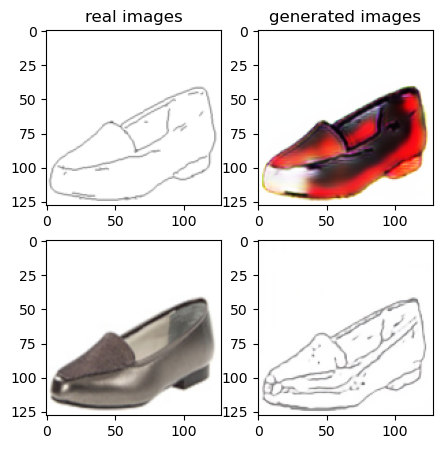

Train Epoch: 2 20% 	Total Loss: 1.367249 	Loss_G_AB: 0.386061	Loss_G_BA: 0.995593	Loss_cycle: 0.402791	Loss_D_A: 0.002595	Loss_D_B: 0.271036
1 60009 T:  0.9074499607086182
Train Epoch: 2 20% 	Total Loss: 1.348343 	Loss_G_AB: 0.297733	Loss_G_BA: 1.009650	Loss_cycle: 0.441275	Loss_D_A: 0.001945	Loss_D_B: 0.251431
1 60019 T:  0.6146671772003174
Train Epoch: 2 20% 	Total Loss: 1.374091 	Loss_G_AB: 0.313637	Loss_G_BA: 0.997789	Loss_cycle: 0.439431	Loss_D_A: 0.003288	Loss_D_B: 0.275659
1 60029 T:  0.6328015327453613
Train Epoch: 2 20% 	Total Loss: 1.429952 	Loss_G_AB: 0.287991	Loss_G_BA: 0.998544	Loss_cycle: 0.515503	Loss_D_A: 0.001798	Loss_D_B: 0.269384
1 60039 T:  0.6222538948059082
Train Epoch: 2 21% 	Total Loss: 1.227363 	Loss_G_AB: 0.269203	Loss_G_BA: 0.984415	Loss_cycle: 0.331867	Loss_D_A: 0.006963	Loss_D_B: 0.261724
1 60049 T:  0.6500723361968994
Train Epoch: 2 21% 	Total Loss: 1.411259 	Loss_G_AB: 0.280350	Loss_G_BA: 1.007137	Loss_cycle: 0.534872	Loss_D_A: 0.004090	Loss_D_B: 0.228553

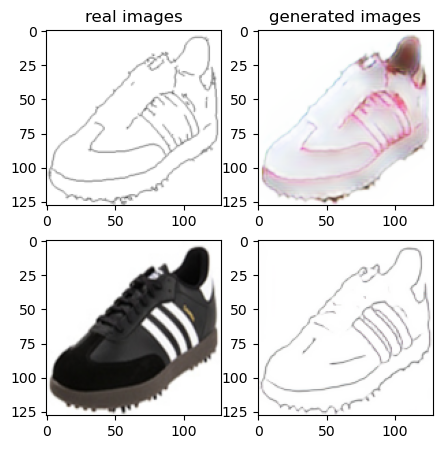

Train Epoch: 2 22% 	Total Loss: 1.333031 	Loss_G_AB: 0.261798	Loss_G_BA: 0.981037	Loss_cycle: 0.447173	Loss_D_A: 0.002750	Loss_D_B: 0.261691
1 61009 T:  1.0196630954742432
Train Epoch: 2 22% 	Total Loss: 1.302448 	Loss_G_AB: 0.331984	Loss_G_BA: 1.003581	Loss_cycle: 0.393684	Loss_D_A: 0.004048	Loss_D_B: 0.236933
1 61019 T:  0.6277186870574951
Train Epoch: 2 22% 	Total Loss: 1.403287 	Loss_G_AB: 0.307212	Loss_G_BA: 0.998413	Loss_cycle: 0.498257	Loss_D_A: 0.001504	Loss_D_B: 0.250713
1 61029 T:  0.6378319263458252
Train Epoch: 2 23% 	Total Loss: 1.252641 	Loss_G_AB: 0.306791	Loss_G_BA: 1.007090	Loss_cycle: 0.359295	Loss_D_A: 0.001537	Loss_D_B: 0.234869
1 61039 T:  0.627291202545166
Train Epoch: 2 23% 	Total Loss: 1.298809 	Loss_G_AB: 0.245986	Loss_G_BA: 0.990829	Loss_cycle: 0.382711	Loss_D_A: 0.002666	Loss_D_B: 0.295025
1 61049 T:  0.6335620880126953
Train Epoch: 2 23% 	Total Loss: 1.305590 	Loss_G_AB: 0.276840	Loss_G_BA: 0.976780	Loss_cycle: 0.425549	Loss_D_A: 0.002129	Loss_D_B: 0.251102


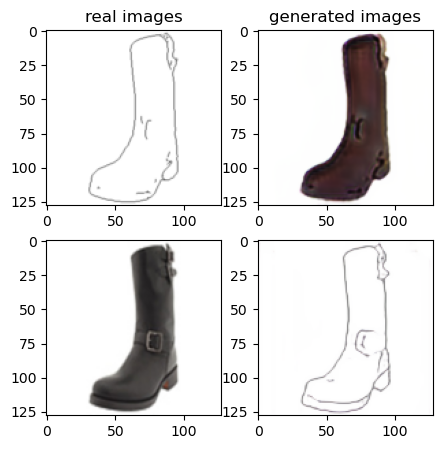

Train Epoch: 2 24% 	Total Loss: 1.388462 	Loss_G_AB: 0.273480	Loss_G_BA: 1.007663	Loss_cycle: 0.512187	Loss_D_A: 0.004337	Loss_D_B: 0.231367
1 62009 T:  0.9222190380096436
Train Epoch: 2 24% 	Total Loss: 1.332263 	Loss_G_AB: 0.306358	Loss_G_BA: 1.007137	Loss_cycle: 0.444066	Loss_D_A: 0.003227	Loss_D_B: 0.228222
1 62019 T:  0.6245043277740479
Train Epoch: 2 24% 	Total Loss: 1.347821 	Loss_G_AB: 0.292876	Loss_G_BA: 1.007211	Loss_cycle: 0.474569	Loss_D_A: 0.003360	Loss_D_B: 0.219848
1 62029 T:  0.6284124851226807
Train Epoch: 2 25% 	Total Loss: 1.292154 	Loss_G_AB: 0.255411	Loss_G_BA: 0.999588	Loss_cycle: 0.379685	Loss_D_A: 0.003148	Loss_D_B: 0.281822
1 62039 T:  0.6242921352386475
Train Epoch: 2 25% 	Total Loss: 1.253726 	Loss_G_AB: 0.288295	Loss_G_BA: 0.991914	Loss_cycle: 0.386164	Loss_D_A: 0.003050	Loss_D_B: 0.224407
1 62049 T:  0.6675822734832764
Train Epoch: 2 25% 	Total Loss: 1.368587 	Loss_G_AB: 0.300948	Loss_G_BA: 0.985674	Loss_cycle: 0.452930	Loss_D_A: 0.006486	Loss_D_B: 0.265861

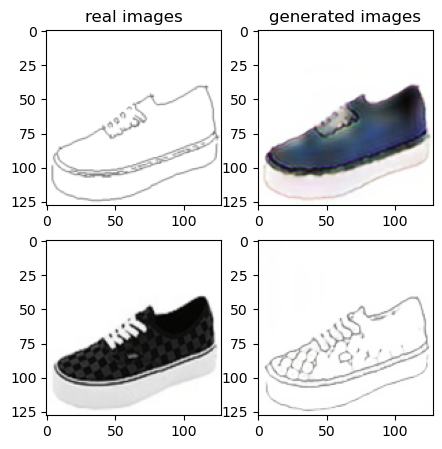

Train Epoch: 2 26% 	Total Loss: 1.282424 	Loss_G_AB: 0.268411	Loss_G_BA: 0.701631	Loss_cycle: 0.354724	Loss_D_A: 0.188131	Loss_D_B: 0.254548
1 63009 T:  0.9116017818450928
Train Epoch: 2 26% 	Total Loss: 1.276993 	Loss_G_AB: 0.284496	Loss_G_BA: 0.568672	Loss_cycle: 0.383812	Loss_D_A: 0.213477	Loss_D_B: 0.253120
1 63019 T:  0.6174595355987549
Train Epoch: 2 27% 	Total Loss: 1.291872 	Loss_G_AB: 0.281596	Loss_G_BA: 0.797422	Loss_cycle: 0.370924	Loss_D_A: 0.099314	Loss_D_B: 0.282126
1 63029 T:  0.6317830085754395
Train Epoch: 2 27% 	Total Loss: 1.287118 	Loss_G_AB: 0.273815	Loss_G_BA: 0.934039	Loss_cycle: 0.425855	Loss_D_A: 0.014375	Loss_D_B: 0.242961
1 63039 T:  0.6300480365753174
Train Epoch: 2 27% 	Total Loss: 1.332487 	Loss_G_AB: 0.282803	Loss_G_BA: 0.985310	Loss_cycle: 0.448046	Loss_D_A: 0.011706	Loss_D_B: 0.238678
1 63049 T:  0.630406379699707
Train Epoch: 2 27% 	Total Loss: 1.296779 	Loss_G_AB: 0.301197	Loss_G_BA: 0.933040	Loss_cycle: 0.439338	Loss_D_A: 0.008881	Loss_D_B: 0.231442


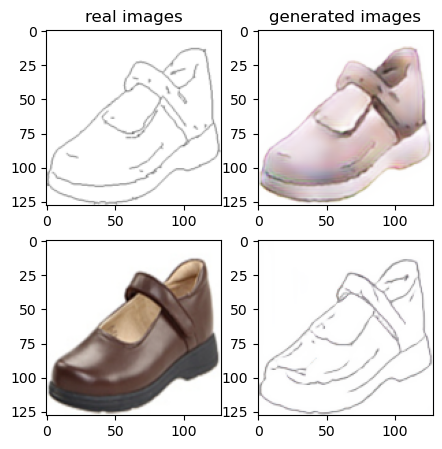

Train Epoch: 2 28% 	Total Loss: 1.183035 	Loss_G_AB: 0.285844	Loss_G_BA: 0.971032	Loss_cycle: 0.291685	Loss_D_A: 0.001860	Loss_D_B: 0.261052
1 64009 T:  0.934058666229248
Train Epoch: 2 28% 	Total Loss: 1.207989 	Loss_G_AB: 0.264738	Loss_G_BA: 0.999680	Loss_cycle: 0.313929	Loss_D_A: 0.002308	Loss_D_B: 0.259544
1 64019 T:  0.6603035926818848
Train Epoch: 2 29% 	Total Loss: 1.152437 	Loss_G_AB: 0.254679	Loss_G_BA: 0.743854	Loss_cycle: 0.241438	Loss_D_A: 0.152771	Loss_D_B: 0.258962
1 64029 T:  0.6482727527618408
Train Epoch: 2 29% 	Total Loss: 1.145219 	Loss_G_AB: 0.294689	Loss_G_BA: 0.586029	Loss_cycle: 0.227774	Loss_D_A: 0.231951	Loss_D_B: 0.245135
1 64039 T:  0.6345546245574951
Train Epoch: 2 29% 	Total Loss: 1.267809 	Loss_G_AB: 0.248114	Loss_G_BA: 0.631341	Loss_cycle: 0.341827	Loss_D_A: 0.219424	Loss_D_B: 0.266831
1 64049 T:  0.6503415107727051
Train Epoch: 2 29% 	Total Loss: 1.036473 	Loss_G_AB: 0.276960	Loss_G_BA: 0.508620	Loss_cycle: 0.258698	Loss_D_A: 0.153012	Loss_D_B: 0.231973


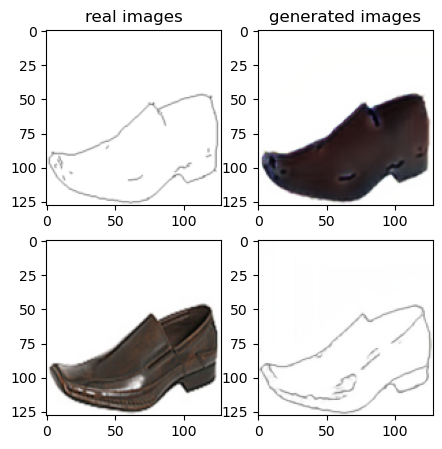

Train Epoch: 2 30% 	Total Loss: 1.324284 	Loss_G_AB: 0.265436	Loss_G_BA: 0.939108	Loss_cycle: 0.445828	Loss_D_A: 0.014860	Loss_D_B: 0.261325
1 65009 T:  0.9302964210510254
Train Epoch: 2 30% 	Total Loss: 1.228302 	Loss_G_AB: 0.282696	Loss_G_BA: 0.921668	Loss_cycle: 0.349811	Loss_D_A: 0.028056	Loss_D_B: 0.248253
1 65019 T:  0.6480836868286133
Train Epoch: 2 31% 	Total Loss: 1.469706 	Loss_G_AB: 0.300142	Loss_G_BA: 0.978165	Loss_cycle: 0.553060	Loss_D_A: 0.014766	Loss_D_B: 0.262727
1 65029 T:  0.6363112926483154
Train Epoch: 2 31% 	Total Loss: 1.197404 	Loss_G_AB: 0.349900	Loss_G_BA: 0.928066	Loss_cycle: 0.301115	Loss_D_A: 0.052246	Loss_D_B: 0.205060
1 65039 T:  0.6322364807128906
Train Epoch: 2 31% 	Total Loss: 1.267474 	Loss_G_AB: 0.293532	Loss_G_BA: 1.019423	Loss_cycle: 0.338219	Loss_D_A: 0.007096	Loss_D_B: 0.265681
1 65049 T:  0.6411828994750977
Train Epoch: 2 31% 	Total Loss: 1.291129 	Loss_G_AB: 0.304954	Loss_G_BA: 0.976282	Loss_cycle: 0.403082	Loss_D_A: 0.010750	Loss_D_B: 0.236680

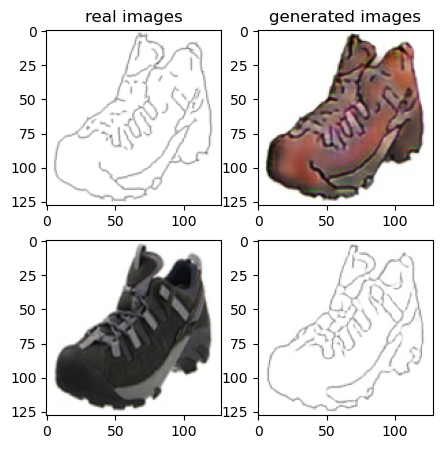

Train Epoch: 2 32% 	Total Loss: 1.230313 	Loss_G_AB: 0.277436	Loss_G_BA: 0.993325	Loss_cycle: 0.321345	Loss_D_A: 0.010920	Loss_D_B: 0.262668
1 66009 T:  0.9337813854217529
Train Epoch: 2 33% 	Total Loss: 1.175398 	Loss_G_AB: 0.314006	Loss_G_BA: 0.968451	Loss_cycle: 0.325147	Loss_D_A: 0.004549	Loss_D_B: 0.204473
1 66019 T:  0.6303601264953613
Train Epoch: 2 33% 	Total Loss: 1.445441 	Loss_G_AB: 0.308901	Loss_G_BA: 1.054485	Loss_cycle: 0.502482	Loss_D_A: 0.004484	Loss_D_B: 0.256781
1 66029 T:  0.6252138614654541
Train Epoch: 2 33% 	Total Loss: 1.436127 	Loss_G_AB: 0.318896	Loss_G_BA: 0.986002	Loss_cycle: 0.553013	Loss_D_A: 0.002226	Loss_D_B: 0.228440
1 66039 T:  0.631152868270874
Train Epoch: 2 33% 	Total Loss: 1.284340 	Loss_G_AB: 0.256622	Loss_G_BA: 1.019530	Loss_cycle: 0.382869	Loss_D_A: 0.003065	Loss_D_B: 0.260329
1 66049 T:  0.6407058238983154
Train Epoch: 2 33% 	Total Loss: 1.180042 	Loss_G_AB: 0.279528	Loss_G_BA: 1.001103	Loss_cycle: 0.277884	Loss_D_A: 0.008497	Loss_D_B: 0.253346


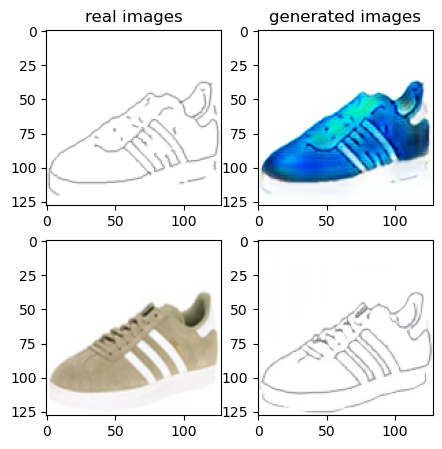

Train Epoch: 2 34% 	Total Loss: 1.277382 	Loss_G_AB: 0.374944	Loss_G_BA: 1.025352	Loss_cycle: 0.372518	Loss_D_A: 0.002307	Loss_D_B: 0.202409
1 67009 T:  0.92266845703125
Train Epoch: 2 35% 	Total Loss: 1.343841 	Loss_G_AB: 0.304404	Loss_G_BA: 0.990277	Loss_cycle: 0.435818	Loss_D_A: 0.003172	Loss_D_B: 0.257511
1 67019 T:  0.6201651096343994
Train Epoch: 2 35% 	Total Loss: 1.285275 	Loss_G_AB: 0.284784	Loss_G_BA: 0.992765	Loss_cycle: 0.382937	Loss_D_A: 0.006941	Loss_D_B: 0.256623
1 67029 T:  0.6423482894897461
Train Epoch: 2 35% 	Total Loss: 1.305141 	Loss_G_AB: 0.290925	Loss_G_BA: 1.013383	Loss_cycle: 0.408331	Loss_D_A: 0.004888	Loss_D_B: 0.239768
1 67039 T:  0.6394925117492676
Train Epoch: 2 35% 	Total Loss: 1.445035 	Loss_G_AB: 0.357678	Loss_G_BA: 0.979344	Loss_cycle: 0.558345	Loss_D_A: 0.002499	Loss_D_B: 0.215681
1 67049 T:  0.6291711330413818
Train Epoch: 2 35% 	Total Loss: 1.506018 	Loss_G_AB: 0.278525	Loss_G_BA: 0.995133	Loss_cycle: 0.586360	Loss_D_A: 0.004703	Loss_D_B: 0.278125
1

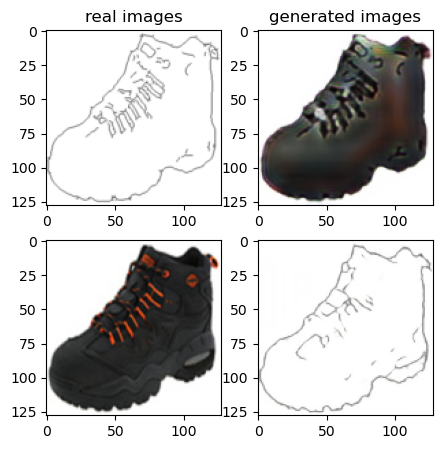

Train Epoch: 2 36% 	Total Loss: 1.157037 	Loss_G_AB: 0.276162	Loss_G_BA: 0.505138	Loss_cycle: 0.342635	Loss_D_A: 0.164975	Loss_D_B: 0.258777
1 68009 T:  0.9393768310546875
Train Epoch: 2 37% 	Total Loss: 1.293247 	Loss_G_AB: 0.278088	Loss_G_BA: 0.533885	Loss_cycle: 0.454765	Loss_D_A: 0.179821	Loss_D_B: 0.252675
1 68019 T:  0.6425259113311768
Train Epoch: 2 37% 	Total Loss: 1.372499 	Loss_G_AB: 0.298214	Loss_G_BA: 0.571252	Loss_cycle: 0.546178	Loss_D_A: 0.147619	Loss_D_B: 0.243968
1 68029 T:  0.630338191986084
Train Epoch: 2 37% 	Total Loss: 1.614174 	Loss_G_AB: 0.357901	Loss_G_BA: 0.844174	Loss_cycle: 0.617383	Loss_D_A: 0.194367	Loss_D_B: 0.201386
1 68039 T:  0.6236746311187744
Train Epoch: 2 37% 	Total Loss: 1.488048 	Loss_G_AB: 0.273788	Loss_G_BA: 0.549845	Loss_cycle: 0.657840	Loss_D_A: 0.149636	Loss_D_B: 0.268755
1 68049 T:  0.6367411613464355
Train Epoch: 2 37% 	Total Loss: 1.430625 	Loss_G_AB: 0.316232	Loss_G_BA: 0.991102	Loss_cycle: 0.547914	Loss_D_A: 0.009271	Loss_D_B: 0.219773


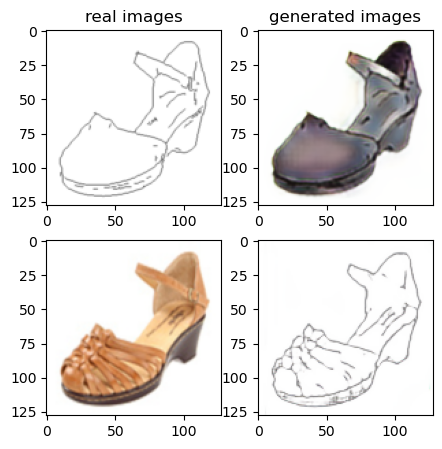

Train Epoch: 2 39% 	Total Loss: 1.269641 	Loss_G_AB: 0.286455	Loss_G_BA: 0.992610	Loss_cycle: 0.373393	Loss_D_A: 0.016702	Loss_D_B: 0.240014
1 69009 T:  1.0176093578338623
Train Epoch: 2 39% 	Total Loss: 1.249988 	Loss_G_AB: 0.284563	Loss_G_BA: 1.035575	Loss_cycle: 0.350909	Loss_D_A: 0.006329	Loss_D_B: 0.232681
1 69019 T:  0.632800817489624
Train Epoch: 2 39% 	Total Loss: 1.303838 	Loss_G_AB: 0.286296	Loss_G_BA: 0.980457	Loss_cycle: 0.430878	Loss_D_A: 0.004227	Loss_D_B: 0.235357
1 69029 T:  0.6192166805267334
Train Epoch: 2 39% 	Total Loss: 1.271392 	Loss_G_AB: 0.286758	Loss_G_BA: 0.994684	Loss_cycle: 0.389426	Loss_D_A: 0.010092	Loss_D_B: 0.231153
1 69039 T:  0.6326391696929932
Train Epoch: 2 39% 	Total Loss: 1.194433 	Loss_G_AB: 0.292484	Loss_G_BA: 0.972706	Loss_cycle: 0.302752	Loss_D_A: 0.008835	Loss_D_B: 0.250250
1 69049 T:  0.6285696029663086
Train Epoch: 2 39% 	Total Loss: 1.224765 	Loss_G_AB: 0.256171	Loss_G_BA: 1.015168	Loss_cycle: 0.324420	Loss_D_A: 0.004092	Loss_D_B: 0.260584


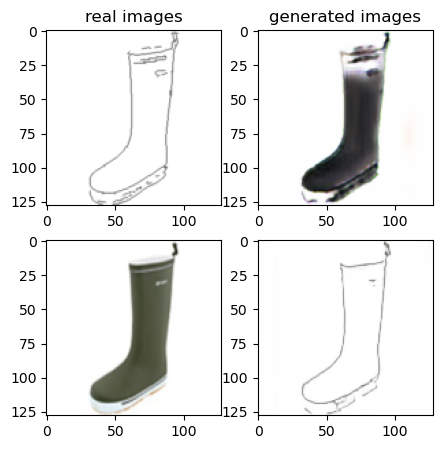

Train Epoch: 2 41% 	Total Loss: 1.127847 	Loss_G_AB: 0.265086	Loss_G_BA: 0.613752	Loss_cycle: 0.287745	Loss_D_A: 0.144288	Loss_D_B: 0.256396
1 70009 T:  0.9046440124511719
Train Epoch: 2 41% 	Total Loss: 1.305020 	Loss_G_AB: 0.296932	Loss_G_BA: 0.600708	Loss_cycle: 0.399153	Loss_D_A: 0.215466	Loss_D_B: 0.241581
1 70019 T:  0.6239957809448242
Train Epoch: 2 41% 	Total Loss: 1.364434 	Loss_G_AB: 0.288400	Loss_G_BA: 0.587466	Loss_cycle: 0.508743	Loss_D_A: 0.170943	Loss_D_B: 0.246815
1 70029 T:  0.6361429691314697
Train Epoch: 2 41% 	Total Loss: 1.190356 	Loss_G_AB: 0.331268	Loss_G_BA: 0.496177	Loss_cycle: 0.441062	Loss_D_A: 0.113578	Loss_D_B: 0.221993
1 70039 T:  0.6374976634979248
Train Epoch: 2 41% 	Total Loss: 1.277619 	Loss_G_AB: 0.308151	Loss_G_BA: 0.727647	Loss_cycle: 0.386952	Loss_D_A: 0.117600	Loss_D_B: 0.255169
1 70049 T:  0.6300833225250244
Train Epoch: 2 41% 	Total Loss: 1.320206 	Loss_G_AB: 0.271159	Loss_G_BA: 0.630604	Loss_cycle: 0.458998	Loss_D_A: 0.153768	Loss_D_B: 0.256559

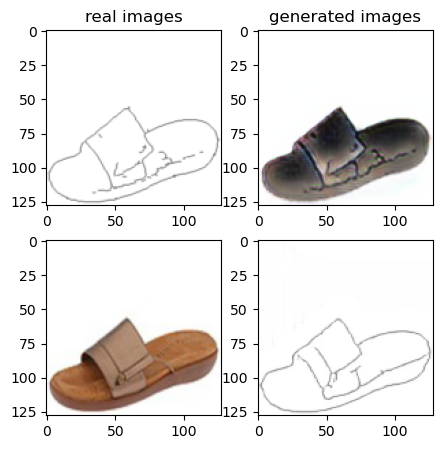

Train Epoch: 2 43% 	Total Loss: 1.309879 	Loss_G_AB: 0.263911	Loss_G_BA: 0.918433	Loss_cycle: 0.399265	Loss_D_A: 0.065974	Loss_D_B: 0.253468
1 71009 T:  0.8973712921142578
Train Epoch: 2 43% 	Total Loss: 1.285312 	Loss_G_AB: 0.265077	Loss_G_BA: 0.678811	Loss_cycle: 0.420876	Loss_D_A: 0.144710	Loss_D_B: 0.247781
1 71019 T:  0.6301717758178711
Train Epoch: 2 43% 	Total Loss: 1.150699 	Loss_G_AB: 0.257245	Loss_G_BA: 0.690734	Loss_cycle: 0.310560	Loss_D_A: 0.115211	Loss_D_B: 0.250938
1 71029 T:  0.6304187774658203
Train Epoch: 2 43% 	Total Loss: 1.081417 	Loss_G_AB: 0.272034	Loss_G_BA: 0.518314	Loss_cycle: 0.311816	Loss_D_A: 0.135358	Loss_D_B: 0.239069
1 71039 T:  0.6225972175598145
Train Epoch: 2 43% 	Total Loss: 1.238967 	Loss_G_AB: 0.264893	Loss_G_BA: 0.990425	Loss_cycle: 0.320505	Loss_D_A: 0.050158	Loss_D_B: 0.240646
1 71049 T:  0.6443195343017578
Train Epoch: 2 43% 	Total Loss: 1.211438 	Loss_G_AB: 0.263194	Loss_G_BA: 0.865206	Loss_cycle: 0.348470	Loss_D_A: 0.045728	Loss_D_B: 0.253040

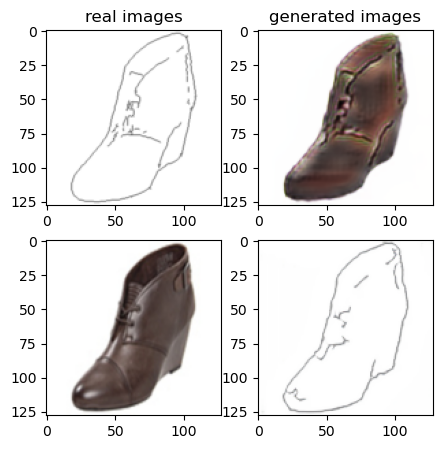

Train Epoch: 2 45% 	Total Loss: 1.185820 	Loss_G_AB: 0.273499	Loss_G_BA: 0.659398	Loss_cycle: 0.331379	Loss_D_A: 0.129138	Loss_D_B: 0.258854
1 72009 T:  0.9033288955688477
Train Epoch: 2 45% 	Total Loss: 1.088987 	Loss_G_AB: 0.265330	Loss_G_BA: 0.695466	Loss_cycle: 0.295827	Loss_D_A: 0.078506	Loss_D_B: 0.234256
1 72019 T:  0.6181018352508545
Train Epoch: 2 45% 	Total Loss: 1.123275 	Loss_G_AB: 0.261734	Loss_G_BA: 0.662196	Loss_cycle: 0.289509	Loss_D_A: 0.119394	Loss_D_B: 0.252407
1 72029 T:  0.6306602954864502
Train Epoch: 2 45% 	Total Loss: 1.177158 	Loss_G_AB: 0.266162	Loss_G_BA: 0.715250	Loss_cycle: 0.310545	Loss_D_A: 0.125605	Loss_D_B: 0.250302
1 72039 T:  0.6160521507263184
Train Epoch: 2 45% 	Total Loss: 1.144892 	Loss_G_AB: 0.270335	Loss_G_BA: 0.694722	Loss_cycle: 0.307381	Loss_D_A: 0.099497	Loss_D_B: 0.255486
1 72049 T:  0.6322031021118164
Train Epoch: 2 45% 	Total Loss: 1.081373 	Loss_G_AB: 0.277710	Loss_G_BA: 0.680266	Loss_cycle: 0.285286	Loss_D_A: 0.073339	Loss_D_B: 0.243760

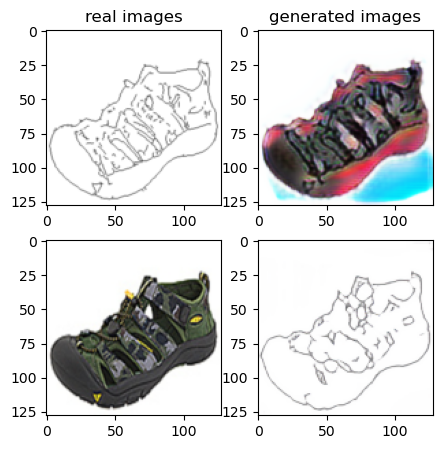

Train Epoch: 2 47% 	Total Loss: 1.270196 	Loss_G_AB: 0.280133	Loss_G_BA: 0.868851	Loss_cycle: 0.440894	Loss_D_A: 0.023983	Loss_D_B: 0.230827
1 73009 T:  0.9245288372039795
Train Epoch: 2 47% 	Total Loss: 1.264181 	Loss_G_AB: 0.277575	Loss_G_BA: 0.957221	Loss_cycle: 0.340022	Loss_D_A: 0.039405	Loss_D_B: 0.267356
1 73019 T:  0.639531135559082
Train Epoch: 2 47% 	Total Loss: 1.436510 	Loss_G_AB: 0.326035	Loss_G_BA: 1.014941	Loss_cycle: 0.506812	Loss_D_A: 0.006452	Loss_D_B: 0.252759
1 73029 T:  0.6304013729095459
Train Epoch: 2 47% 	Total Loss: 1.409947 	Loss_G_AB: 0.270657	Loss_G_BA: 0.995495	Loss_cycle: 0.503913	Loss_D_A: 0.004056	Loss_D_B: 0.268902
1 73039 T:  0.6428556442260742
Train Epoch: 2 47% 	Total Loss: 1.384414 	Loss_G_AB: 0.318578	Loss_G_BA: 0.989133	Loss_cycle: 0.484312	Loss_D_A: 0.011907	Loss_D_B: 0.234339
1 73049 T:  0.627530574798584
Train Epoch: 2 47% 	Total Loss: 1.302085 	Loss_G_AB: 0.284598	Loss_G_BA: 0.933606	Loss_cycle: 0.419066	Loss_D_A: 0.011849	Loss_D_B: 0.262068
1

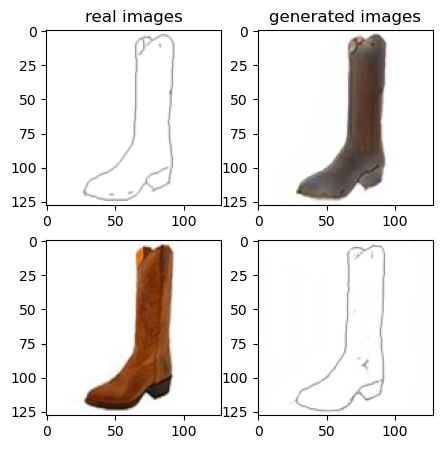

Train Epoch: 2 49% 	Total Loss: 1.163024 	Loss_G_AB: 0.258898	Loss_G_BA: 0.918382	Loss_cycle: 0.255654	Loss_D_A: 0.053807	Loss_D_B: 0.264924
1 74009 T:  0.9098703861236572
Train Epoch: 2 49% 	Total Loss: 1.264453 	Loss_G_AB: 0.284016	Loss_G_BA: 0.984490	Loss_cycle: 0.372324	Loss_D_A: 0.009299	Loss_D_B: 0.248577
1 74019 T:  0.6479783058166504
Train Epoch: 2 49% 	Total Loss: 1.350069 	Loss_G_AB: 0.333938	Loss_G_BA: 1.008519	Loss_cycle: 0.445296	Loss_D_A: 0.007490	Loss_D_B: 0.226056
1 74029 T:  0.636195182800293
Train Epoch: 2 49% 	Total Loss: 1.453834 	Loss_G_AB: 0.275500	Loss_G_BA: 0.998654	Loss_cycle: 0.545161	Loss_D_A: 0.004574	Loss_D_B: 0.267021
1 74039 T:  0.6253194808959961
Train Epoch: 2 49% 	Total Loss: 1.390432 	Loss_G_AB: 0.275489	Loss_G_BA: 0.993479	Loss_cycle: 0.459461	Loss_D_A: 0.043254	Loss_D_B: 0.253234
1 74049 T:  0.6411254405975342
Train Epoch: 2 49% 	Total Loss: 1.210142 	Loss_G_AB: 0.281412	Loss_G_BA: 0.764981	Loss_cycle: 0.343886	Loss_D_A: 0.102563	Loss_D_B: 0.240496


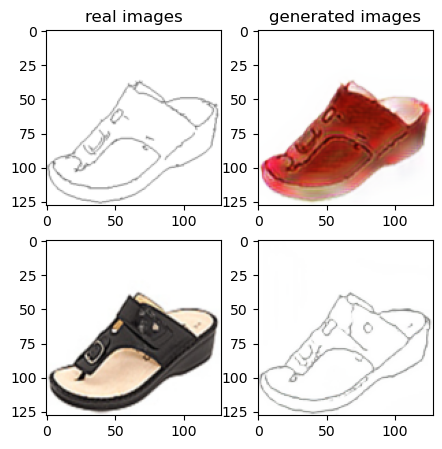

Train Epoch: 2 51% 	Total Loss: 1.169446 	Loss_G_AB: 0.279389	Loss_G_BA: 0.968964	Loss_cycle: 0.300451	Loss_D_A: 0.007706	Loss_D_B: 0.237112
1 75009 T:  0.9090135097503662
Train Epoch: 2 51% 	Total Loss: 1.198390 	Loss_G_AB: 0.276949	Loss_G_BA: 1.020671	Loss_cycle: 0.300262	Loss_D_A: 0.005340	Loss_D_B: 0.243978
1 75019 T:  0.6302287578582764
Train Epoch: 2 51% 	Total Loss: 1.228733 	Loss_G_AB: 0.288148	Loss_G_BA: 1.019230	Loss_cycle: 0.326286	Loss_D_A: 0.003624	Loss_D_B: 0.245134
1 75029 T:  0.6302988529205322
Train Epoch: 2 51% 	Total Loss: 1.203595 	Loss_G_AB: 0.259278	Loss_G_BA: 1.018289	Loss_cycle: 0.304025	Loss_D_A: 0.003899	Loss_D_B: 0.256887
1 75039 T:  0.6242127418518066
Train Epoch: 2 51% 	Total Loss: 1.249678 	Loss_G_AB: 0.264053	Loss_G_BA: 0.983310	Loss_cycle: 0.359599	Loss_D_A: 0.002898	Loss_D_B: 0.263500
1 75049 T:  0.6281499862670898
Train Epoch: 2 51% 	Total Loss: 1.192475 	Loss_G_AB: 0.265325	Loss_G_BA: 0.996242	Loss_cycle: 0.297410	Loss_D_A: 0.003969	Loss_D_B: 0.260313

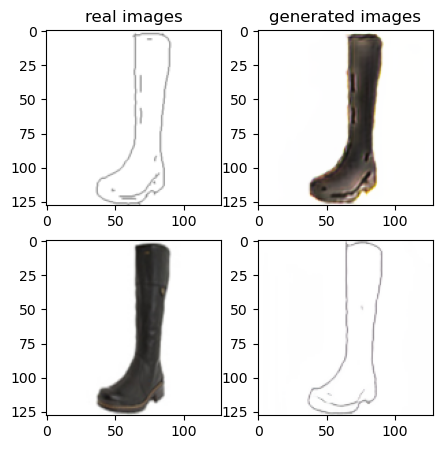

Train Epoch: 2 53% 	Total Loss: 1.107326 	Loss_G_AB: 0.268245	Loss_G_BA: 1.009047	Loss_cycle: 0.213494	Loss_D_A: 0.002555	Loss_D_B: 0.252631
1 76009 T:  0.8942937850952148
Train Epoch: 2 53% 	Total Loss: 1.222750 	Loss_G_AB: 0.294054	Loss_G_BA: 1.002335	Loss_cycle: 0.330040	Loss_D_A: 0.002248	Loss_D_B: 0.242267
1 76019 T:  0.6537785530090332
Train Epoch: 2 53% 	Total Loss: 1.205992 	Loss_G_AB: 0.260545	Loss_G_BA: 0.990991	Loss_cycle: 0.322428	Loss_D_A: 0.005021	Loss_D_B: 0.252775
1 76029 T:  0.6249938011169434
Train Epoch: 2 53% 	Total Loss: 1.250802 	Loss_G_AB: 0.266345	Loss_G_BA: 1.014798	Loss_cycle: 0.354663	Loss_D_A: 0.002411	Loss_D_B: 0.253156
1 76039 T:  0.6205189228057861
Train Epoch: 2 53% 	Total Loss: 1.256951 	Loss_G_AB: 0.285845	Loss_G_BA: 0.991116	Loss_cycle: 0.379430	Loss_D_A: 0.002367	Loss_D_B: 0.236673
1 76049 T:  0.6367042064666748
Train Epoch: 2 53% 	Total Loss: 1.217984 	Loss_G_AB: 0.285114	Loss_G_BA: 1.005015	Loss_cycle: 0.335063	Loss_D_A: 0.003292	Loss_D_B: 0.234565

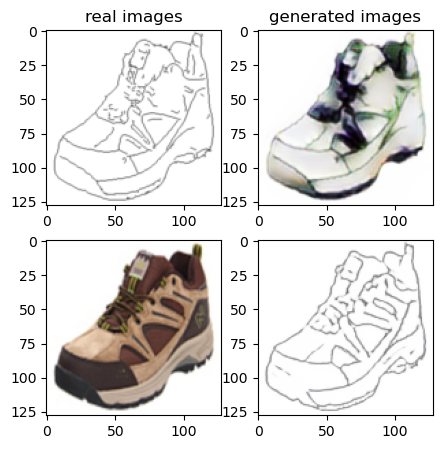

Train Epoch: 2 55% 	Total Loss: 1.249127 	Loss_G_AB: 0.275286	Loss_G_BA: 1.012950	Loss_cycle: 0.359188	Loss_D_A: 0.006628	Loss_D_B: 0.239193
1 77009 T:  1.0338196754455566
Train Epoch: 2 55% 	Total Loss: 1.200611 	Loss_G_AB: 0.266338	Loss_G_BA: 0.979724	Loss_cycle: 0.313608	Loss_D_A: 0.008319	Loss_D_B: 0.255652
1 77019 T:  0.6388123035430908
Train Epoch: 2 55% 	Total Loss: 1.156909 	Loss_G_AB: 0.263865	Loss_G_BA: 1.002219	Loss_cycle: 0.259903	Loss_D_A: 0.007854	Loss_D_B: 0.256110
1 77029 T:  0.6399714946746826
Train Epoch: 2 55% 	Total Loss: 1.174523 	Loss_G_AB: 0.274231	Loss_G_BA: 1.009747	Loss_cycle: 0.295173	Loss_D_A: 0.003169	Loss_D_B: 0.234192
1 77039 T:  0.6277716159820557
Train Epoch: 2 55% 	Total Loss: 1.214837 	Loss_G_AB: 0.294383	Loss_G_BA: 0.990845	Loss_cycle: 0.329309	Loss_D_A: 0.002141	Loss_D_B: 0.240772
1 77049 T:  0.6350564956665039
Train Epoch: 2 55% 	Total Loss: 1.307465 	Loss_G_AB: 0.275710	Loss_G_BA: 0.991640	Loss_cycle: 0.410317	Loss_D_A: 0.005257	Loss_D_B: 0.258216

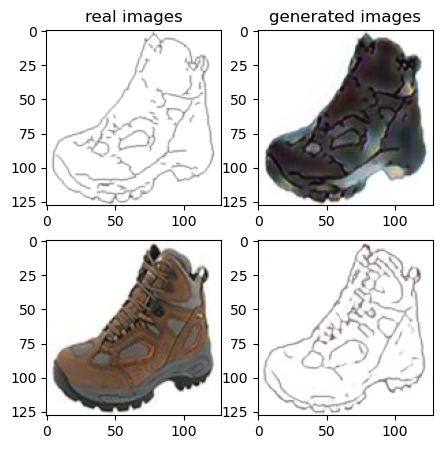

Train Epoch: 2 57% 	Total Loss: 1.204864 	Loss_G_AB: 0.306439	Loss_G_BA: 0.991369	Loss_cycle: 0.321839	Loss_D_A: 0.002236	Loss_D_B: 0.231885
1 78009 T:  0.9295425415039062
Train Epoch: 2 57% 	Total Loss: 1.260798 	Loss_G_AB: 0.272280	Loss_G_BA: 0.992649	Loss_cycle: 0.371129	Loss_D_A: 0.002658	Loss_D_B: 0.254546
1 78019 T:  0.6387946605682373
Train Epoch: 2 57% 	Total Loss: 1.266356 	Loss_G_AB: 0.341962	Loss_G_BA: 0.991929	Loss_cycle: 0.388222	Loss_D_A: 0.001807	Loss_D_B: 0.209382
1 78029 T:  0.6186549663543701
Train Epoch: 2 57% 	Total Loss: 1.295468 	Loss_G_AB: 0.318451	Loss_G_BA: 1.015952	Loss_cycle: 0.364216	Loss_D_A: 0.002645	Loss_D_B: 0.261406
1 78039 T:  0.6180851459503174
Train Epoch: 2 57% 	Total Loss: 1.218282 	Loss_G_AB: 0.278565	Loss_G_BA: 0.986929	Loss_cycle: 0.342613	Loss_D_A: 0.001551	Loss_D_B: 0.241372
1 78049 T:  0.6220459938049316
Train Epoch: 2 57% 	Total Loss: 1.172337 	Loss_G_AB: 0.297073	Loss_G_BA: 1.001464	Loss_cycle: 0.287001	Loss_D_A: 0.001638	Loss_D_B: 0.234430

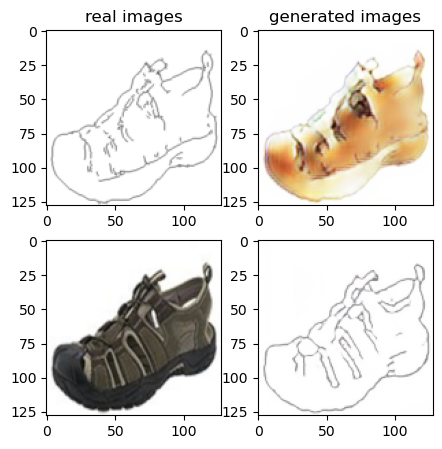

Train Epoch: 2 59% 	Total Loss: 1.232688 	Loss_G_AB: 0.297819	Loss_G_BA: 0.947798	Loss_cycle: 0.363883	Loss_D_A: 0.009657	Loss_D_B: 0.236340
1 79009 T:  0.920975923538208
Train Epoch: 2 59% 	Total Loss: 1.193613 	Loss_G_AB: 0.226913	Loss_G_BA: 1.038117	Loss_cycle: 0.286887	Loss_D_A: 0.009998	Loss_D_B: 0.264214
1 79019 T:  0.6309223175048828
Train Epoch: 2 59% 	Total Loss: 1.319295 	Loss_G_AB: 0.299949	Loss_G_BA: 0.996835	Loss_cycle: 0.432325	Loss_D_A: 0.006623	Loss_D_B: 0.231954
1 79029 T:  0.6234946250915527
Train Epoch: 2 59% 	Total Loss: 1.206945 	Loss_G_AB: 0.299709	Loss_G_BA: 1.007862	Loss_cycle: 0.302239	Loss_D_A: 0.003425	Loss_D_B: 0.247496
1 79039 T:  0.6427657604217529
Train Epoch: 2 59% 	Total Loss: 1.163942 	Loss_G_AB: 0.269472	Loss_G_BA: 0.994572	Loss_cycle: 0.286008	Loss_D_A: 0.003996	Loss_D_B: 0.241916
1 79049 T:  0.6329145431518555
Train Epoch: 2 59% 	Total Loss: 1.172956 	Loss_G_AB: 0.255115	Loss_G_BA: 0.926197	Loss_cycle: 0.303597	Loss_D_A: 0.028593	Loss_D_B: 0.250110


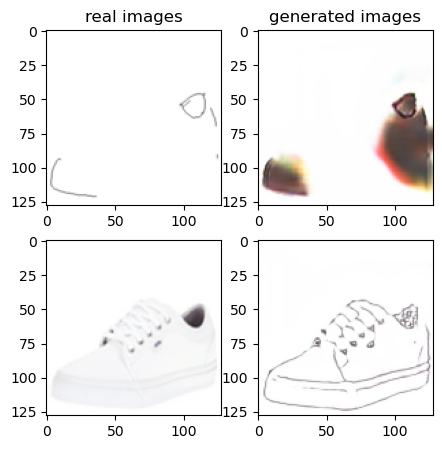

Train Epoch: 2 61% 	Total Loss: 1.125504 	Loss_G_AB: 0.272277	Loss_G_BA: 0.987975	Loss_cycle: 0.230375	Loss_D_A: 0.008122	Loss_D_B: 0.256881
1 80009 T:  0.9148931503295898
Train Epoch: 2 61% 	Total Loss: 1.312378 	Loss_G_AB: 0.286272	Loss_G_BA: 0.982646	Loss_cycle: 0.433916	Loss_D_A: 0.002412	Loss_D_B: 0.241590
1 80019 T:  0.6243901252746582
Train Epoch: 2 61% 	Total Loss: 1.396904 	Loss_G_AB: 0.292568	Loss_G_BA: 0.994286	Loss_cycle: 0.504199	Loss_D_A: 0.002736	Loss_D_B: 0.246542
1 80029 T:  0.6118273735046387
Train Epoch: 2 61% 	Total Loss: 1.298560 	Loss_G_AB: 0.335076	Loss_G_BA: 0.961383	Loss_cycle: 0.428106	Loss_D_A: 0.004117	Loss_D_B: 0.218107
1 80039 T:  0.6243255138397217
Train Epoch: 2 61% 	Total Loss: 1.278631 	Loss_G_AB: 0.264179	Loss_G_BA: 0.999206	Loss_cycle: 0.369678	Loss_D_A: 0.003822	Loss_D_B: 0.273438
1 80049 T:  0.638181209564209
Train Epoch: 2 61% 	Total Loss: 1.340272 	Loss_G_AB: 0.329663	Loss_G_BA: 0.998470	Loss_cycle: 0.439240	Loss_D_A: 0.009258	Loss_D_B: 0.227708


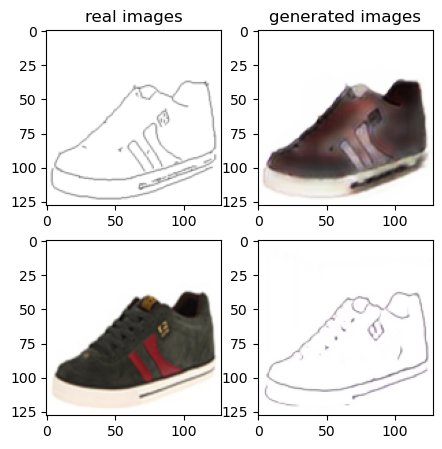

Train Epoch: 2 63% 	Total Loss: 1.163866 	Loss_G_AB: 0.277322	Loss_G_BA: 1.016214	Loss_cycle: 0.263429	Loss_D_A: 0.001396	Loss_D_B: 0.252273
1 81009 T:  0.8938302993774414
Train Epoch: 2 63% 	Total Loss: 1.077970 	Loss_G_AB: 0.274951	Loss_G_BA: 0.992228	Loss_cycle: 0.210026	Loss_D_A: 0.001213	Loss_D_B: 0.233142
1 81019 T:  0.6307995319366455
Train Epoch: 2 63% 	Total Loss: 1.356109 	Loss_G_AB: 0.270652	Loss_G_BA: 1.005118	Loss_cycle: 0.436600	Loss_D_A: 0.002115	Loss_D_B: 0.279509
1 81029 T:  0.6239464282989502
Train Epoch: 2 63% 	Total Loss: 1.164765 	Loss_G_AB: 0.263562	Loss_G_BA: 0.992494	Loss_cycle: 0.285543	Loss_D_A: 0.001519	Loss_D_B: 0.249675
1 81039 T:  0.6281206607818604
Train Epoch: 2 63% 	Total Loss: 1.211709 	Loss_G_AB: 0.266034	Loss_G_BA: 0.998833	Loss_cycle: 0.324017	Loss_D_A: 0.001625	Loss_D_B: 0.253634
1 81049 T:  0.6364169120788574
Train Epoch: 2 63% 	Total Loss: 1.178609 	Loss_G_AB: 0.280349	Loss_G_BA: 1.008009	Loss_cycle: 0.301309	Loss_D_A: 0.001389	Loss_D_B: 0.231732

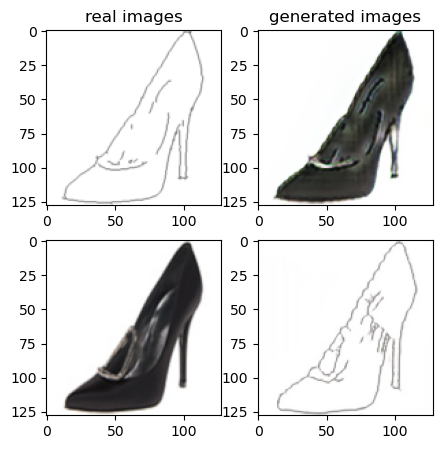

Train Epoch: 2 65% 	Total Loss: 1.167635 	Loss_G_AB: 0.270743	Loss_G_BA: 1.015751	Loss_cycle: 0.263733	Loss_D_A: 0.025741	Loss_D_B: 0.234914
1 82009 T:  0.9094829559326172
Train Epoch: 2 65% 	Total Loss: 1.444274 	Loss_G_AB: 0.318178	Loss_G_BA: 1.013165	Loss_cycle: 0.517427	Loss_D_A: 0.007043	Loss_D_B: 0.254133
1 82019 T:  0.6344842910766602
Train Epoch: 2 65% 	Total Loss: 1.258279 	Loss_G_AB: 0.280247	Loss_G_BA: 0.967000	Loss_cycle: 0.374502	Loss_D_A: 0.006763	Loss_D_B: 0.253390
1 82029 T:  0.6264896392822266
Train Epoch: 2 65% 	Total Loss: 1.210627 	Loss_G_AB: 0.270309	Loss_G_BA: 0.884184	Loss_cycle: 0.362183	Loss_D_A: 0.025554	Loss_D_B: 0.245644
1 82039 T:  0.6168637275695801
Train Epoch: 2 65% 	Total Loss: 1.187690 	Loss_G_AB: 0.280617	Loss_G_BA: 0.903754	Loss_cycle: 0.289368	Loss_D_A: 0.053186	Loss_D_B: 0.252951
1 82049 T:  0.6364047527313232
Train Epoch: 2 65% 	Total Loss: 1.183662 	Loss_G_AB: 0.283168	Loss_G_BA: 0.881109	Loss_cycle: 0.338700	Loss_D_A: 0.033862	Loss_D_B: 0.228961

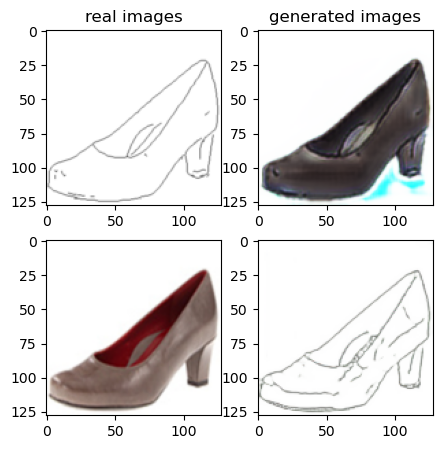

Train Epoch: 2 67% 	Total Loss: 1.120004 	Loss_G_AB: 0.282372	Loss_G_BA: 1.006292	Loss_cycle: 0.236805	Loss_D_A: 0.002064	Loss_D_B: 0.236803
1 83009 T:  0.9120304584503174
Train Epoch: 2 67% 	Total Loss: 1.255273 	Loss_G_AB: 0.275276	Loss_G_BA: 0.991947	Loss_cycle: 0.382347	Loss_D_A: 0.002437	Loss_D_B: 0.236878
1 83019 T:  0.633392333984375
Train Epoch: 2 67% 	Total Loss: 1.202376 	Loss_G_AB: 0.270347	Loss_G_BA: 0.987367	Loss_cycle: 0.317531	Loss_D_A: 0.003876	Loss_D_B: 0.252111
1 83029 T:  0.6271078586578369
Train Epoch: 2 67% 	Total Loss: 1.147835 	Loss_G_AB: 0.274610	Loss_G_BA: 1.022164	Loss_cycle: 0.248869	Loss_D_A: 0.003130	Loss_D_B: 0.247449
1 83039 T:  0.6263785362243652
Train Epoch: 2 67% 	Total Loss: 1.169730 	Loss_G_AB: 0.265061	Loss_G_BA: 0.975738	Loss_cycle: 0.297269	Loss_D_A: 0.006284	Loss_D_B: 0.245777
1 83049 T:  0.6397747993469238
Train Epoch: 2 67% 	Total Loss: 1.202831 	Loss_G_AB: 0.287856	Loss_G_BA: 0.967142	Loss_cycle: 0.309837	Loss_D_A: 0.037507	Loss_D_B: 0.227989


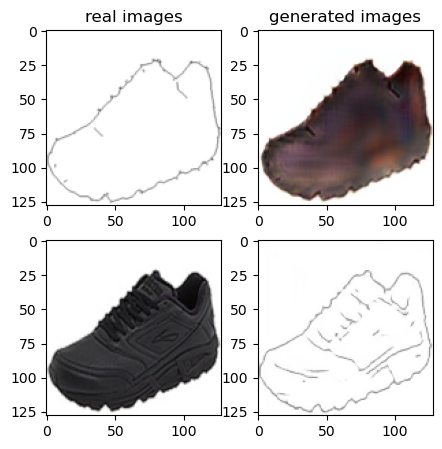

Train Epoch: 2 69% 	Total Loss: 1.130210 	Loss_G_AB: 0.247244	Loss_G_BA: 0.503145	Loss_cycle: 0.310213	Loss_D_A: 0.183407	Loss_D_B: 0.261396
1 84009 T:  0.9215483665466309
Train Epoch: 2 69% 	Total Loss: 1.210991 	Loss_G_AB: 0.269525	Loss_G_BA: 0.880314	Loss_cycle: 0.331486	Loss_D_A: 0.064318	Loss_D_B: 0.240267
1 84019 T:  0.6120450496673584
Train Epoch: 2 69% 	Total Loss: 1.186168 	Loss_G_AB: 0.286564	Loss_G_BA: 0.940211	Loss_cycle: 0.315893	Loss_D_A: 0.020261	Loss_D_B: 0.236626
1 84029 T:  0.6302096843719482
Train Epoch: 2 69% 	Total Loss: 1.199213 	Loss_G_AB: 0.261207	Loss_G_BA: 0.954394	Loss_cycle: 0.325306	Loss_D_A: 0.008511	Loss_D_B: 0.257596
1 84039 T:  0.6369624137878418
Train Epoch: 2 69% 	Total Loss: 1.213594 	Loss_G_AB: 0.281037	Loss_G_BA: 1.029663	Loss_cycle: 0.294857	Loss_D_A: 0.021895	Loss_D_B: 0.241492
1 84049 T:  0.6357216835021973
Train Epoch: 2 69% 	Total Loss: 1.099899 	Loss_G_AB: 0.276379	Loss_G_BA: 0.932869	Loss_cycle: 0.266720	Loss_D_A: 0.003509	Loss_D_B: 0.225045

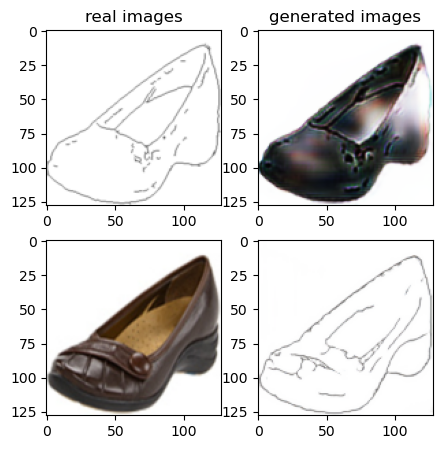

Train Epoch: 2 71% 	Total Loss: 1.291689 	Loss_G_AB: 0.251114	Loss_G_BA: 0.989180	Loss_cycle: 0.372226	Loss_D_A: 0.029896	Loss_D_B: 0.269421
1 85009 T:  1.0175492763519287
Train Epoch: 2 71% 	Total Loss: 1.215112 	Loss_G_AB: 0.271208	Loss_G_BA: 0.833886	Loss_cycle: 0.372616	Loss_D_A: 0.039632	Loss_D_B: 0.250316
1 85019 T:  0.618995189666748
Train Epoch: 2 71% 	Total Loss: 1.326946 	Loss_G_AB: 0.283066	Loss_G_BA: 0.926760	Loss_cycle: 0.454629	Loss_D_A: 0.028978	Loss_D_B: 0.238427
1 85029 T:  0.6209499835968018
Train Epoch: 2 71% 	Total Loss: 1.396808 	Loss_G_AB: 0.239760	Loss_G_BA: 1.087924	Loss_cycle: 0.443669	Loss_D_A: 0.013341	Loss_D_B: 0.275956
1 85039 T:  0.6306562423706055
Train Epoch: 2 71% 	Total Loss: 1.148619 	Loss_G_AB: 0.299870	Loss_G_BA: 1.038820	Loss_cycle: 0.241916	Loss_D_A: 0.006634	Loss_D_B: 0.230725
1 85049 T:  0.6264443397521973
Train Epoch: 2 71% 	Total Loss: 1.189590 	Loss_G_AB: 0.268021	Loss_G_BA: 1.008205	Loss_cycle: 0.296557	Loss_D_A: 0.004010	Loss_D_B: 0.250910


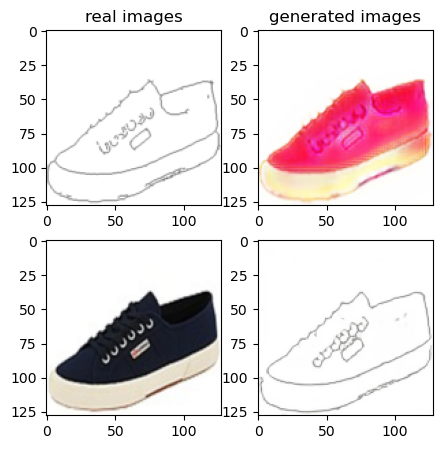

Train Epoch: 2 73% 	Total Loss: 1.162948 	Loss_G_AB: 0.326680	Loss_G_BA: 0.951384	Loss_cycle: 0.266096	Loss_D_A: 0.010699	Loss_D_B: 0.247121
1 86009 T:  0.9234135150909424
Train Epoch: 2 73% 	Total Loss: 1.354481 	Loss_G_AB: 0.280102	Loss_G_BA: 0.974998	Loss_cycle: 0.474621	Loss_D_A: 0.004462	Loss_D_B: 0.247849
1 86019 T:  0.6280820369720459
Train Epoch: 2 73% 	Total Loss: 1.188301 	Loss_G_AB: 0.288398	Loss_G_BA: 0.975675	Loss_cycle: 0.322478	Loss_D_A: 0.004081	Loss_D_B: 0.229706
1 86029 T:  0.6190979480743408
Train Epoch: 2 73% 	Total Loss: 1.167691 	Loss_G_AB: 0.274057	Loss_G_BA: 1.005399	Loss_cycle: 0.272136	Loss_D_A: 0.009301	Loss_D_B: 0.246527
1 86039 T:  0.6305837631225586
Train Epoch: 2 73% 	Total Loss: 1.152293 	Loss_G_AB: 0.273553	Loss_G_BA: 0.959018	Loss_cycle: 0.282276	Loss_D_A: 0.013576	Loss_D_B: 0.240156
1 86049 T:  0.6357197761535645
Train Epoch: 2 73% 	Total Loss: 1.158934 	Loss_G_AB: 0.263937	Loss_G_BA: 0.969140	Loss_cycle: 0.283493	Loss_D_A: 0.016873	Loss_D_B: 0.242029

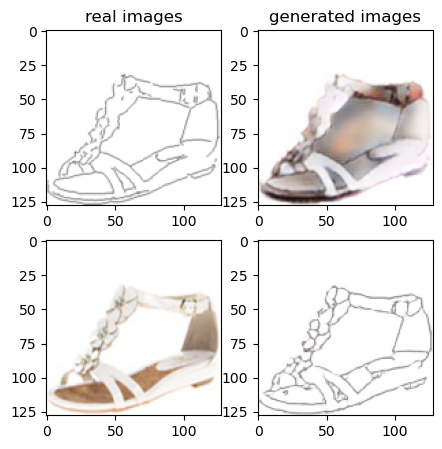

Train Epoch: 2 75% 	Total Loss: 1.358411 	Loss_G_AB: 0.256616	Loss_G_BA: 0.955326	Loss_cycle: 0.475425	Loss_D_A: 0.011281	Loss_D_B: 0.265734
1 87009 T:  0.9249541759490967
Train Epoch: 2 75% 	Total Loss: 1.390295 	Loss_G_AB: 0.290594	Loss_G_BA: 0.849144	Loss_cycle: 0.474490	Loss_D_A: 0.089204	Loss_D_B: 0.256732
1 87019 T:  0.6360013484954834
Train Epoch: 2 75% 	Total Loss: 1.229063 	Loss_G_AB: 0.331325	Loss_G_BA: 0.930168	Loss_cycle: 0.371609	Loss_D_A: 0.022442	Loss_D_B: 0.204266
1 87029 T:  0.6246886253356934
Train Epoch: 2 75% 	Total Loss: 1.257411 	Loss_G_AB: 0.311015	Loss_G_BA: 0.963060	Loss_cycle: 0.366347	Loss_D_A: 0.020575	Loss_D_B: 0.233451
1 87039 T:  0.6298956871032715
Train Epoch: 2 75% 	Total Loss: 1.241219 	Loss_G_AB: 0.314516	Loss_G_BA: 0.981975	Loss_cycle: 0.324779	Loss_D_A: 0.011088	Loss_D_B: 0.257107
1 87049 T:  0.628007173538208
Train Epoch: 2 75% 	Total Loss: 1.223836 	Loss_G_AB: 0.271496	Loss_G_BA: 1.004697	Loss_cycle: 0.326013	Loss_D_A: 0.007693	Loss_D_B: 0.252034


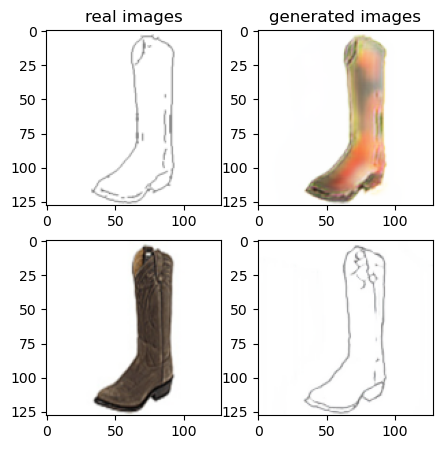

Train Epoch: 2 77% 	Total Loss: 1.311752 	Loss_G_AB: 0.278846	Loss_G_BA: 1.050498	Loss_cycle: 0.376228	Loss_D_A: 0.004340	Loss_D_B: 0.266512
1 88009 T:  0.9064109325408936
Train Epoch: 2 77% 	Total Loss: 1.246011 	Loss_G_AB: 0.253333	Loss_G_BA: 1.013929	Loss_cycle: 0.344440	Loss_D_A: 0.002864	Loss_D_B: 0.265076
1 88019 T:  0.6214034557342529
Train Epoch: 2 77% 	Total Loss: 1.230500 	Loss_G_AB: 0.281070	Loss_G_BA: 0.998826	Loss_cycle: 0.340872	Loss_D_A: 0.002336	Loss_D_B: 0.247345
1 88029 T:  0.6329634189605713
Train Epoch: 2 77% 	Total Loss: 1.307959 	Loss_G_AB: 0.288242	Loss_G_BA: 1.001403	Loss_cycle: 0.403582	Loss_D_A: 0.002973	Loss_D_B: 0.256582
1 88039 T:  0.6369132995605469
Train Epoch: 2 77% 	Total Loss: 1.216453 	Loss_G_AB: 0.289086	Loss_G_BA: 0.996766	Loss_cycle: 0.329357	Loss_D_A: 0.001361	Loss_D_B: 0.242808
1 88049 T:  0.6292362213134766
Train Epoch: 2 77% 	Total Loss: 1.148289 	Loss_G_AB: 0.275666	Loss_G_BA: 1.000836	Loss_cycle: 0.257496	Loss_D_A: 0.001350	Loss_D_B: 0.251192

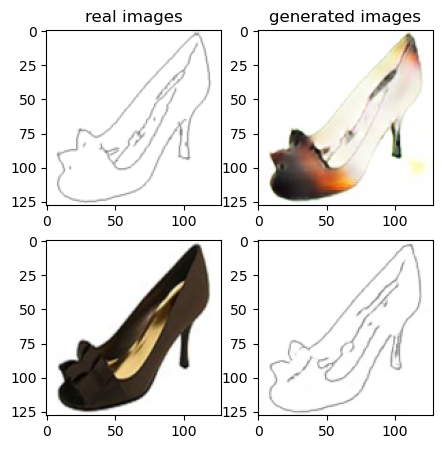

Train Epoch: 2 79% 	Total Loss: 1.300874 	Loss_G_AB: 0.333135	Loss_G_BA: 1.003029	Loss_cycle: 0.394149	Loss_D_A: 0.004530	Loss_D_B: 0.234113
1 89009 T:  0.9187216758728027
Train Epoch: 2 79% 	Total Loss: 1.301955 	Loss_G_AB: 0.326967	Loss_G_BA: 0.991629	Loss_cycle: 0.367888	Loss_D_A: 0.013968	Loss_D_B: 0.260801
1 89019 T:  0.6393847465515137
Train Epoch: 2 79% 	Total Loss: 1.583277 	Loss_G_AB: 0.358792	Loss_G_BA: 0.972625	Loss_cycle: 0.655629	Loss_D_A: 0.028919	Loss_D_B: 0.233021
1 89029 T:  0.6175282001495361
Train Epoch: 2 79% 	Total Loss: 1.250401 	Loss_G_AB: 0.312002	Loss_G_BA: 0.466314	Loss_cycle: 0.256167	Loss_D_A: 0.322812	Loss_D_B: 0.282265
1 89039 T:  0.6200063228607178
Train Epoch: 2 79% 	Total Loss: 1.122218 	Loss_G_AB: 0.358834	Loss_G_BA: 0.414042	Loss_cycle: 0.336923	Loss_D_A: 0.194025	Loss_D_B: 0.204832
1 89049 T:  0.6225717067718506
Train Epoch: 2 79% 	Total Loss: 1.181962 	Loss_G_AB: 0.293292	Loss_G_BA: 0.472030	Loss_cycle: 0.356562	Loss_D_A: 0.175481	Loss_D_B: 0.267258

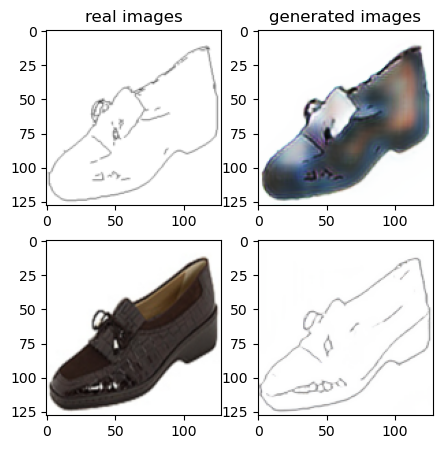

Train Epoch: 2 81% 	Total Loss: 1.266153 	Loss_G_AB: 0.291782	Loss_G_BA: 0.822546	Loss_cycle: 0.300525	Loss_D_A: 0.169531	Loss_D_B: 0.238933
1 90009 T:  0.9204046726226807
Train Epoch: 2 81% 	Total Loss: 1.140614 	Loss_G_AB: 0.245452	Loss_G_BA: 0.692008	Loss_cycle: 0.340168	Loss_D_A: 0.076207	Loss_D_B: 0.255510
1 90019 T:  0.6365010738372803
Train Epoch: 2 81% 	Total Loss: 1.082327 	Loss_G_AB: 0.266585	Loss_G_BA: 0.854084	Loss_cycle: 0.251529	Loss_D_A: 0.015864	Loss_D_B: 0.254600
1 90029 T:  0.624406099319458
Train Epoch: 2 81% 	Total Loss: 1.259483 	Loss_G_AB: 0.270508	Loss_G_BA: 0.852330	Loss_cycle: 0.325621	Loss_D_A: 0.119177	Loss_D_B: 0.253265
1 90039 T:  0.6394472122192383
Train Epoch: 2 81% 	Total Loss: 1.323402 	Loss_G_AB: 0.289439	Loss_G_BA: 0.931399	Loss_cycle: 0.436371	Loss_D_A: 0.045391	Loss_D_B: 0.231221
1 90049 T:  0.628556489944458
Train Epoch: 2 81% 	Total Loss: 1.367864 	Loss_G_AB: 0.293835	Loss_G_BA: 0.975047	Loss_cycle: 0.458855	Loss_D_A: 0.015075	Loss_D_B: 0.259493
1

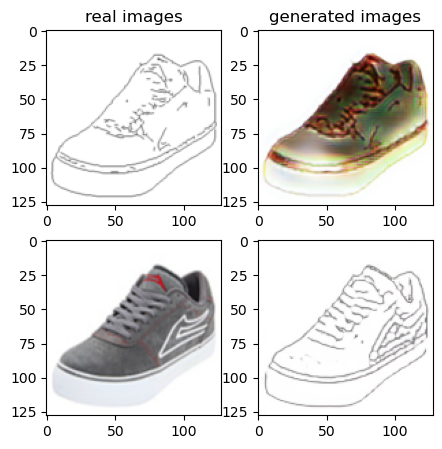

Train Epoch: 2 83% 	Total Loss: 1.103800 	Loss_G_AB: 0.253690	Loss_G_BA: 0.943760	Loss_cycle: 0.225408	Loss_D_A: 0.020463	Loss_D_B: 0.259204
1 91009 T:  0.9168555736541748
Train Epoch: 2 83% 	Total Loss: 1.179076 	Loss_G_AB: 0.266775	Loss_G_BA: 1.011995	Loss_cycle: 0.271594	Loss_D_A: 0.009978	Loss_D_B: 0.258119
1 91019 T:  0.6350827217102051
Train Epoch: 2 83% 	Total Loss: 1.354296 	Loss_G_AB: 0.303475	Loss_G_BA: 1.008459	Loss_cycle: 0.477591	Loss_D_A: 0.003846	Loss_D_B: 0.216892
1 91029 T:  0.6257150173187256
Train Epoch: 2 83% 	Total Loss: 1.227625 	Loss_G_AB: 0.289274	Loss_G_BA: 1.025803	Loss_cycle: 0.310295	Loss_D_A: 0.003892	Loss_D_B: 0.255899
1 91039 T:  0.6234786510467529
Train Epoch: 2 83% 	Total Loss: 1.251630 	Loss_G_AB: 0.278620	Loss_G_BA: 0.944279	Loss_cycle: 0.366455	Loss_D_A: 0.006599	Loss_D_B: 0.267127
1 91049 T:  0.6302032470703125
Train Epoch: 2 83% 	Total Loss: 1.269130 	Loss_G_AB: 0.253434	Loss_G_BA: 1.053187	Loss_cycle: 0.342411	Loss_D_A: 0.002988	Loss_D_B: 0.270421

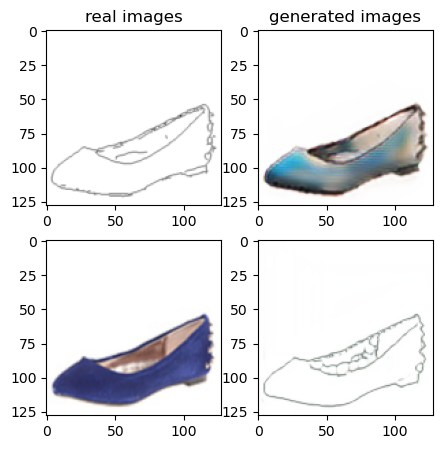

Train Epoch: 2 85% 	Total Loss: 1.173208 	Loss_G_AB: 0.322397	Loss_G_BA: 0.987835	Loss_cycle: 0.291040	Loss_D_A: 0.005214	Loss_D_B: 0.221838
1 92009 T:  0.9274411201477051
Train Epoch: 2 85% 	Total Loss: 1.195170 	Loss_G_AB: 0.396533	Loss_G_BA: 0.986626	Loss_cycle: 0.346500	Loss_D_A: 0.003198	Loss_D_B: 0.153892
1 92019 T:  0.6236841678619385
Train Epoch: 2 85% 	Total Loss: 1.129132 	Loss_G_AB: 0.358475	Loss_G_BA: 0.984551	Loss_cycle: 0.225981	Loss_D_A: 0.004835	Loss_D_B: 0.226803
1 92029 T:  0.6368041038513184
Train Epoch: 2 85% 	Total Loss: 1.250674 	Loss_G_AB: 0.264898	Loss_G_BA: 0.991989	Loss_cycle: 0.300996	Loss_D_A: 0.006628	Loss_D_B: 0.314607
1 92039 T:  0.645822286605835
Train Epoch: 2 85% 	Total Loss: 1.161807 	Loss_G_AB: 0.280729	Loss_G_BA: 0.905758	Loss_cycle: 0.281222	Loss_D_A: 0.016201	Loss_D_B: 0.271140
1 92049 T:  0.6218934059143066
Train Epoch: 2 85% 	Total Loss: 1.319820 	Loss_G_AB: 0.269758	Loss_G_BA: 1.052223	Loss_cycle: 0.387057	Loss_D_A: 0.011426	Loss_D_B: 0.260347


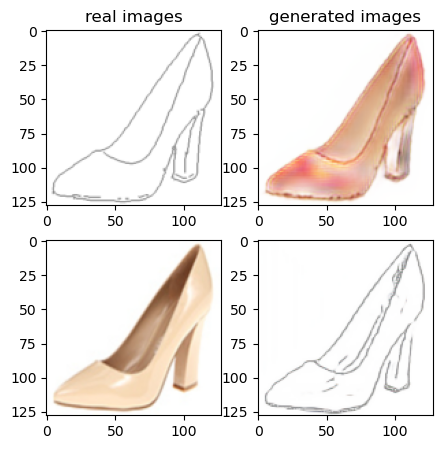

Train Epoch: 2 87% 	Total Loss: 1.188101 	Loss_G_AB: 0.275032	Loss_G_BA: 1.001426	Loss_cycle: 0.300465	Loss_D_A: 0.001390	Loss_D_B: 0.248017
1 93009 T:  0.9004449844360352
Train Epoch: 2 87% 	Total Loss: 1.119788 	Loss_G_AB: 0.327239	Loss_G_BA: 0.948217	Loss_cycle: 0.283671	Loss_D_A: 0.014951	Loss_D_B: 0.183438
1 93019 T:  0.6371791362762451
Train Epoch: 2 87% 	Total Loss: 1.414185 	Loss_G_AB: 0.291498	Loss_G_BA: 1.022315	Loss_cycle: 0.444054	Loss_D_A: 0.001716	Loss_D_B: 0.311510
1 93029 T:  0.6482157707214355
Train Epoch: 2 87% 	Total Loss: 1.196079 	Loss_G_AB: 0.343530	Loss_G_BA: 0.991660	Loss_cycle: 0.308845	Loss_D_A: 0.001803	Loss_D_B: 0.217835
1 93039 T:  0.6358609199523926
Train Epoch: 2 87% 	Total Loss: 1.225108 	Loss_G_AB: 0.325188	Loss_G_BA: 0.998337	Loss_cycle: 0.322728	Loss_D_A: 0.001289	Loss_D_B: 0.239328
1 93049 T:  0.6217288970947266
Train Epoch: 2 87% 	Total Loss: 1.246644 	Loss_G_AB: 0.280738	Loss_G_BA: 1.004074	Loss_cycle: 0.351680	Loss_D_A: 0.002636	Loss_D_B: 0.249923

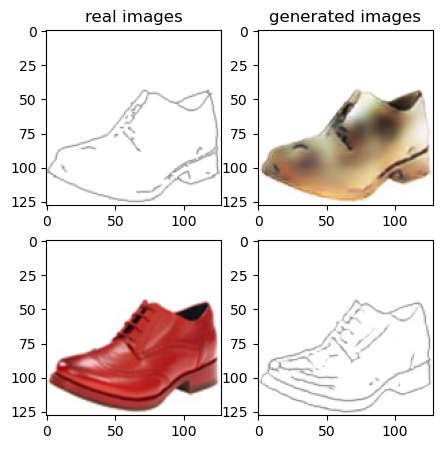

Train Epoch: 2 89% 	Total Loss: 1.205208 	Loss_G_AB: 0.386945	Loss_G_BA: 1.014944	Loss_cycle: 0.308806	Loss_D_A: 0.003718	Loss_D_B: 0.191740
1 94009 T:  1.010725975036621
Train Epoch: 2 89% 	Total Loss: 1.328059 	Loss_G_AB: 0.354778	Loss_G_BA: 0.990358	Loss_cycle: 0.390687	Loss_D_A: 0.001320	Loss_D_B: 0.263484
1 94019 T:  0.615943193435669
Train Epoch: 2 89% 	Total Loss: 1.259324 	Loss_G_AB: 0.264490	Loss_G_BA: 0.987568	Loss_cycle: 0.352420	Loss_D_A: 0.004348	Loss_D_B: 0.276527
1 94029 T:  0.6268181800842285
Train Epoch: 2 89% 	Total Loss: 1.337246 	Loss_G_AB: 0.295965	Loss_G_BA: 1.010305	Loss_cycle: 0.443450	Loss_D_A: 0.001782	Loss_D_B: 0.238878
1 94039 T:  0.6245546340942383
Train Epoch: 2 89% 	Total Loss: 1.261515 	Loss_G_AB: 0.296788	Loss_G_BA: 0.999318	Loss_cycle: 0.372578	Loss_D_A: 0.003125	Loss_D_B: 0.237760
1 94049 T:  0.6219332218170166
Train Epoch: 2 89% 	Total Loss: 1.360215 	Loss_G_AB: 0.280487	Loss_G_BA: 1.003902	Loss_cycle: 0.451844	Loss_D_A: 0.001938	Loss_D_B: 0.264239
1

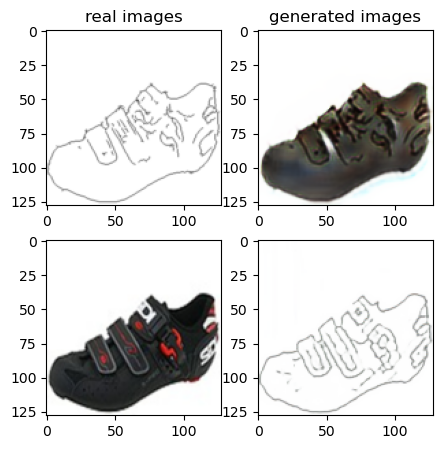

Train Epoch: 2 91% 	Total Loss: 1.182927 	Loss_G_AB: 0.268847	Loss_G_BA: 1.001388	Loss_cycle: 0.303011	Loss_D_A: 0.001354	Loss_D_B: 0.243445
1 95009 T:  0.9269256591796875
Train Epoch: 2 91% 	Total Loss: 1.155410 	Loss_G_AB: 0.265240	Loss_G_BA: 0.980933	Loss_cycle: 0.274019	Loss_D_A: 0.002586	Loss_D_B: 0.255720
1 95019 T:  0.6124982833862305
Train Epoch: 2 91% 	Total Loss: 1.214114 	Loss_G_AB: 0.262400	Loss_G_BA: 0.999913	Loss_cycle: 0.338767	Loss_D_A: 0.002609	Loss_D_B: 0.241582
1 95029 T:  0.6246070861816406
Train Epoch: 2 91% 	Total Loss: 1.194618 	Loss_G_AB: 0.295088	Loss_G_BA: 1.007482	Loss_cycle: 0.313345	Loss_D_A: 0.002225	Loss_D_B: 0.227763
1 95039 T:  0.6243131160736084
Train Epoch: 2 91% 	Total Loss: 1.415832 	Loss_G_AB: 0.308677	Loss_G_BA: 0.984409	Loss_cycle: 0.525224	Loss_D_A: 0.001951	Loss_D_B: 0.242114
1 95049 T:  0.6200337409973145
Train Epoch: 2 91% 	Total Loss: 1.336697 	Loss_G_AB: 0.330215	Loss_G_BA: 0.997206	Loss_cycle: 0.454656	Loss_D_A: 0.002755	Loss_D_B: 0.215574

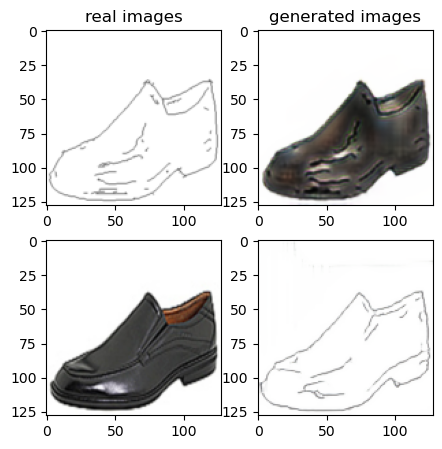

Train Epoch: 2 93% 	Total Loss: 1.220825 	Loss_G_AB: 0.257670	Loss_G_BA: 0.624207	Loss_cycle: 0.299748	Loss_D_A: 0.226683	Loss_D_B: 0.253456
1 96009 T:  0.9578638076782227
Train Epoch: 2 93% 	Total Loss: 1.113978 	Loss_G_AB: 0.271323	Loss_G_BA: 0.398685	Loss_cycle: 0.366991	Loss_D_A: 0.162727	Loss_D_B: 0.249256
1 96019 T:  0.645601749420166
Train Epoch: 2 93% 	Total Loss: 1.060920 	Loss_G_AB: 0.272388	Loss_G_BA: 0.635904	Loss_cycle: 0.254689	Loss_D_A: 0.100858	Loss_D_B: 0.251228
1 96029 T:  0.613745927810669
Train Epoch: 2 93% 	Total Loss: 1.159399 	Loss_G_AB: 0.258428	Loss_G_BA: 0.921376	Loss_cycle: 0.240042	Loss_D_A: 0.084049	Loss_D_B: 0.245406
1 96039 T:  0.6270678043365479
Train Epoch: 2 93% 	Total Loss: 1.240660 	Loss_G_AB: 0.254049	Loss_G_BA: 1.040724	Loss_cycle: 0.329354	Loss_D_A: 0.013606	Loss_D_B: 0.250312
1 96049 T:  0.6376636028289795
Train Epoch: 2 93% 	Total Loss: 1.122405 	Loss_G_AB: 0.263057	Loss_G_BA: 0.946942	Loss_cycle: 0.269171	Loss_D_A: 0.009898	Loss_D_B: 0.238337
1

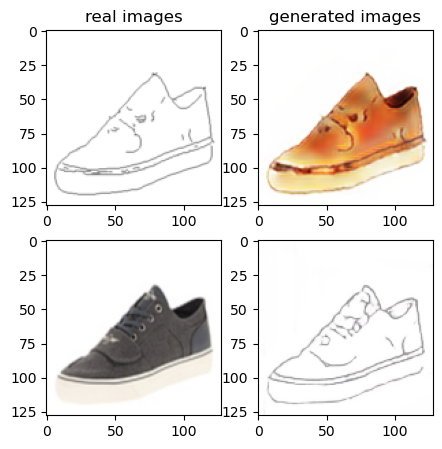

Train Epoch: 2 95% 	Total Loss: 1.239835 	Loss_G_AB: 0.332119	Loss_G_BA: 1.019060	Loss_cycle: 0.358921	Loss_D_A: 0.001696	Loss_D_B: 0.203628
1 97009 T:  0.9411790370941162
Train Epoch: 2 95% 	Total Loss: 1.217199 	Loss_G_AB: 0.250572	Loss_G_BA: 0.985777	Loss_cycle: 0.318692	Loss_D_A: 0.001917	Loss_D_B: 0.278415
1 97019 T:  0.6835014820098877
Train Epoch: 2 95% 	Total Loss: 1.229428 	Loss_G_AB: 0.273497	Loss_G_BA: 0.994869	Loss_cycle: 0.352580	Loss_D_A: 0.002956	Loss_D_B: 0.239709
1 97029 T:  0.642549991607666
Train Epoch: 2 95% 	Total Loss: 1.208406 	Loss_G_AB: 0.276226	Loss_G_BA: 0.998540	Loss_cycle: 0.325970	Loss_D_A: 0.003248	Loss_D_B: 0.241805
1 97039 T:  0.6483378410339355
Train Epoch: 2 95% 	Total Loss: 1.222829 	Loss_G_AB: 0.279133	Loss_G_BA: 1.007161	Loss_cycle: 0.334014	Loss_D_A: 0.006337	Loss_D_B: 0.239330
1 97049 T:  0.6245923042297363
Train Epoch: 2 95% 	Total Loss: 1.128712 	Loss_G_AB: 0.318616	Loss_G_BA: 0.996606	Loss_cycle: 0.226405	Loss_D_A: 0.001930	Loss_D_B: 0.242766


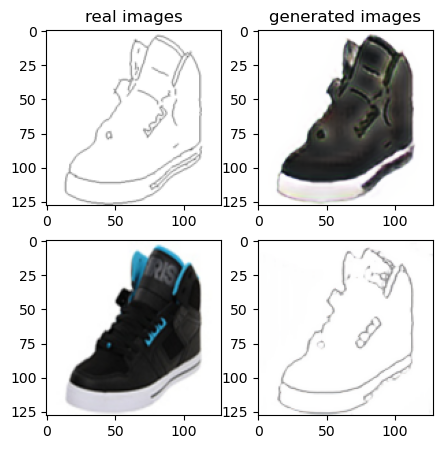

Train Epoch: 2 97% 	Total Loss: 1.214626 	Loss_G_AB: 0.278448	Loss_G_BA: 0.794520	Loss_cycle: 0.372503	Loss_D_A: 0.057230	Loss_D_B: 0.248409
1 98009 T:  0.9281814098358154
Train Epoch: 2 97% 	Total Loss: 1.234456 	Loss_G_AB: 0.280176	Loss_G_BA: 0.843757	Loss_cycle: 0.276326	Loss_D_A: 0.138268	Loss_D_B: 0.257895
1 98019 T:  0.6291985511779785
Train Epoch: 2 97% 	Total Loss: 1.244214 	Loss_G_AB: 0.269875	Loss_G_BA: 0.928140	Loss_cycle: 0.369306	Loss_D_A: 0.016782	Loss_D_B: 0.259119
1 98029 T:  0.6383564472198486
Train Epoch: 2 97% 	Total Loss: 1.244053 	Loss_G_AB: 0.284228	Loss_G_BA: 0.951905	Loss_cycle: 0.350832	Loss_D_A: 0.031407	Loss_D_B: 0.243748
1 98039 T:  0.6247749328613281
Train Epoch: 2 97% 	Total Loss: 1.236775 	Loss_G_AB: 0.259102	Loss_G_BA: 1.015013	Loss_cycle: 0.347351	Loss_D_A: 0.010154	Loss_D_B: 0.242214
1 98049 T:  0.6409661769866943
Train Epoch: 2 97% 	Total Loss: 1.268973 	Loss_G_AB: 0.287951	Loss_G_BA: 0.815960	Loss_cycle: 0.422040	Loss_D_A: 0.030181	Loss_D_B: 0.264796

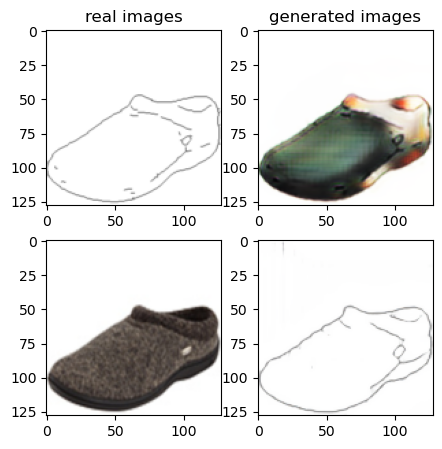

Train Epoch: 2 99% 	Total Loss: 1.274468 	Loss_G_AB: 0.286207	Loss_G_BA: 0.897261	Loss_cycle: 0.359297	Loss_D_A: 0.055219	Loss_D_B: 0.268218
1 99009 T:  0.9671680927276611
Train Epoch: 2 99% 	Total Loss: 1.211715 	Loss_G_AB: 0.295327	Loss_G_BA: 0.585455	Loss_cycle: 0.272760	Loss_D_A: 0.233120	Loss_D_B: 0.265444
1 99019 T:  0.6257140636444092
Train Epoch: 2 99% 	Total Loss: 1.126895 	Loss_G_AB: 0.282866	Loss_G_BA: 0.541336	Loss_cycle: 0.375713	Loss_D_A: 0.085996	Loss_D_B: 0.253085
1 99029 T:  0.6171965599060059
Train Epoch: 2 99% 	Total Loss: 1.277488 	Loss_G_AB: 0.260225	Loss_G_BA: 1.070671	Loss_cycle: 0.347551	Loss_D_A: 0.015117	Loss_D_B: 0.249372
1 99039 T:  0.6216182708740234
Train Epoch: 2 99% 	Total Loss: 1.274561 	Loss_G_AB: 0.259951	Loss_G_BA: 0.956590	Loss_cycle: 0.405736	Loss_D_A: 0.008839	Loss_D_B: 0.251715
1 99049 T:  0.6383700370788574
Train Epoch: 2 99% 	Total Loss: 1.282191 	Loss_G_AB: 0.294004	Loss_G_BA: 0.801021	Loss_cycle: 0.363680	Loss_D_A: 0.097138	Loss_D_B: 0.273860

In [ ]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
from datasets import *
from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt


# Training Configurations
# (You may put your needed configuration here. Please feel free to add more or use argparse. )
train_img_dir = './edge2shoes/train/'
img_shape = (3, 128, 128)
n_residual_blocks = 6
num_epochs = 2
batch_size = 1
lr_rate = 0.0002      # Adam optimizer learning rate
betas = (0.5, 0.999)  # Adam optimizer beta 1, beta 2
lambda_cyc = 10.0 	  # cycle loss weight
latent_dim = 8        # latent dimension for the encoded images from domain B
report_feq = 10        # Visualize image every 'report_feq' iters
visual_feq = 1000
save_feq = 1000      # Save models every 'save_feq' iters

# Random seeds (optional)
torch.manual_seed(1); np.random.seed(1)

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

train_dataset = Edge2Shoe(train_img_dir)
train_loader = data.DataLoader(train_dataset, batch_size=batch_size)
print('the length of training data:', len(train_dataset))
# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()

cuda = torch.cuda.is_available()

input_shape = img_shape

# Initialize generator and discriminator
G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)


if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)
    D_A = D_A.to(device)
    D_B = D_B.to(device)
    criterion_GAN.to(device)
    criterion_cycle.to(device)

# Initialize weights
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)



# Define optimizer
optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr_rate, betas=betas)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr_rate, betas=betas)
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr_rate, betas=betas)

# For adversarial loss
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

# loss recorder
running_loss_D_A = 0
running_loss_D_B = 0
running_loss_GAN_AB = 0
running_loss_GAN_BA = 0
running_loss_cycle = 0
running_total_loss = 0

loss_D_A = []
loss_D_B = []
loss_GAN_AB = []
loss_GAN_BA = []
loss_cycle = []
total_loss = []
# Training
total_steps = len(train_loader)*num_epochs; step = 0
#intermediate_save_iter = 0
for e in range(num_epochs):
    start = time.time()
    for idx, data in enumerate(train_loader):
        ########## Process Inputs ##########
        edge_tensor, rgb_tensor = data
        edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
        real_A = edge_tensor; real_B = rgb_tensor;

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_A.size(0), *D_A.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_A.size(0), *D_A.output_shape))), requires_grad=False)

        # ------------------
        #  Train Generators
        # ------------------
        G_AB.train(); G_BA.train()
        optimizer_G.zero_grad()

        # Generator loss
        loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
        loss_GAN_BA, fake_A = loss_generator(G_BA, real_B, D_A, valid, criterion_GAN)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

        # Cycle loss
        loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
        loss_cycle_B = loss_cycle_consis(G_AB, fake_A, real_B, criterion_cycle)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2

        # Total loss
        loss_G = loss_GAN + lambda_cyc * loss_cycle

        loss_G.backward()
        optimizer_G.step()


        # -----------------------
        #  Train Discriminator A
        # -----------------------

        optimizer_D_A.zero_grad()

        # function to compute loss_D_A
        loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)
        loss_D_A = loss_D_A / 2
        # update the D_A network
        loss_D_A.backward()
        optimizer_D_A.step()


        # -----------------------
        #  Train Discriminator B
        # -----------------------
        optimizer_D_B.zero_grad()

        # function to compute loss_D_A
        loss_D_B = loss_discriminator(fake_B, D_B, real_B, valid, fake, criterion_GAN)
        loss_D_B = loss_D_B / 2
        # update the D_B network
        loss_D_B.backward()
        optimizer_D_B.step()





        running_total_loss += (loss_GAN + lambda_cyc * loss_cycle + loss_D_A + loss_D_B).item()

        running_loss_GAN_AB += loss_GAN_AB.item()
        running_loss_GAN_BA += loss_GAN_BA.item()
        running_loss_D_A += loss_D_A.item()
        running_loss_D_B += loss_D_B.item()
        running_loss_cycle += lambda_cyc * loss_cycle.item()
        ########## Visualization ##########
        if step % report_feq == report_feq-1:
            print('Train Epoch: {} {:.0f}% \tTotal Loss: {:.6f} \tLoss_G_AB: {:.6f}\tLoss_G_BA: {:.6f}\tLoss_cycle: {:.6f}\tLoss_D_A: {:.6f}\tLoss_D_B: {:.6f}'.format
                    (e+1, 100. * idx / len(train_loader), running_total_loss / report_feq,
                    running_loss_GAN_AB/report_feq, running_loss_GAN_BA/report_feq,
                    running_loss_cycle/report_feq, running_loss_D_A/report_feq,
                    running_loss_D_B/report_feq))
            running_loss_D_A = 0
            running_loss_D_B = 0
            running_loss_GAN_AB = 0
            running_loss_GAN_BA = 0
            running_loss_cycle = 0
            running_total_loss = 0
            end = time.time()
            print(e, step, 'T: ', end-start)
            start = end
        ########## Visualize Generated images ##########
        if step % visual_feq == 0:
            vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            fig, axs = plt.subplots(2,2, figsize = (5,5))

            axs[0,0].imshow(vis_real_A.transpose(1,2,0))
            axs[0,0].set_title('real images')
            axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
            axs[0,1].set_title('generated images')
            axs[1,0].imshow(vis_real_B.transpose(1,2,0))
            axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
            plt.show()
        ########## Save Generators ##########
        if step % save_feq == save_feq-1:
            if not os.path.exists('models'): os.mkdir('models')
            torch.save(G_AB, './content/models/G_AB.pt')
            torch.save(G_BA, './content/models/G_BA.pt')
            # feel free to save checkpoint if you need retrain the model...

        step += 1

# CycleGAN testing (TODO)

In [ ]:
from torch.utils.data import DataLoader, TensorDataset
test_batch_size = 1
from datasets import *
from models import *
test_img_dir = '/content/drive/MyDrive/CIS-680 Adv CV/Project 6/edge2shoeskaggle/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# G_AB = torch.load('/content/drive/MyDrive/CIS-680 Adv CV/Project 6/test_case/G_AB.pt', map_location=torch.device('cpu'))
# G_BA = torch.load('/content/drive/MyDrive/CIS-680 Adv CV/Project 6/test_case/G_BA.pt', map_location=torch.device('cpu'))
G_AB = torch.load('G_AB.pt', map_location=torch.device('cpu'))
G_BA = torch.load('G_BA.pt', map_location=torch.device('cpu'))
# if cuda:
#     G_AB = G_AB.to(device)
#     G_BA = G_BA.to(device)

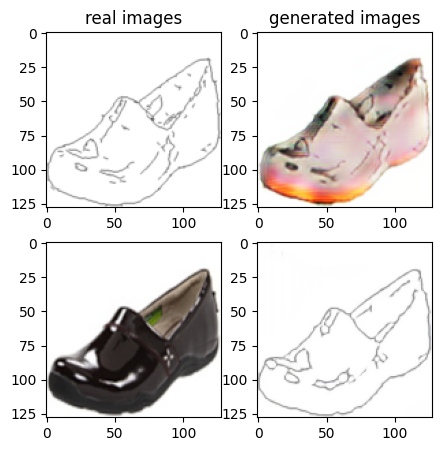

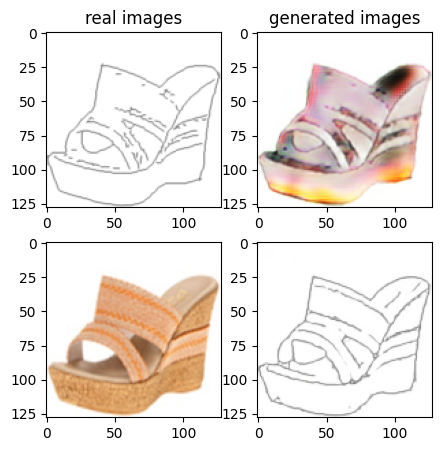

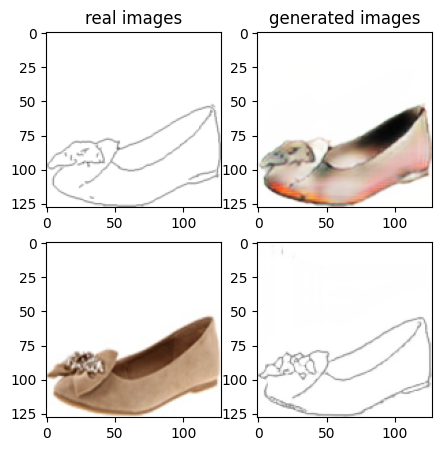

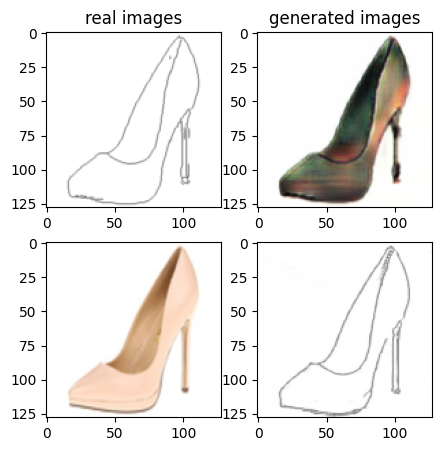

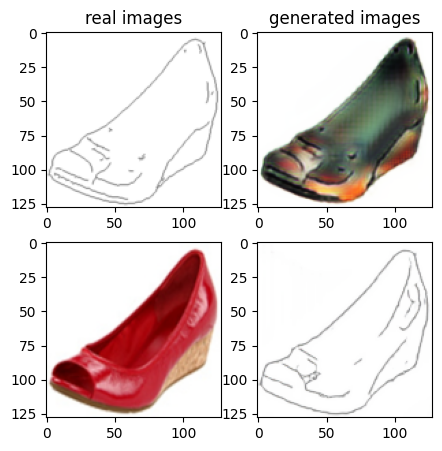

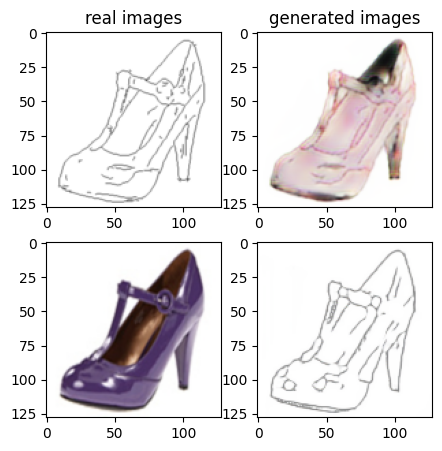

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

G_AB.eval()
G_BA.eval()

# Please visualize real_edge, fake_shoe, real_shoe, fake_edge in 2-by-2 grids:

# Function to convert tensor for display
def convert_for_display(tensor):
    return tensor.detach().cpu().numpy().transpose(1, 2, 0).astype(np.uint8)

# Visualize images in a 2x2 grid
def plot_images(axs, img, title, position):
    axs[position].imshow(img)
    axs[position].set_title(title)
    axs[position].axis('off')


# Visualize batches of images
def visualize_batches(test_loader, G_AB, G_BA, device, max_batches=4):
    for batch_num, (edges, rgbs) in enumerate(test_loader):
        # Normalize and move to device
        edges_normalized, rgbs_normalized = map(lambda x: norm(x).to(device), (edges, rgbs))

        # Generate fake images
        fake_rgbs, fake_edges = G_AB(edges_normalized), G_BA(rgbs_normalized)

        # Prepare images for display
        visuals = map(convert_for_display, (edges[0], fake_rgbs[0], rgbs[0], fake_edges[0]))

        # Plotting
        fig, axs = plt.subplots(2, 2, figsize=(10, 10))
        titles = ['real images', 'generated images', 'real shoe', 'generated edge']
        positions = [(0, 0), (0, 1), (1, 0), (1, 1)]
        for img, title, pos in zip(visuals, titles, positions):
            plot_images(axs, denorm(img), title, pos)

        # Save the plotted figure
        plt.savefig(f'/content/drive/MyDrive/CIS-680 Adv CV/Project 6/GANResults/CycleGAN_{batch_num}.png')
        plt.show()

        # Break the loop after visualizing the specified number of batches
        if batch_num >= max_batches - 1:
            break

# Execute the visualization function
visualize_batches(test_loader, G_AB, G_BA, device)


# Quantitative Evaluation

## FID Score computation

First, we have to create 6 datasets:
- Domain A real set 1
- Domain A real set 2
- Domain A generate set

- Domain B real set 1
- Domain B real set 2
- Domain B generate set



Create folder to save images and create dataset.

In [ ]:
! mkdir real_A_1 real_A_2 gen_A
! mkdir real_B_1 real_B_2 gen_B

A subdirectory or file real_A_1 already exists.
Error occurred while processing: real_A_1.
A subdirectory or file real_A_2 already exists.
Error occurred while processing: real_A_2.
A subdirectory or file gen_A already exists.
Error occurred while processing: gen_A.
A subdirectory or file real_B_1 already exists.
Error occurred while processing: real_B_1.
A subdirectory or file real_B_2 already exists.
Error occurred while processing: real_B_2.
A subdirectory or file gen_B already exists.
Error occurred while processing: gen_B.


In [ ]:
# First create test data loader
import matplotlib.pyplot as plt
def norm(image):
    normalized = image.float() / 255.0
    normalized = normalized - 0.5
    normalized = normalized * 2.0
    return normalized

def denorm(tensor):
    denormalized = tensor + 1.0
    denormalized = denormalized / 2.0
    denormalized = denormalized * 255.0
    return denormalized
from models import *
from datasets import *
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
test_batch_size = 1
test_img_dir = './edge2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

# indicate the device we will use
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#device = torch.device("cpu")

# Load learnt Generator G_AB and G_BA
G_AB = torch.load('./content/models/G_AB.pt').to(device)
G_BA = torch.load('./content/models/G_BA.pt').to(device)

# the size of dataset, we want to evaluate on
evaluate_num = 100

# make the gen data set and folder
real_A_set_1 = []
real_A_set_2 = []
real_B_set_1 = []
real_B_set_2 = []

gen_set_A = []
gen_set_B = []


for idx, data in enumerate(test_loader, 0):
    # print("Enteered the loop")
    real_A, real_B = data
    # plt.imshow(real_A.type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)
    # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    # print(real_A.shape)

    if idx < evaluate_num:
        fake_A = G_BA(real_B)
        fake_B = G_AB(real_A)
        real_A_set_1.append(denorm(real_A.detach()))
        real_B_set_1.append(denorm(real_B.detach()))
        gen_set_A.append(denorm(fake_A.detach()))
        gen_set_B.append(denorm(fake_B.detach()))

        # plt.imshow(data[0].type(torch.uint8).squeeze(0).permute(1,2,0))
        # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
        # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
        # plt.show()
        plt.imsave('./real_A_1/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_1/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_A/gen_A' + str(idx) + '.png', denorm(fake_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_B/gen_B' + str(idx) + '.png', denorm(fake_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).type(torch.uint8).squeeze(), './real_A_1/real_A' + str(idx) + '.png', normalize=False)

        # save_image(denorm(real_B).detach().squeeze(), './real_B_1/real_B' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_A).detach().squeeze(), './gen_A/gen_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_B).detach().squeeze(), './gen_B/gen_B' + str(idx) + '.png', normalize=False)
        # del real_A; del real_B; del fake_A; del fake_B

    elif evaluate_num <= idx < 2*evaluate_num:
        real_A_set_2.append(real_A.detach())
        real_B_set_2.append(real_B.detach())
        plt.imsave('./real_A_2/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_2/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).detach().squeeze(), './real_A_2/real_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(real_B).detach().squeeze(), './real_B_2/real_B' + str(idx) + '.png', normalize=False)

    if idx == 2*evaluate_num-1:
        break
# make 6 pytorch dataset
real_A_dataset_1 = TensorDataset(torch.cat(real_A_set_1))
real_A_dataset_2 = TensorDataset(torch.cat(real_A_set_2))
real_B_dataset_1 = TensorDataset(torch.cat(real_B_set_1))
real_B_dataset_2 = TensorDataset(torch.cat(real_B_set_2))
gen_dataset_A = TensorDataset(torch.cat(gen_set_A))
gen_dataset_B = TensorDataset(torch.cat(gen_set_B))



## Compute FID score

In [ ]:
! pip install pytorch-fid

In [ ]:
print('computing FID score between real_edge_1 and real_edge_2')
! python -m pytorch_fid './real_A_1/' './real_A_2/' --device cpu

print('computing FID score between real_edge_1 and gen_edge')
! python -m pytorch_fid './real_A_1' './gen_A'

print('computing FID score between real_shoe_1 and real_shoe_2')
! python -m pytorch_fid './real_B_1' './real_B_2'

print('computing FID score between real_shoe_1 and gen_shoe')
! python -m pytorch_fid './real_B_1' './gen_B'

## Compute IS score

In [ ]:
from inception_score import inception_score
import warnings
warnings.filterwarnings("ignore")

print('IS score for real_edge_1 data set:')
print(inception_score(real_A_dataset_1, cuda=False, batch_size=64, resize=True, splits=1))
print('IS score for gen_edge data set:')
print(inception_score(gen_dataset_A, cuda=False, batch_size=64, resize=True, splits=1))


print('IS score for real_shoe_1:')
print(inception_score(real_B_dataset_1, cuda=False, batch_size=64, resize=True, splits=1))
print('IS score for gen_shoe data set:')
print(inception_score(gen_dataset_B, cuda=False, batch_size=64, resize=True, splits=1))

IS score for real_edge_1 data set:


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to C:\Users\shreh/.cache\torch\hub\checkpoints\inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:02<00:00, 42.6MB/s] 


(1.0023334689130028, 0.0)
IS score for gen_edge data set:
(1.0041625128016078, 0.0)
IS score for real_shoe_1:
(3.7348345793313884, 0.0)
IS score for gen_shoe data set:
(2.6977522258122946, 0.0)


###Model Tuning

In my model tuning process, I experimented with different hyperparameters to find the optimal configuration. I started by adjusting the learning rate, as it significantly impacts how quickly or slowly the model learns. I also tweaked the batch size to see how different amounts of data per training iteration affected performance. To prevent overfitting, I played with dropout rates, which helped in making the model more generalized. Lastly, I fine-tuned the number of layers and units in each layer to strike a balance between model complexity and training efficiency.
